In [313]:
import pandas as pd
final_df=pd.read_csv('./Downloads/random+1000.csv')

In [314]:
final_df.columns

Index(['DSN', 'OEM Model', 'Property Name', 'OEM', 'Charging Value', 'Value',
       'Created At', 'Property Value'],
      dtype='object')

In [317]:
final_df['Created At']=pd.to_datetime(final_df['Created At'])

In [318]:
#final_df['Created At']=final_df['Created At'].map(str).apply(lambda x:x[:19])

In [319]:
#final_df['Created At']=pd.to_datetime(final_df['Created At'])

In [320]:
final_df['DSN'].nunique()

995

In [321]:
final_df['Created At'].min()

Timestamp('2019-09-08 01:34:15')

In [188]:
(final_df['Created At'].max()-final_df['Created At'].min())/21

Timedelta('10 days 00:46:56')

In [189]:
final_df['DSN'].nunique()

995

In [190]:
final_df.columns

Index(['DSN', 'OEM Model', 'Property Name', 'OEM', 'Charging Value', 'Value',
       'Created At', 'Property Value'],
      dtype='object')

In [476]:
final_df=final_df.sort_values(['DSN','Created At'])

In [477]:
final_df=final_df[final_df['Property Name']!='GET_RSSI']
#     chunk=chunk[chunk['Property Name'].isin(['GET_Error_Code','GET_Charging_Status', 'RunTimeCumulative',
#        'RunTimeCycle', 'GET_PbFloor_Confidence', 'SET_DeleteMaps',
#        'GET_Cleaning_Statistics', 'GET_MissionComplete','Told to Dock','Told to Clean','Told to Pause','Told to Re-Dock'])]
final_df['event']=final_df['Property Name']+','+final_df['Value'].map(str)+','+final_df['Charging Value'].map(str)


In [478]:
final_df['event_next']=final_df['event'].shift(-1)

In [479]:
import numpy as np
final_df.loc[(final_df['DSN']!=final_df['DSN'].shift(-1)),'event_next']=np.nan
final_df=final_df[final_df['event']!=final_df['event_next']]

In [480]:
final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==-1),'error']= 'Error = -1' 
final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==0),'error']= 'Error = 0' 
final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==1),'error']= 'Reserved / 2017 Overcurrent Error' 
final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==2),'error']= 'Side Brush Error' 
final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==3),'error']= 'Fan Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==4),'error']= 'Main Brush Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==5),'error']= 'Wheels Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==6),'error']= 'Bumper Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==7),'error']= 'Cliff Sensor Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==8),'error']= 'No Battery/Fuse Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==9),'error']= 'No Dustbox Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==10),'error']= 'Drop Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==11),'error']= 'Front Wheel Error' 
final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==12),'error']= 'Charger Error' 
final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==14),'error']= 'Mag Strip Error' 
final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==16),'error']= 'Top Bumper Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==17),'error']= 'Battery Life Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==18),'error']= 'Wheel Encoder Error' 

final_df.loc[(final_df['Property Name']=='GET_Error_Code') & (final_df['Value']==19),'error']= 'Accel Error' 



final_df.loc[(final_df['Property Name']=='GET_Operating_Mode') & (final_df['Value']==0),'Property Name']= 'Entered Paused Mode' 
final_df.loc[(final_df['Property Name']=='GET_Operating_Mode') & (final_df['Value']==1),'Property Name']= 'Entered Spot Mode' 
final_df.loc[(final_df['Property Name']=='GET_Operating_Mode') & (final_df['Value']==2),'Property Name']= 'Entered Clean Mode'  
final_df.loc[(final_df['Property Name']=='GET_Operating_Mode') & (final_df['Value']==3),'Property Name']= 'Entered Dock Mode' 
final_df.loc[(final_df['Property Name']=='GET_Operating_Mode') & (final_df['Value']==-63),'Property Name']= 'Entered Re-Dock Mode'  

final_df.loc[(final_df['Property Name']=='SET_Operating_Mode') & (final_df['Value']==0),'Property Name']= 'Told to Pause' 
final_df.loc[(final_df['Property Name']=='SET_Operating_Mode') & (final_df['Value']==1),'Property Name']= 'Told to enter Spot Mode' 
final_df.loc[(final_df['Property Name']=='SET_Operating_Mode') & (final_df['Value']==2),'Property Name']= 'Told to Clean' 
final_df.loc[(final_df['Property Name']=='SET_Operating_Mode') & (final_df['Value']==3),'Property Name']= 'Told to Dock' 
final_df.loc[(final_df['Property Name']=='SET_Operating_Mode') & (final_df['Value']==-63),'Property Name']= 'Told to Re-Dock' 




final_df.loc[(final_df['Property Name']=='GET_Charging_Status') & (final_df['Charging Value']==0),'Property Name']= 'Lost Charging Contact' 
final_df.loc[(final_df['Property Name']=='GET_Charging_Status') & (final_df['Charging Value']==1),'Property Name']= 'Contacted Charging Dock'
# final_df.loc[(final_df['Property Name']=='SET_Evacuate_Resume') & (final_df['Charging Value']==0),'Property Name']= 'Evacuate Resume Disabled'  
# final_df.loc[(final_df['Property Name']=='SET_Evacuate_Resume') & (final_df['Charging Value']==1),'Property Name']= 'Evacuate Resume Enabled'
# final_df.loc[(final_df['Property Name']=='SET_Recharge_Resume') & (final_df['Charging Value']==0),'Property Name']= 'Recharge Resume Disabled'  

# final_df.loc[(final_df['Property Name']=='SET_Recharge_Resume') & (final_df['Charging Value']==1),'Property Name']= 'Recharge Resume Enabled'
final_df['Created At']=pd.to_datetime(final_df['Created At'])



In [481]:
final_df['Created At']=pd.to_datetime(final_df['Created At'])

In [482]:
#final_df.to_csv('costco.csv',index=False)

In [483]:
final_df.shape

(1760079, 11)

In [484]:
final_df=final_df[final_df['Property Name'].isin(['GET_Error_Code','Contacted Charging Dock', 'Entered Dock Mode',
                                        'Lost Charging Contact','Entered Paused Mode', 'Entered Clean Mode', 'RunTimeCumulative',
       'RunTimeCycle', 'GET_PbFloor_Confidence', 
       'GET_Cleaning_Statistics', 'Entered Re-Dock Mode','GET_MissionComplete','Told to Dock','Told to Clean','Told to Pause','Told to Re-Dock'])]

In [485]:
final_df['Created At'].min()

Timestamp('2019-09-08 01:34:15')

In [486]:
final_df['quarter']=((final_df['Created At']-final_df['Created At'].min()).dt.days/21).map(int)

In [487]:
final_df['quarter']

382199      5
496659      5
382201      5
412100      5
472020      5
           ..
1756857     9
1714004     9
1713079    10
1714323    10
1713080    10
Name: quarter, Length: 1584371, dtype: int64

In [203]:
#final_df.groupby(['DSN']).apply(getlastweek).reset_index(drop=True)

In [195]:
#returned[returned['DSN']=='AC000W008128921']['Created']

In [337]:
# def fun(data):
#     data['created_next']=data['Created At'].shift(-1)
#     data['dur']=(data['created_next']-data['Created At']).dt.total_seconds()/60
#     data['date']=data['Created At'].dt.date
#     time=data[data['Property Name']=='RunTimeCycle']
#     usagefreq=time['Value'].count()
#     daily=time.groupby('date')['Value'].agg(['count'])
#     #print(daily.mean().T)
#     #online=(data['Created At'].max()-data['Created At'].min()).total_seconds()/60
#     err=data.groupby(['error']).size()
#     error=data[data['Property Name']=='GET_Error_Code']
#     error['error_next']=error['error'].shift(-1)
#     error['dur_err']=(error['Created At'].shift(-1)-error['Created At']).dt.total_seconds()/60

#     clear=error[(error['error_next']=='Error = 0')&(error['error']!='Error = 0')]
#     #print(error)
# #     if len(clear)>0:
# #         print( clear.groupby('error')['dur_err'].sum())
#     errordur=clear.groupby('error')['dur_err'].sum()
#     errordur.index= [i+' time to clear' for i in errordur.index]
#     errorfreq=clear.groupby('error')['dur_err'].count()
#     errorfreq.index= [i+'#clear' for i in errorfreq.index]
# #     cap=data[data['Property Name']=='GET_Battery_Capacity']
# #     cap['rate']=cap['Value'].diff()/(cap['Created At'].diff().dt.total_seconds()+0.001)
# #     charge=sum(cap['rate']>0)
# #     discharge=sum(cap['rate']<0)
# #     if len(cap['rate'].dropna())>0:
# #         max_charge=max(cap['rate'].dropna())
# #         mean=(cap['rate'].dropna()).mean()
# #         median=(cap['rate'].dropna()).median()
# #         maxdischarge=min(cap['rate'].dropna())
# #         q01=cap['rate'].dropna().quantile(0.1)
# #         q09=cap['rate'].dropna().quantile(0.9)
# #     else: 
# #         max_charge=0
# #         mean=0
# #         median=0
# #         maxdischarge=0
# #         q01=0
# #         q09=0
#    # print(cap[cap['rate']==5000])
# #     version=[data[data['Property Name']=='GET_SCM_FW_Version']['Value'].iloc[0] ,
# #     data[data['Property Name']=='GET_WiFi_HW_Version']['Value'].iloc[0],
# #     data[data['Property Name']=='GET_Main_PCB_HW_Version']['Value'].iloc[0] ,
# #     data[data['Property Name']=='GET_Nav_Module_FW_Version']['Value'].iloc[0],
# #     data[data['Property Name']=='GET_Device_Model_Number']['Value'].iloc[0],
# #     data[data['Property Name']=='GET_Main_PCB_FW_Version']['Value'].iloc[0],
# #     data[data['Property Name']=='GET_Main_PCB_BL_Version']['Value'].iloc[0],
# #     data[data['Property Name']=='GET_Nav_Module_HW_Version']['Value'].iloc[0] ,
# #     data[data['Property Name']=='GET_Nav_Module_BL_Version']['Value'].iloc[0]]
# #     v=pd.DataFrame(version,index=['GET_SCM_FW_Version','GET_WiFi_HW_Version','GET_Main_PCB_HW_Version','GET_Nav_Module_FW_Version',
# #                                'GET_Device_Model_Number','GET_Main_PCB_FW_Version','GET_Main_PCB_BL_Version','GET_Nav_Module_HW_Version','GET_Nav_Module_BL_Version'])
#     #print(a)
#     #print(err)
#     #print(errordur.T)
#     #print(pd.concat([daily.mean().T,err.T,a,errordur.T,errorfreq.T]).T)
    
    
#     # local time stamp

#     try:
#         maps=data[data['Property Name']=='GET_PbFloor_Confidence'].iloc[-1]['Value']
        
#     except: maps=0
#     #print(maps)
#     mapdel=len(data[(data['Property Name']=='SET_DeleteMaps')&(data['Value']==-1)])
#     cycles=len(cap[(cap['Value'].diff()>0)&(cap['Value']==100)])
#     #print(cap[(cap['Value'].diff()>0)&(cap['Value']==100)])
# #     try:
# #         version1=data[data['Property Name']=='GET_Nav_Module_App_Version'].iloc[-1]['Value']
# #     except: version1=''
# #     try:
# #         version2=data[data['Property Name']== 'OTA_FW_VERSION'].iloc[-1]['Value']
# #     except: version2=''

#     recharge=data[data['Property Name']=='SET_Recharge_Resume']['Charging Value'].max()
#     evacuate=data[data['Property Name']=='SET_Evacuate_Resume']['Charging Value'].max()
#     #print([maps,mapdel,cycles,version1,version2,recharge,evacuate])
#     a=pd.DataFrame([usagefreq,maps,mapdel,cycles,recharge,evacuate],index=['runfreq','map_confidence','delmap','charge_cycle','recharge','evacuate'])


#     return pd.concat([daily.mean().T,err.T,a,errordur.T,errorfreq.T]).T

In [160]:
#final_df[final_df['Property Name']=='GET_PbFloor_Confidence']

In [338]:
#part=final_df.groupby(['DSN']).apply(fun).reset_index()

In [217]:
part.columns

Index(['DSN', 'level_1', 'sum', 'count', 'Error = 0', 'totalruntime',
       'runfreq', 'chargefreq', 'dischargefreq', 'max_chargerate',
       'min_chargerate', 'meanrate', 'medianrate', 'q01rate', 'q09rate',
       'min_chargelevel', 'map_confidence', 'delmap', 'charge_cycle',
       'recharge', 'evacuate', 'No Dustbox Error',
       'No Dustbox Error time to clear', 'No Dustbox Error#clear',
       'Cliff Sensor Error', 'Cliff Sensor Error time to clear',
       'Cliff Sensor Error#clear', 'Bumper Error', 'Drop Error',
       'Front Wheel Error', 'No Battery/Fuse Error',
       'No Battery/Fuse Error time to clear', 'No Battery/Fuse Error#clear',
       'Drop Error time to clear', 'Drop Error#clear',
       'Front Wheel Error time to clear', 'Front Wheel Error#clear',
       'Wheel Encoder Error', 'Wheel Encoder Error time to clear',
       'Wheel Encoder Error#clear', 'Wheels Error',
       'Wheels Error time to clear', 'Wheels Error#clear',
       'Bumper Error time to clear', 'Bu

In [858]:
#part=part.fillna(0).groupby(['DSN']).mean().reset_index(drop=False)

In [859]:
#part.fillna(0).groupby(['DSN']).mean().reset_index(drop=False).columns

In [ ]:
final_df.loc[(final_df['Property Name']=='GET_Charging_Status') & (final_df['Charging Value']==0),'Property Name']= 'Lost Charging Contact' 
final_df.loc[(final_df['Property Name']=='GET_Charging_Status') & (final_df['Charging Value']==1),'Property Name']= 'Contacted Charging Dock'
# final_df.loc[(final_df['Property Name']=='SET_Evacuate_Resume') & (final_df['Charging Value']==0),'Property Name']= 'Evacuate Resume Disabled'  
# final_df.loc[(final_df['Property Name']=='SET_Evacuate_Resume') & (final_df['Charging Value']==1),'Property Name']= 'Evacuate Resume Enabled'
# final_df.loc[(final_df['Property Name']=='SET_Recharge_Resume') & (final_df['Charging Value']==0),'Property Name']= 'Recharge Resume Disabled'  

# final_df.loc[(final_df['Property Name']=='SET_Recharge_Resume') & (final_df['Charging Value']==1),'Property Name']= 'Recharge Resume Enabled'



In [25]:
part[part['DSN']==dsns[2]]

,DSN,level_1,sum,count,No Dustbox Error,totalruntime,runfreq,chargefreq,dischargefreq,max_chargerate,...,Wheel Encoder Error#clear,Bumper Error time to clear,Bumper Error#clear,Drop Error time to clear,Drop Error#clear,Cliff Sensor Error time to clear,Cliff Sensor Error#clear,Wheels Error time to clear,Wheels Error#clear,Main Brush Error
26,AC000W007127994,0,NaN,NaN,NaN,0.0,0.0,72.0,84.0,0.066666,...,NaN,NaN,NaN,1344.916667,1.0,NaN,NaN,NaN,NaN,NaN


In [26]:
#data=final_df[final_df['Property Name']!='GET_RSSI']

In [219]:
#signal=final_df[final_df['Property Name']=='GET_RSSI']

In [220]:
final_df.shape

(52273, 13)

In [488]:
missions=final_df[final_df['Property Name'].isin(['GET_Error_Code','Contacted Charging Dock', 'Entered Dock Mode',
                                        'Lost Charging Contact','Entered Paused Mode', 'Entered Clean Mode', 'RunTimeCumulative',
       'RunTimeCycle', 'GET_PbFloor_Confidence', 
       'GET_Cleaning_Statistics', 'Entered Re-Dock Mode','GET_MissionComplete','Told to Dock','Told to Clean','Told to Pause','Told to Re-Dock'])]

In [489]:
missions.loc[missions['Property Name']=='Told to Dock','Property Name']='Entered Dock Mode'
#missions.loc[missions['Property Name']=='Told to Clean','Property Name']='Entered Clean Mode'
missions.loc[missions['Property Name']=='Told to Pause','Property Name']='Entered Paused Mode'
missions.loc[missions['Property Name']=='Told to Re-Dock','Property Name']='Entered Re-Dock Mode'

In [490]:
#missions['Property Name']=missions['PROPERTY_NAME']

In [491]:
import numpy as np
missions=missions.sort_values(['DSN','Created At'])
missions['Property Name next']=missions['Property Name'].shift(-1)
missions.loc[(missions['DSN']!=missions['DSN'].shift(-1)),'Property Name next']=np.nan
missions=missions[missions['Property Name']!=missions['Property Name next']]

In [492]:
missions['Created At']=pd.to_datetime(missions['Created At'])

In [493]:
def calculate_runtime(data):
    events=list(data['Property Name'])
    if data['OEM Model'].iloc[0]=='RV1000' or data['OEM Model'].iloc[0]=='RV1000A':
        
        if 'GET_Cleaning_Statistics' in events:
            #print('success')
            runtime=(data[data['Property Name']=='GET_Cleaning_Statistics'].iloc[0]['Created At']-data.iloc[0]['Created At']).total_seconds()
            data['runtime']=int(runtime/60)
            
            if 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events and 'GET_Error_Code' not in events:
                data['job']=1
#                 runtime1=(data[data['Property Name']=='Entered Dock Mode']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
#                 if runtime>runtime1:
#                     data['runtime']=int(runtime/60)
            elif 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events:
                data['job']=0
                
#                 runtime=(data[data['Property Name']=='Contacted Charging Dock']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
#                 data['runtime']=int(runtime/60)
                
            else: data['job']=0
            
        elif 'RunTimeCycle' in events:  
            #print('cycle')
            runtime=(data[data['Property Name']=='RunTimeCycle'].iloc[0]['Created At']-data.iloc[0]['Created At']).total_seconds()
            #print(runtime)


            data['runtime']=int(runtime/60)

            if 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events and 'GET_Error_Code' not in events:
                data['job']=1
#                 runtime1=(data[data['Property Name']=='Entered Dock Mode']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
#                 if runtime>runtime1:
#                     data['runtime']=int(runtime/60)
            elif 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events:
                data['job']=0
                
#                 runtime=(data[data['Property Name']=='Contacted Charging Dock']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
#                 data['runtime']=int(runtime/60)
                
            else: data['job']=0
        elif 'RunTimeCumulative' in events:
            runtime=(data[data['Property Name']=='RunTimeCumulative'].iloc[0]['Created At']-data.iloc[0]['Created At']).total_seconds()

            data['runtime']=int(runtime/60)
            
            if 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events and 'GET_Error_Code' not in events:
                data['job']=1
#                 runtime=(data[data['Property Name']=='Contacted Charging Dock']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
#                 data['runtime']=int(runtime/60)
            elif 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events:
                data['job']=0
                
#                 runtime=(data[data['Property Name']=='Contacted Charging Dock']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
#                 data['runtime']=int(runtime/60)
                
            else: data['job']=0
        else:
            runtime=(data.iloc[-1]['Created At']-data.iloc[0]['Created At']).total_seconds()
            data['runtime']=int(runtime/60)
            if 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events and 'GET_Error_Code' not in events:
                data['job']=1
                runtime=(data[data['Property Name']=='Entered Dock Mode']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
                data['runtime']=int(runtime/60)
            elif 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events:
                data['job']=0
                
                runtime=(data[data['Property Name']=='Entered Dock Mode']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
                data['runtime']=int(runtime/60)
                
            else: data['job']=0
    else:
        #print('youpt')
        if 'RunTimeCycle' in events:  
#             runtime=(data[data['Property Name']=='RunTimeCycle'].iloc[0]['Created At']-data.iloc[0]['Created At']).total_seconds()
#             data['runtime']=int(runtime/60)
            #print(data[data['Property Name']=='RunTimeCycle']['Value'])
            data['runtime']=data[data['Property Name']=='RunTimeCycle']['Value'].iloc[0]
            if 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events and 'GET_Error_Code' not in events:
                data['job']=1
            elif 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events:
                data['job']=0
                
                
                
            else: data['job']=0
            
            
            
            
        elif 'RunTimeCumulative' in events:
            runtime=(data[data['Property Name']=='RunTimeCumulative'].iloc[0]['Created At']-data.iloc[0]['Created At']).total_seconds()
            data['runtime']=int(runtime/60)
            if 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events and 'GET_Error_Code' not in events:
                data['job']=1
#                 runtime1=(data[data['Property Name']=='Contacted Charging Dock']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
#                 if runtime>runtime1:
#                     data['runtime']=int(runtime1/60)
                
            elif 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events:
                data['job']=0
                
#                 runtime=(data[data['Property Name']=='Contacted Charging Dock']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
#                 data['runtime']=int(runtime/60)
            else: data['job']=0
            
        else:
            #print(data[data['Property Name']=='Contacted Charging Dock']['Created At'].min())
            runtime=(data.iloc[-1]['Created At']-data.iloc[0]['Created At']).total_seconds()
            data['runtime']=int(runtime/60)
            if 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events and 'GET_Error_Code' not in events:
                data['job']=1
                
                runtime=(data[data['Property Name']=='Entered Dock Mode']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
                data['runtime']=int(runtime/60)
            elif 'Contacted Charging Dock' in events and 'Entered Dock Mode' in events:
                data['job']=0
                
                runtime=(data[data['Property Name']=='Entered Dock Mode']['Created At'].min()-data.iloc[0]['Created At']).total_seconds()
                data['runtime']=int(runtime/60)
            else: data['job']=0
    if 'Contacted Charging Dock' in events or 'Entered Dock Mode' in events:
        docktime=data[data['Property Name'].isin(['Entered Dock Mode','Contacted Charging Dock'])]['Created At'].min()
    else: docktime=data['Created At'].iloc[-1]
    data.loc[(data['Property Name']=='GET_Error_Code')&(data['Value']!=0)&(data['Created At']>docktime),'errorafterdock']=1
    data.loc[(data['Property Name']=='GET_Error_Code')&(data['Value']!=0)&(data['Created At']<=docktime),'errorbeforedock']=1
    
    
    data.loc[(data['Property Name']=='Entered Paused Mode')&(data['Created At']>docktime),'pauseafterdock']=1
    data.loc[(data['Property Name']=='Entered Paused Mode')&(data['Created At']<=docktime),'pausebeforedock']=1
    
    return data

In [494]:
def mission_results(data):
    data=data.sort_values('Created At')
    data.loc[data['Property Name']=='Entered Clean Mode','runs']=range(sum(data['Property Name']=='Entered Clean Mode'))
    data['runs']=data['runs'].fillna(method='ffill')
    data=data.groupby(['runs']).apply(calculate_runtime).reset_index(drop=True)
    return data

In [495]:
#missions['OEM Model']='RV1000'

In [496]:
missions.columns

Index(['DSN', 'OEM Model', 'Property Name', 'OEM', 'Charging Value', 'Value',
       'Created At', 'Property Value', 'event', 'event_next', 'error',
       'quarter', 'Property Name next'],
      dtype='object')

In [497]:
# missions.columns=['OEM', 'OEM_MODEL', 'DSN', 'PROPERTY_NAME', 'DISPLAY_NAME', 'DATA_TYPE',
#        'UUID', 'CREATED_AT_FROM_DEVICE', 'UPDATED_AT', 'CREATED_AT', 'USER_ID',
#        'TO_DEVICE_DATA_DIRECTION', 'CLOSED', 'DISCARDED', 'SCOPE', 'Value',
#        'CURRENTLY_EMPTY', 'CURRENTLY_EMPTY_2', 'Charging Value',
#        'PROPERTY_VALUE', 'METADATA', 'FROM_DEVICE', 'SF_TRANSFERRED_DT',
#        'Created At', 'event', 'event_next', 'error', 'Property Name',
#        'Property Name next', 'OEM Model']

In [498]:
missions=missions.groupby(['DSN','quarter']).apply(mission_results).reset_index(drop=True).dropna(subset=['DSN'])

In [499]:
#final_df=final_df.groupby('DSN').apply(mission_results).reset_index(drop=True).dropna(subset=['DSN'])

In [500]:
#location=pd.read_csv('./Downloads/IoT+-+Locations.csv').sort_values(['OEM Model','DSN','Location Timestamp UTC']).drop_duplicates(['DSN'],keep='last')

In [501]:
missions['Property Name'].unique()

array(['Entered Clean Mode', 'Entered Dock Mode',
       'Contacted Charging Dock', 'RunTimeCycle', 'RunTimeCumulative',
       'GET_Cleaning_Statistics', 'Told to Clean',
       'Lost Charging Contact', 'GET_PbFloor_Confidence',
       'Entered Paused Mode', 'GET_Error_Code', 'GET_MissionComplete'],
      dtype=object)

In [502]:
missions.columns

Index(['DSN', 'OEM Model', 'Property Name', 'OEM', 'Charging Value', 'Value',
       'Created At', 'Property Value', 'event', 'event_next', 'error',
       'quarter', 'Property Name next', 'runs', 'runtime', 'job',
       'errorafterdock', 'errorbeforedock', 'pauseafterdock',
       'pausebeforedock'],
      dtype='object')

In [503]:
#final_df['OEM Model'].unique()

In [504]:
#location['zone']=location.T.apply(timezone)

In [505]:
#location=pd.read_csv('location_zone.csv')

In [506]:
#location['zone'].unique()

In [507]:
#pd.merge(missions,location[['DSN','zone']],on='DSN',how='left')

In [508]:
def fun4(data):
    #print(data)
    dockend=data[data['Property Name']=='Contacted Charging Dock']['Created At'].min()
    dockst=data[data['Property Name']=='Entered Dock Mode']['Created At'].min()
    dur=abs((dockend-dockst).total_seconds()/60)

    #print(dockend,dockst)
#     op=data[data['Property Name'].isin(['Entered Paused Mode', 'Told to Clean', 'Entered Dock Mode',
#         'Contacted Charging Dock',
#        'Lost Charging Contact', 'Entered Clean Mode', 'GET_Error_Code'])]
#     op['dur']=-op['Created At'].diff(-1).dt.total_seconds()/60

#     pauseop=op[op['Property Name'].isin(['Entered Paused Mode','GET_Error_Code'])]['dur'].sum()


    data['dur']=-data['Created At'].diff(-1).dt.total_seconds()/60
    pause=data[data['Property Name'].isin(['Entered Paused Mode','GET_Error_Code'])]['dur'].sum()
    data['sum_error_afterdock']=sum(data['errorafterdock']==1)
    data['sum_error_beforedock']=sum(data['errorbeforedock']==1)
    
    data['sum_pause_afterdock']=sum(data['pauseafterdock']==1)
    data['sum_pause_beforedock']=sum(data['pausebeforedock']==1)

    data['time_to_dock']=dur
    data['pause']=pause
    
    last=data[data['Property Name'].isin(['Entered Paused Mode','Contacted Charging Dock','Entered Clean Mode'])]
    #print(last)
    data['lastevent']=last['Property Name'].iloc[-1]
    #print(data.iloc[0][['time_to_dock','pause']])
    return data.iloc[0]

In [509]:
# def fun4(data):
#     #print(data)
#     dockend=data[data['Property Name']=='Contacted Charging Dock']['Created At'].min()
#     dockst=data[data['Property Name']=='Entered Dock Mode']['Created At'].min()
#     dur=abs((dockend-dockst).total_seconds()/60)

#     #print(dockend,dockst)
# #     op=data[data['Property Name'].isin(['Entered Paused Mode', 'Told to Clean', 'Entered Dock Mode',
# #         'Contacted Charging Dock',
# #        'Lost Charging Contact', 'Entered Clean Mode', 'GET_Error_Code'])]
# #     op['dur']=-op['Created At'].diff(-1).dt.total_seconds()/60

# #     pauseop=op[op['Property Name'].isin(['Entered Paused Mode','GET_Error_Code'])]['dur'].sum()


#     data['dur']=-data['Created At'].diff(-1).dt.total_seconds()/60
#     pause=data[data['Property Name'].isin(['Entered Paused Mode','GET_Error_Code'])]['dur'].sum()
# #     data['sum_error_afterdock']=sum(data['errorafterdock']==1)
# #     data['sum_error_beforedock']=sum(data['errorbeforedock']==1)
    
# #     data['sum_pause_afterdock']=sum(data['pauseafterdock']==1)
# #     data['sum_pause_beforedock']=sum(data['pausebeforedock']==1)

#     data['time_to_dock']=dur
#     data['pause']=pause
    
#     last=data[data['Property Name'].isin(['Entered Paused Mode','Contacted Charging Dock','Entered Clean Mode'])]
#     #print(last)
#     data['lastevent']=last['Property Name'].iloc[-1]
#     #print(data.iloc[0][['time_to_dock','pause']])
#     return data.iloc[0]

In [510]:



def fun3(data):
    #data['hour']=data['localtime'].map(str).apply(lambda x:x[11:13])
    
#     data['created_next']=data['Created At'].shift(-1)
#     data['dur']=(data['created_next']-data['Created At']).dt.total_seconds()/60
#     data['date']=data['Created At'].dt.date
#     time=data[data['Property Name']=='RunTimeCycle']
#     usagefreq=time['Value'].count()
#     daily=time.groupby('date')['Value'].agg(['count'])
    #print(daily.mean().T)
    #online=(data['Created At'].max()-data['Created At'].min()).total_seconds()/60
    err=data.groupby(['error']).size()
    error=data[data['Property Name']=='GET_Error_Code']
    error['error_next']=error['error'].shift(-1)
    error['dur_err']=(error['Created At'].shift(-1)-error['Created At']).dt.total_seconds()/60

    clear=error[(error['error_next']=='Error = 0')&(error['error']!='Error = 0')]
    #print(error)
#     if len(clear)>0:
#         print( clear.groupby('error')['dur_err'].sum())
    errordur=clear.groupby('error')['dur_err'].sum()
    errordur.index= [i+' time to clear' for i in errordur.index]
    errorfreq=clear.groupby('error')['dur_err'].count()
    errorfreq.index= [i+'#clear' for i in errorfreq.index]


    
    #print(maps)
    mapdel=len(data[(data['Property Name']=='SET_DeleteMaps')&(data['Value']==-1)])
    #cycles=len(cap[(cap['Value'].diff()>0)&(cap['Value']==100)])
    try:
        maps=data[data['Property Name']=='GET_PbFloor_Confidence'].iloc[-1]['Value']
        
    except: maps=0
    #print([maps,mapdel,cycles,version1,version2,recharge,evacuate])




#     data['weekday']=data['Created At'].dt.weekday
#     data['weekday']=data['weekday'].map({0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'})
#     #hour=data[data['Property Name']=='Entered Clean Mode'].groupby('hour').size()
    data['weekday']=data['Created At'].dt.weekday
    data['weekday']=data['weekday'].map({0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'})
    #hour=data[data['Property Name']=='Entered Clean Mode'].groupby('hour').size()
    weekday=data[data['Property Name']=='Entered Clean Mode'].groupby('weekday').size()
    
    jobs=data['runs'].max()+1
    
    runs=data.groupby('runs').apply(fun4).reset_index(drop=True)
    runtime=runs['runtime'].describe()
    
    dock=runs['time_to_dock'].dropna().describe()
    clean=runs['pause'].describe()
    
    nodock=sum(runs['time_to_dock']>0)
    nopause=sum(runs['pause']>0)
    
#     afterdock=runs['sum_error_afterdock'].describe()
#     beforedock=runs['sum_error_beforedock'].describe()
    
    afterdock_1=runs['sum_pause_afterdock'].describe()
    beforedock_1=runs['sum_pause_beforedock'].describe()
    
#     no_afterdock=sum(runs['sum_afterdock']>0)
#     no_beforedock=sum(runs['sum_beforedock']>0)
    
    runtime.index= [i+'runtime' for i in runtime.index]
    dock.index= [i+'time to dock' for i in dock.index]

    clean.index= [i+'pause time' for i in clean.index]
    
#     afterdock.index= [i+'errorafterdock' for i in afterdock.index]
#     beforedock.index= [i+'errorbeforedock' for i in beforedock.index]
    afterdock_1.index= [i+'pauseafterdock' for i in afterdock_1.index]
    beforedock_1.index= [i+'pausebeforedock' for i in beforedock_1.index]
    s1=runs[runs['runtime']>1]['job'].sum()/len(runs[runs['runtime']>1])
    s5=runs[runs['runtime']>5]['job'].sum()/len(runs[runs['runtime']>5])
    s15=runs[runs['runtime']>15]['job'].sum()/len(runs[runs['runtime']>15])


    job=pd.DataFrame([maps,mapdel,nodock,nopause,jobs,(runs['job'].sum()/jobs),runs['runtime'].sum(),runs['time_to_dock'].sum(),runs['pause'].sum(),s1,s5,s15],index=['delmap','map_confidence','dock_no','pause_no','jobs','successrate','totalrun','totaldock','totalpause','rate_1','rate_5','rate_15'])
    #runs[['runtime','time_to_dock','clean_time']].describe().unstack()
    return pd.concat([weekday.T,runtime.T,dock.T,clean.T,job,runs.groupby('lastevent').size().T,err.T,errordur.T,errorfreq.T,afterdock_1,beforedock_1]).T

In [511]:
#missions.to_csv('costco_mission.csv',index=False)

In [512]:
new=missions.groupby(['DSN','quarter']).apply(fun3).reset_index()

/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:79: RuntimeWarning: invalid value encountered in long_scalars
/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:77: RuntimeWarning: invalid value encountered in long_scalars
/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:78: RuntimeWarning: invalid value encountered in long_scalars
/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:79: RuntimeWarning: invalid value encountered in double_scalars
/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:77: RuntimeWarning: invalid value encountered in double_scalars
/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:78: RuntimeWarning: invalid value encountered in double_scalars


In [639]:
# def fun3(data):
#     #data['hour']=data['localtime'].map(str).apply(lambda x:x[11:13])
#     data['weekday']=data['Created At'].dt.weekday
#     data['weekday']=data['weekday'].map({0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'})
#     #hour=data[data['Property Name']=='Entered Clean Mode'].groupby('hour').size()
#     weekday=data[data['Property Name']=='Entered Clean Mode'].groupby('weekday').size()
#     jobs=data['runs'].max()+1
    
#     runs=data.groupby('runs').apply(fun4).reset_index(drop=True)
#     runtime=runs['runtime'].describe()
    
#     dock=runs['time_to_dock'].dropna().describe()
#     clean=runs['pause'].describe()
    
#     nodock=sum(runs['time_to_dock']>0)
#     nopause=sum(runs['pause']>0)
    
# #     afterdock=runs['sum_error_afterdock'].describe()
# #     beforedock=runs['sum_error_beforedock'].describe()
    
#     afterdock_1=runs['sum_pause_afterdock'].describe()
#     beforedock_1=runs['sum_pause_beforedock'].describe()
    
# #     no_afterdock=sum(runs['sum_afterdock']>0)
# #     no_beforedock=sum(runs['sum_beforedock']>0)
    
#     runtime.index= [i+'runtime' for i in runtime.index]
#     dock.index= [i+'time to dock' for i in dock.index]

#     clean.index= [i+'pause time' for i in clean.index]
    
# #     afterdock.index= [i+'errorafterdock' for i in afterdock.index]
# #     beforedock.index= [i+'errorbeforedock' for i in beforedock.index]
#     afterdock_1.index= [i+'pauseafterdock' for i in afterdock_1.index]
#     beforedock_1.index= [i+'pausebeforedock' for i in beforedock_1.index]
    
#     job=pd.DataFrame([nodock,nopause,jobs,(runs['job'].sum()/jobs),runs['runtime'].sum(),runs['time_to_dock'].sum(),runs['pause'].sum()],index=['dock_no','pause_no','jobs','successrate','totalrun','totaldock','totalpause'])
#     #runs[['runtime','time_to_dock','clean_time']].describe().unstack()
#     return pd.concat([weekday.T,runtime.T,dock.T,clean.T,job,afterdock.T,beforedock.T,afterdock_1.T,beforedock_1.T,runs.groupby('lastevent').size().T]).T

In [244]:
#missions.groupby(['OEM Model','DSN']).apply(fun3).reset_index().to_csv('mission_result.csv',index=False)

In [245]:
#final_df.groupby(['OEM Model','DSN']).apply(fun2).reset_index().to_csv('cluster_part2.csv',index=False)

In [354]:
#missions['hour']=missions['localtime'].map(str).apply(lambda x:x[11:13])
# missions['weekday']=missions['Created At'].dt.weekday
# missions['weekday']=missions['weekday'].map({0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'})

In [247]:
#missions_new=missions.groupby(['DSN','runs']).apply(calculate_runtime)

In [513]:
actual=missions[(missions['runtime']>5)&(missions['Property Name']=='Entered Clean Mode')].groupby(['DSN','quarter'])['runtime'].describe().reset_index()
#actual=actual.fillna(0).groupby(['DSN']).mean().reset_index()




In [514]:
actual.columns=['DSN','quarter','count_real', 'mean_real', 'std_real', 'min_real', '25%_real', '50%_real', '75%_real','max_real']

In [515]:
shortruns=missions[(missions['runtime']>5)&(missions['runtime']<=15)&(missions['Property Name']=='Entered Clean Mode')].groupby(['DSN','quarter'])['runtime'].describe().reset_index()
shortruns.columns=['DSN', 'quarter','count_shortruns', 'mean_shortruns', 'std_shortruns', 'min_shortruns', '25%_shortruns', '50%_shortruns', '75%_shortruns','max_shortruns']

In [516]:
#missions=missions.groupby(['DSN']).apply(fun3).reset_index()

In [517]:
#missions=missions.fillna(0).groupby(['DSN']).mean().reset_index(drop=False)

In [518]:
#signal=signal.groupby(['DSN'])['Value'].describe().reset_index()

In [519]:
missions.columns

Index(['DSN', 'OEM Model', 'Property Name', 'OEM', 'Charging Value', 'Value',
       'Created At', 'Property Value', 'event', 'event_next', 'error',
       'quarter', 'Property Name next', 'runs', 'runtime', 'job',
       'errorafterdock', 'errorbeforedock', 'pauseafterdock',
       'pausebeforedock'],
      dtype='object')

In [361]:
# missions['latenight']=missions[['00','01','02','03','04','05','23','06']].sum(axis=1)
# missions=missions.drop(['00','01','02','03','04','05','23','06'],axis=1)
# missions['morning']=missions[['07','08','09','10','11','12']].sum(axis=1)
# missions=missions.drop(['07','08','09','10','11','12'],axis=1)
# missions['afternoon']=missions[['13','14','15','16','17','18']].sum(axis=1)
# missions=missions.drop(['13','14','15','16','17','18'],axis=1)
# missions['evening']=missions[['19','20','21','22']].sum(axis=1)
# missions=missions.drop(['19','20','21','22'],axis=1)

In [256]:
# missions['latenight']=missions[['00','01','02','03','04','23','06']].sum(axis=1)
# missions=missions.drop(['00','01','02','03','04','23','06'],axis=1)
# missions['morning']=missions[['07','08','09','10','11','12']].sum(axis=1)
# missions=missions.drop(['07','08','09','10','11','12'],axis=1)
# missions['afternoon']=missions[['13','14','15','16','17','18']].sum(axis=1)
# missions=missions.drop(['13','14','15','16','17','18'],axis=1)
# missions['evening']=missions[['19','20','21','22']].sum(axis=1)
# missions=missions.drop(['19','20','21','22'],axis=1)

In [1039]:
#location=location.groupby(['DSN','zone']).apply(getcity).reset_index()

In [1040]:
missions.columns

Index(['DSN', 'level_1', 'Sun', 'countruntime', 'meanruntime', 'stdruntime',
       'minruntime', '25%runtime', '50%runtime', '75%runtime', 'maxruntime',
       'counttime to dock', 'meantime to dock', 'stdtime to dock',
       'mintime to dock', '25%time to dock', '50%time to dock',
       '75%time to dock', 'maxtime to dock', 'countpause time',
       'meanpause time', 'stdpause time', 'minpause time', '25%pause time',
       '50%pause time', '75%pause time', 'maxpause time', 'jobs',
       'successrate', 'Fri', 'Mon', 'Wed', 'Thu', 'Sat', 'Tue', 'latenight',
       'morning', 'afternoon', 'evening'],
      dtype='object')

In [1041]:
#missions=missions.drop(['level_2','Unnamed: 59'],axis=1)

In [1042]:
#part=part.drop(['level_2'],axis=1)

In [1043]:
#part=pd.merge(part,location.drop('level_2',axis=1),on='DSN',how='left')

In [520]:
data=pd.merge(new,actual,on=['DSN','quarter'],how='left')
data=pd.merge(data,shortruns,on=['DSN','quarter'],how='left')

In [229]:
#data['DSN'].nunique()

In [230]:
new.shape

(5423, 97)

In [231]:
data.shape

(5423, 113)

In [232]:
#errors=list(final_df['error'].unique())

In [233]:
#errors.remove('Error = 0')

In [521]:
import numpy as np

In [522]:
errors=[i for i in data.columns if i.endswith('Error')]

In [523]:
time_to_clear=[i for i in data.columns if 'time to clear' in i]

In [524]:
clear=[i for i in data.columns if '#clear' in i]

In [525]:
data['time_to_clear_error']=data[time_to_clear].mean(axis=1)

In [526]:
data['sum_error']=data[errors].sum(axis=1)

In [527]:
data=data.drop(time_to_clear,axis=1)

In [528]:
#clear=[i+'#clear' for i in errors[1:]]

In [529]:
clear

['Cliff Sensor Error#clear',
 'No Dustbox Error#clear',
 'Bumper Error#clear',
 'No Battery/Fuse Error#clear',
 'Front Wheel Error#clear',
 'Drop Error#clear',
 'Wheels Error#clear',
 'Mag Strip Error#clear',
 'Wheel Encoder Error#clear',
 'Fan Error#clear']

In [530]:
data['#clear error']=data[clear].sum(axis=1)

In [531]:
data=data.drop(clear,axis=1)

In [532]:
data=data.drop(errors,axis=1)

In [533]:
data['weekday']=data[['Mon','Tue','Wed','Thu','Fri']].sum(axis=1)
data['weekend']=data[['Sat','Sun']].sum(axis=1)

In [534]:
#signal=signal.fillna(0).groupby(['DSN']).mean().reset_index(drop=False)

In [535]:
#signal.columns

In [536]:
# signal.columns=['DSN','count_sig', 'mean_sig', 'std_sig', 'min_sig', '25%_sig', '50%_sig', '75%_sig',
#        'max_sig']

In [537]:
#data=pd.merge(data,signal,on=['DSN'],how='left')

In [538]:
data.columns

Index(['DSN', 'quarter', 'level_2', 'Sun', 'Thu', 'Wed', 'countruntime',
       'meanruntime', 'stdruntime', 'minruntime', '25%runtime', '50%runtime',
       '75%runtime', 'maxruntime', 'counttime to dock', 'meantime to dock',
       'stdtime to dock', 'mintime to dock', '25%time to dock',
       '50%time to dock', '75%time to dock', 'maxtime to dock',
       'countpause time', 'meanpause time', 'stdpause time', 'minpause time',
       '25%pause time', '50%pause time', '75%pause time', 'maxpause time',
       'delmap', 'map_confidence', 'dock_no', 'pause_no', 'jobs',
       'successrate', 'totalrun', 'totaldock', 'totalpause', 'rate_1',
       'rate_5', 'rate_15', 'Contacted Charging Dock', 'Entered Clean Mode',
       'countpauseafterdock', 'meanpauseafterdock', 'stdpauseafterdock',
       'minpauseafterdock', '25%pauseafterdock', '50%pauseafterdock',
       '75%pauseafterdock', 'maxpauseafterdock', 'countpausebeforedock',
       'meanpausebeforedock', 'stdpausebeforedock', 'minpauseb

In [539]:
data.shape

(5423, 87)

In [540]:
#data=pd.merge(data,actual,on=['DSN'],how='left')

In [541]:
#data=pd.merge(data,shortruns,on=['DSN'],how='left')

In [542]:
data['totalrun']=data['countruntime']*data['meanruntime']
data['totaldock']=data['counttime to dock']*data['meantime to dock']
data['totalpause']=data['countpause time']*data['meanpause time']
data['totalrun_real']=data['count_real']*data['mean_real']
data['totalshortrun']=data['count_shortruns']*data['mean_shortruns']



#data=data.drop(['runfreq','totalruntime'],axis=1)

# data['totalrun_per']=data['countruntime']*data['meanruntime']/(10080*3)
# data['totaldock_per']=data['counttime to dock']*data['meantime to dock']/(10080*3)
# data['totalpause_per']=data['countpause time']*data['meanpause time']/(10080*3)
# data['totalrun_real_per']=data['count_real']*data['mean_real']/(10080*3)
# data['totalshortrun']=data['count_shortruns']*data['mean_shortruns']/(10080*3)



# data['totalruns']=data[['latenight', 'morning',
#        'afternoon', 'evening']].sum(axis=1)

# data['latenight_per']=data['latenight']/data['jobs']
# data['morning_per']=data['morning']/data['jobs']
# data['afternoon_per']=data['afternoon']/data['jobs']
# data['evening_per']=data['evening']/data['jobs']

data['weekday_per']=data['weekday']/data['jobs']
data['weekend_per']=data['weekend']/data['jobs']

In [543]:
data['dock_no']

0        3.0
1        7.0
2       11.0
3        3.0
4        3.0
        ... 
5418    19.0
5419    16.0
5420    12.0
5421     3.0
5422     8.0
Name: dock_no, Length: 5423, dtype: float64

In [544]:
data['pause_per']=data['dock_no']/(data['jobs']+0.001)
data['dock_per']=data['pause_no']/(data['jobs']+0.001)
data['real_per']=data['count_real']/(data['jobs']+0.001)
data['shortrun_per']=data['count_shortruns']/(data['jobs']+0.001)
data['short/real']=data['shortrun_per']/data['real_per']





In [545]:
data['Contacted Charging Dock']=data['Contacted Charging Dock']/(data['jobs']+0.001)
data['Entered Paused Mode']=data['Entered Paused Mode']/(data['jobs']+0.001)

In [546]:
data=data.drop(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'],axis=1)

In [547]:
data=data[[ 'DSN', 'quarter','meanruntime',
       'stdruntime', '75%runtime',
       'maxruntime', 'meantime to dock',
       'stdtime to dock', 
       '75%time to dock', 'maxtime to dock',
        'meanpause time', 'stdpause time', '75%pause time', 'maxpause time',
       'delmap', 'map_confidence', 'dock_no', 'pause_no', 'jobs',
       'successrate', 'totalrun', 'totaldock', 'totalpause', 'rate_1',
       'rate_5', 'rate_15', 'Contacted Charging Dock', 
       'Entered Paused Mode',  'meanpauseafterdock',
       'stdpauseafterdock', '75%pauseafterdock', 'maxpauseafterdock',
       'meanpausebeforedock', 'stdpausebeforedock',
       '75%pausebeforedock', 'maxpausebeforedock', 'count_real',
       'mean_real', 'std_real',  '75%_real',
       'count_shortruns', 'mean_shortruns', 'std_shortruns',
       '75%_shortruns',
       'time_to_clear_error', 'sum_error', 
      'totalrun_real', 'totalshortrun', 'weekday_per',
       'weekend_per', 'pause_per', 'dock_per', 'real_per', 'shortrun_per',
       'short/real']]

In [548]:
# data['Contacted Charging Dock']=data['Contacted Charging Dock']/(data['jobs']+0.001)
# data['Entered Paused Mode']=data['Entered Paused Mode']/(data['jobs']+0.001)
data['error_per']=data['sum_error']/(data['jobs']+0.001)



In [549]:
data.to_csv('random_result.csv',index=False)

In [428]:
data=pd.read_csv('test_month.csv')

In [52]:
#extended_error=final_df[final_df['Property Name']=='GET_Extended_Error_Code'].groupby(['DSN']).size().rename('extend_error')

In [53]:
#data=pd.merge(data,extended_error,on=['DSN'],how='left')

In [54]:
data.columns

Index(['OEM Model', 'DSN', 'sum', 'count', 'map_confidence', 'delmap',
       'charge_cycle', 'mean_real', 'std_real', '75%_real', 'max_real',
       'mean_shortruns', 'std_shortruns', '75%_shortruns', 'max_shortruns',
       'time_to_clear_error', 'sum_error', 'meanruntime', 'stdruntime',
       '75%runtime', 'maxruntime', 'meantime to dock', 'stdtime to dock',
       '75%time to dock', 'maxtime to dock', 'meanpause time', 'stdpause time',
       '75%pause time', 'maxpause time', 'jobs', 'successrate',
       'meanerrorafterdockpauseafterdock', 'stderrorafterdockpauseafterdock',
       'maxerrorafterdockpauseafterdock', 'meanerrorbeforedockpausebeforedock',
       'stderrorbeforedockpausebeforedock',
       'maxerrorbeforedockpausebeforedock', 'Contacted Charging Dock',
       'Entered Paused Mode', 'pause_per', 'dock_per', 'real_per',
       'shortrun_per', 'short/real', 'totalrun_real', 'totalshortrun',
       'totalrun', 'totaldock', 'totalpause', 'weekday_per', 'weekend_per',
    

In [57]:
data.shape

(142, 54)

In [55]:
#data['error_per']=data['sum_error']/(data['jobs']+0.001)
#data['extend_error_per']=data['extend_error']/(data['jobs']+0.001)

In [429]:
data.to_csv('test_month.csv',index=False)

In [550]:
def sigmoid(x):
    e = np.exp(1)
    y = 1/(1+e**(-x))
    return y
skewlist=['meanruntime',
 'stdruntime',
 '75%runtime',
 'maxruntime',
 'meantime to dock',
 'stdtime to dock',
 '75%time to dock',
 'maxtime to dock',
 'meanpause time',
 'stdpause time',
 '75%pause time',
 'maxpause time',
 'map_confidence',
 'dock_no',
 'pause_no',
 'jobs',
 'totalrun',
 'totaldock',
 'totalpause',
 'meanpauseafterdock',
 'stdpauseafterdock',
 '75%pauseafterdock',
 'maxpauseafterdock',
 'meanpausebeforedock',
 'count_real',
 'mean_real',
 'std_real',
 '75%_real',
 'count_shortruns',
 'std_shortruns',
 'time_to_clear_error',
 'sum_error',
 'totalrun_real',
 'totalshortrun',
 'shortrun_per',
 'short/real',
 'error_per']
data[skewlist] = sigmoid(data[skewlist])

In [551]:
data.shape

(5423, 56)

In [552]:
#navigate=data[data['OEM Model'].isin(['RV1000', 'RV1000A'])]
#random=data[data['OEM Model'].isin(['RV1000', 'RV1000A'])==False]

In [553]:

from sklearn.preprocessing import StandardScaler  # For scaling dataset
from sklearn.cluster import KMeans, AgglomerativeClustering, AffinityPropagation #For clustering
from sklearn.mixture import GaussianMixture #For GMM clustering

import os                     # For os related operations
import sys     

In [554]:
#Scaling of data
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.preprocessing import MaxAbsScaler

from sklearn.cluster import KMeans

In [555]:
data.columns

Index(['DSN', 'quarter', 'meanruntime', 'stdruntime', '75%runtime',
       'maxruntime', 'meantime to dock', 'stdtime to dock', '75%time to dock',
       'maxtime to dock', 'meanpause time', 'stdpause time', '75%pause time',
       'maxpause time', 'delmap', 'map_confidence', 'dock_no', 'pause_no',
       'jobs', 'successrate', 'totalrun', 'totaldock', 'totalpause', 'rate_1',
       'rate_5', 'rate_15', 'Contacted Charging Dock', 'Entered Paused Mode',
       'meanpauseafterdock', 'stdpauseafterdock', '75%pauseafterdock',
       'maxpauseafterdock', 'meanpausebeforedock', 'stdpausebeforedock',
       '75%pausebeforedock', 'maxpausebeforedock', 'count_real', 'mean_real',
       'std_real', '75%_real', 'count_shortruns', 'mean_shortruns',
       'std_shortruns', '75%_shortruns', 'time_to_clear_error', 'sum_error',
       'totalrun_real', 'totalshortrun', 'weekday_per', 'weekend_per',
       'pause_per', 'dock_per', 'real_per', 'shortrun_per', 'short/real',
       'error_per'],
      dtyp

In [556]:
data.shape

(5423, 56)

In [557]:
import pickle
#ss_rad = pickle.load(open('minmax_rad_new.sav', 'rb'))
ss_nav = pickle.load(open('minmax_nav_new_month.sav', 'rb'))

#pca_rad = pickle.load(open('pca_rad_new.sav', 'rb'))
pca_nav = pickle.load(open('pca_nav_new_month.sav', 'rb'))

In [558]:
# data['Contacted Charging Dock']=data['Contacted Charging Dock']/(data['jobs']+0.001)
# data['Entered Paused Mode']=data['Entered Paused Mode']/(data['jobs']+0.001)

In [559]:
nav=data.drop(['DSN','map_confidence','quarter'],axis=1)

nav=ss_nav.transform(nav.fillna(0))

In [560]:
# rad=data.drop(['DSN'],axis=1)

# rad=ss_rad.transform(rad.fillna(0))

In [561]:
# data['sum_error']=data['sum_error']*1.5
# data['pause_per']=data['pause_per']*1.5

In [562]:
# rad=random.drop(['OEM Model','DSN','map_confidence', 'delmap'],axis=1)
# rad=ss_rad.fit_transform(rad.fillna(0))

In [563]:
# principalComponents_rad = pca_rad.fit_transform(rad)
# # Plot the explained variances


# features = range(pca_rad.n_components_)
# plt.bar(features, pca_rad.explained_variance_ratio_, color='black')
# print(pca_rad.explained_variance_ratio_)
# plt.xlabel('PCA features')
# plt.ylabel('variance %')
# plt.xticks(features)
# # Save components to a DataFrame
# PCA_components_rad = pd.DataFrame(principalComponents_rad)

In [564]:
nav.shape

(5423, 53)

[0.3054817  0.16420476 0.11855151 0.05824741 0.04297354 0.03856299
 0.03745811 0.02937399 0.02862866 0.02670627 0.02361266 0.01640085
 0.01487026 0.01026449 0.01011698 0.00836036 0.0082283  0.00695501
 0.00583402 0.00531177]


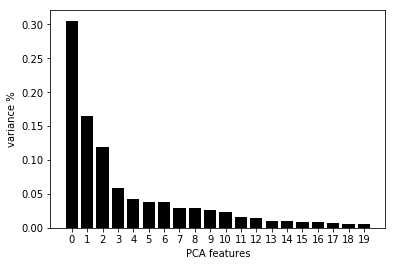

In [565]:
principalComponents_nav = pca_nav.transform(nav)


# Plot the explained variances
features = range(pca_nav.n_components_)
plt.bar(features, pca_nav.explained_variance_ratio_, color='black')
print(pca_nav.explained_variance_ratio_)
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
PCA_components_nav = pd.DataFrame(principalComponents_nav)




In [566]:
import pickle
import seaborn as sns
kmeansmodel_nav = pickle.load(open('kmeans_nav_new_month.sav', 'rb'))
#kmeansmodel_rad = pickle.load(open('kmeans_rad_new.sav', 'rb'))

In [567]:
# X_rad=PCA_components_rad.iloc[:,:6]
# kmeansmodel_rad = KMeans(n_clusters= 3, init='k-means++', random_state=0)
# y_kmeans_rad= kmeansmodel_rad.fit_predict(X_rad)
# X_rad['X_cluster']=y_kmeans_rad
# sns.pairplot(X_rad, hue='X_cluster', palette= 'Dark2', diag_kind='kde',size=1.85)

/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)
/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in 

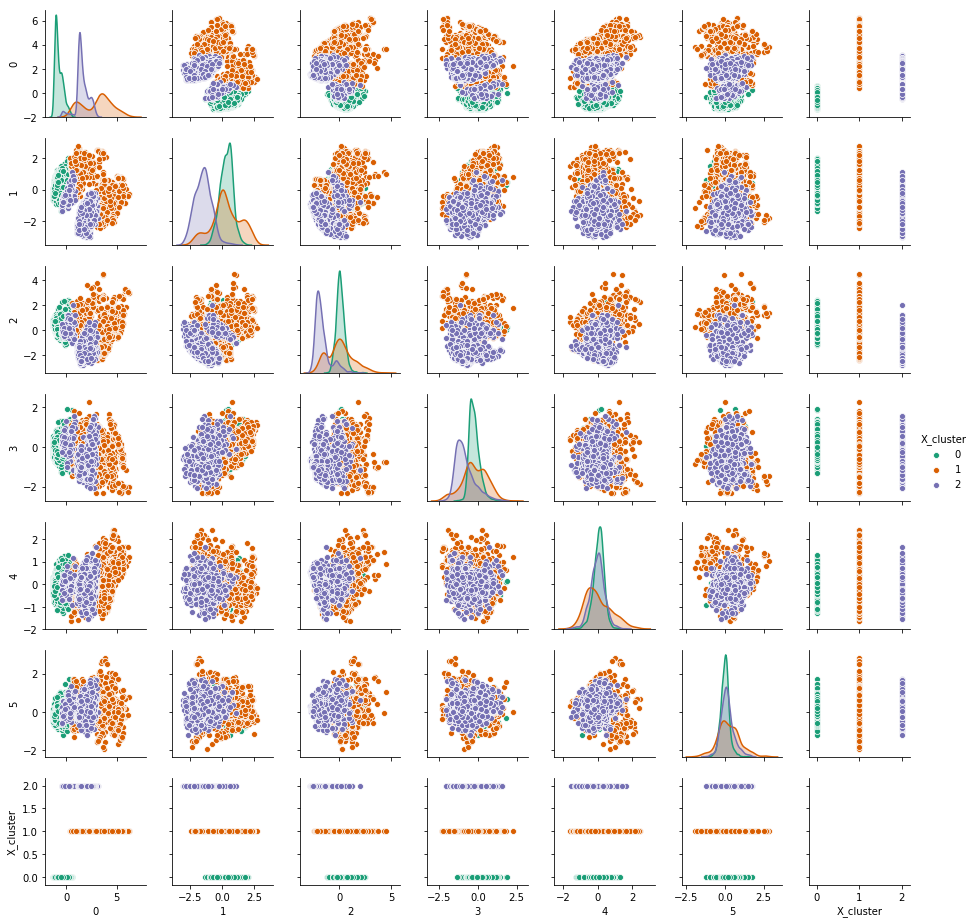

In [568]:
X_nav=PCA_components_nav.iloc[:,:6]
y_kmeans_nav= kmeansmodel_nav.predict(X_nav)
X_nav['X_cluster']=y_kmeans_nav
sns.pairplot(X_nav, hue='X_cluster', palette= 'Dark2', diag_kind='kde',size=1.85)

In [438]:
# X_rad=PCA_components_rad.iloc[:,:6]
# y_kmeans_rad= kmeansmodel_rad.fit_predict(X_rad)
# X_rad['X_cluster']=y_kmeans_rad
# sns.pairplot(X_rad, hue='X_cluster', palette= 'Dark2', diag_kind='kde',size=1.85)

In [439]:
# 1- success
# 2- failed
# 0- not often

In [274]:
X_nav['X_cluster'].value_counts()

0    3398
2    1157
1     868
Name: X_cluster, dtype: int64

In [569]:
data=pd.read_csv('random_result.csv')

In [570]:
data['cluster']=y_kmeans_nav

In [571]:
data['cluster']=data['cluster'].map({2:'success',1:'not often',0:'failed'})

In [105]:
data.groupby(['quarter','cluster']).size().rename('count').reset_index()

,quarter,cluster,count
0,0.0,failed,1
1,0.0,not often,1
2,1.0,failed,18
3,1.0,not often,1
4,1.0,success,7
5,2.0,failed,75
6,2.0,not often,8
7,2.0,success,15
8,3.0,failed,151
9,3.0,not often,31


In [572]:
start=final_df.groupby(['DSN']).apply(lambda x:x['Created At'].min()).dt.date.reset_index()

In [574]:
start.shape

(995, 2)

In [575]:
start.columns=['DSN', 'start']

In [576]:
data=pd.merge(data,start,on='DSN')

In [577]:
import datetime
data['date']=(data['quarter']*datetime.timedelta(days=21)+final_df['Created At'].min()).dt.date

In [578]:
final_df['Property Name'].unique()

array(['Entered Paused Mode', 'GET_Error_Code', 'Told to Clean',
       'Told to Pause', 'Contacted Charging Dock', 'Entered Dock Mode',
       'Lost Charging Contact', 'Entered Clean Mode', 'Told to Dock',
       'RunTimeCycle', 'RunTimeCumulative', 'GET_Cleaning_Statistics',
       'GET_PbFloor_Confidence', 'GET_MissionComplete'], dtype=object)

In [579]:
data['age']=(data['date']-data['start']).dt.days+21

In [580]:
data.groupby(['date']).size()

date
2019-09-08      2
2019-09-29     26
2019-10-20     98
2019-11-10    219
2019-12-01    490
2019-12-22    925
2020-01-12    949
2020-02-02    870
2020-02-23    830
2020-03-15    799
2020-04-05    215
dtype: int64

In [581]:
data['quarter'].value_counts()

6.0     949
5.0     925
7.0     870
8.0     830
9.0     799
4.0     490
3.0     219
10.0    215
2.0      98
1.0      26
0.0       2
Name: quarter, dtype: int64

In [408]:
data.groupby(['cluster','age']).size().rename('count').reset_index()

,cluster,age,count
0,failed,1,1
1,failed,2,5
2,failed,3,3
3,failed,4,1
4,failed,5,3
...,...,...,...
197,success,81,2
198,success,87,1
199,success,95,1
200,success,96,1


In [582]:
data['age_bin']=(data['age']/10).map(int)

In [583]:
data['age']=data['age_bin']*10

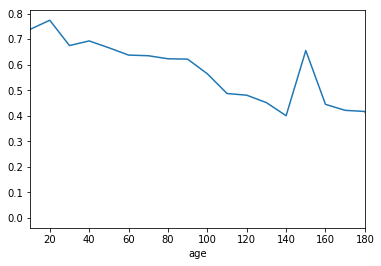

In [591]:
data.groupby(['age']).apply(lambda x:sum(x['cluster']=='failed')/len(x)).rename('failed rate').plot(xlim=[10,180])

In [588]:
data.groupby(['age']).size()

age
0      291
10     580
20     380
30     547
40     358
50     464
60     386
70     408
80     419
90     354
100    397
110    230
120    254
130    113
140    110
150     58
160     36
170     19
180     12
190      5
200      1
210      1
dtype: int64

pause_no


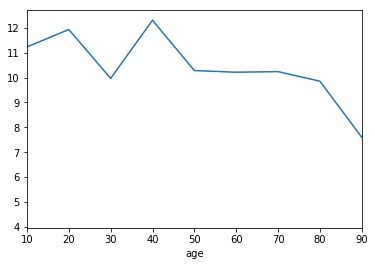

In [470]:
print('pause_no')
data.groupby(['age'])['pause_no'].mean().plot(xlim=[10,90])

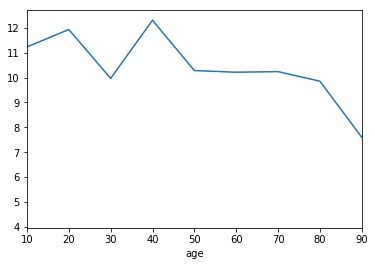

In [459]:
data.groupby(['age'])['pause_no'].mean().plot(xlim=[10,90])

In [595]:
data['totalrun_real']

0        202.0
1        316.0
2        246.0
3         44.0
4        163.0
         ...  
5418    2360.0
5419    2711.0
5420    2580.0
5421     218.0
5422    1489.0
Name: totalrun_real, Length: 5423, dtype: float64

In [596]:
data['weekend_per']

0       0.444444
1       0.625000
2       0.437500
3       0.666667
4       0.333333
          ...   
5418    0.217391
5419    0.516129
5420    0.280000
5421    1.000000
5422    0.090909
Name: weekend_per, Length: 5423, dtype: float64

In [594]:
data.shape

(5423, 61)

In [465]:
data.columns

Index(['DSN', 'quarter', 'meanruntime', 'stdruntime', '75%runtime',
       'maxruntime', 'meantime to dock', 'stdtime to dock', '75%time to dock',
       'maxtime to dock', 'meanpause time', 'stdpause time', '75%pause time',
       'maxpause time', 'delmap', 'map_confidence', 'dock_no', 'pause_no',
       'jobs', 'successrate', 'totalrun', 'totaldock', 'totalpause', 'rate_1',
       'rate_5', 'rate_15', 'Contacted Charging Dock', 'Entered Paused Mode',
       'meanpauseafterdock', 'stdpauseafterdock', '75%pauseafterdock',
       'maxpauseafterdock', 'meanpausebeforedock', 'stdpausebeforedock',
       '75%pausebeforedock', 'maxpausebeforedock', 'count_real', 'mean_real',
       'std_real', '75%_real', 'count_shortruns', 'mean_shortruns',
       'std_shortruns', '75%_shortruns', 'time_to_clear_error', 'sum_error',
       'totalrun_real', 'totalshortrun', 'weekday_per', 'weekend_per',
       'pause_per', 'dock_per', 'real_per', 'shortrun_per', 'short/real',
       'error_per', 'cluster', 

meanruntime


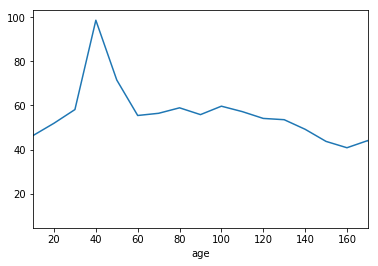

maxruntime


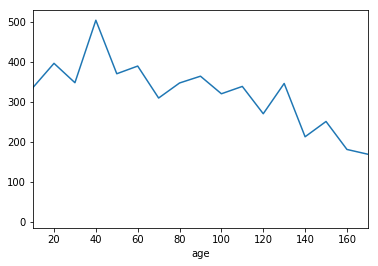

meantime to dock


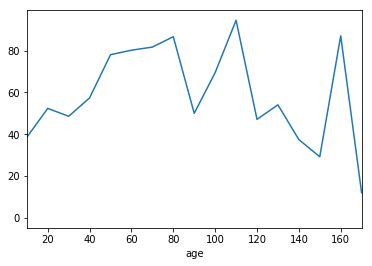

maxtime to dock


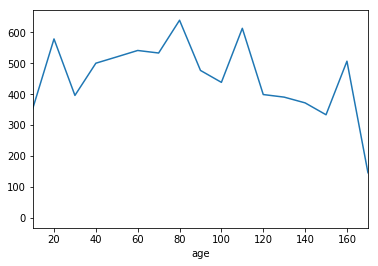

meanpause time


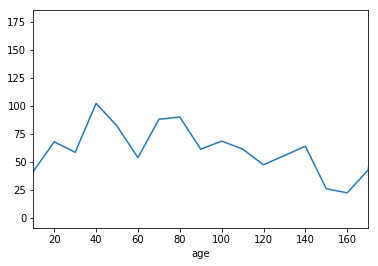

maxpause time


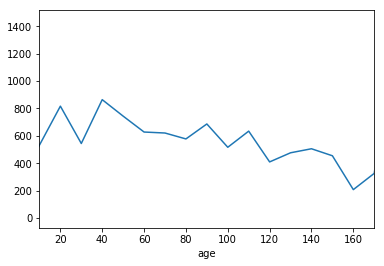

delmap


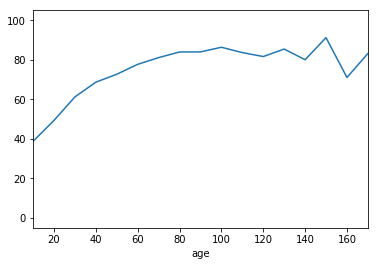

map_confidence


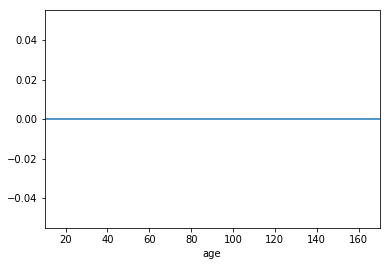

dock_no


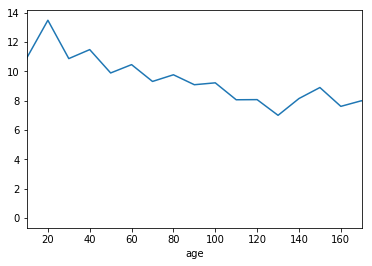

pause_no


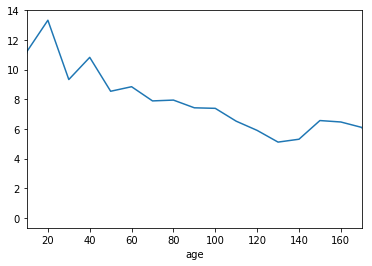

jobs


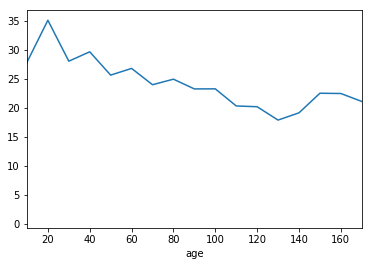

successrate


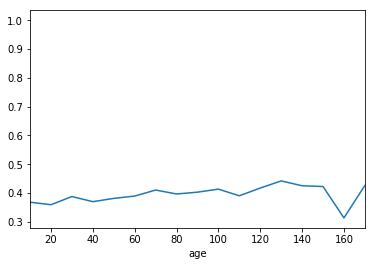

totalrun


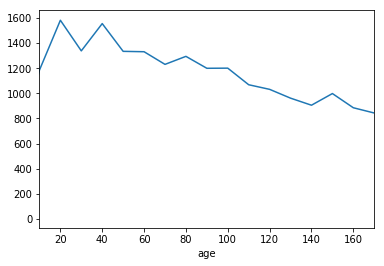

totaldock


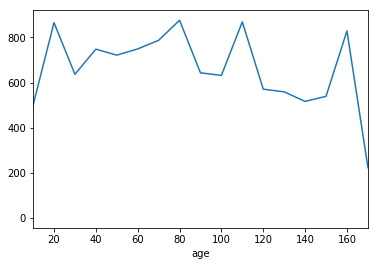

totalpause


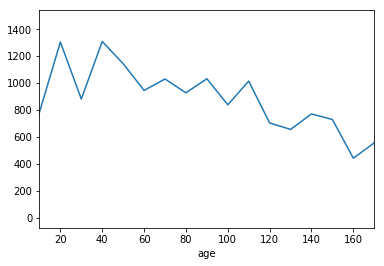

rate_1


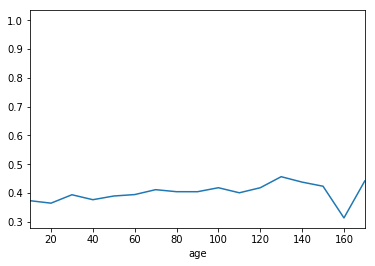

Contacted Charging Dock


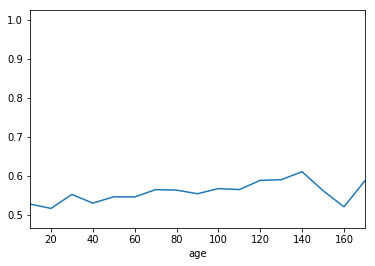

Entered Paused Mode


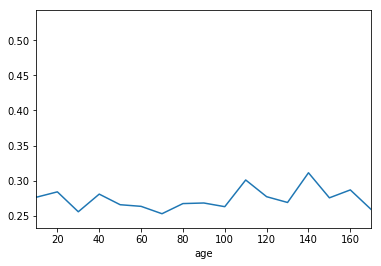

meanpauseafterdock


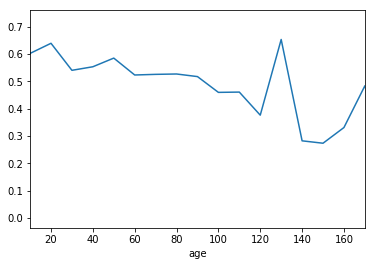

count_real


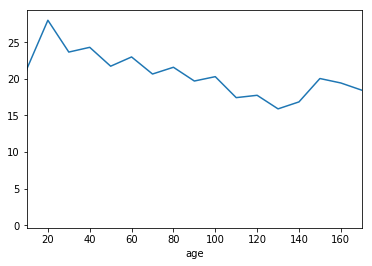

mean_real


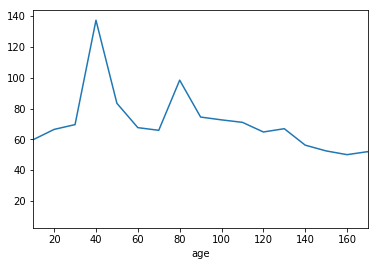

count_shortruns


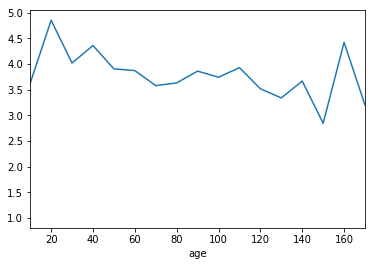

mean_shortruns


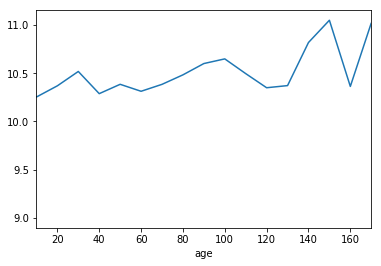

time_to_clear_error


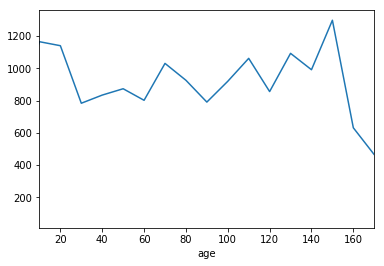

sum_error


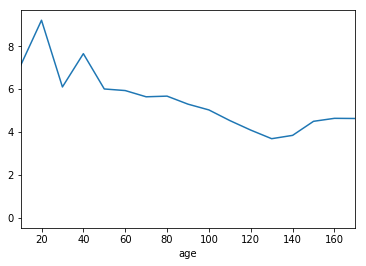

totalrun_real


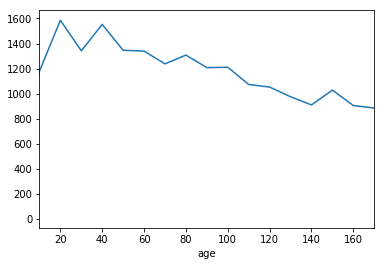

totalshortrun


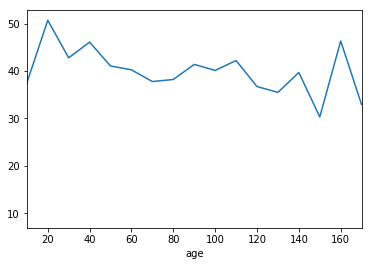

weekday_per


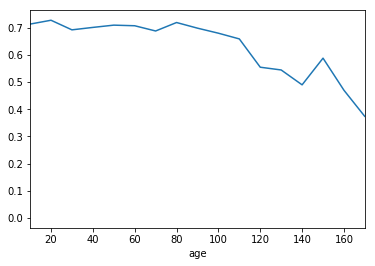

weekend_per


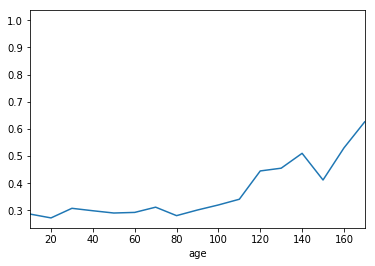

pause_per


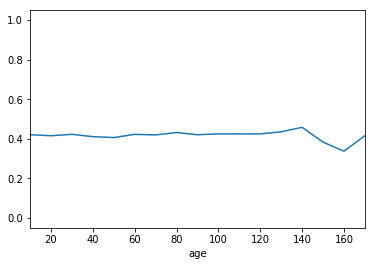

dock_per


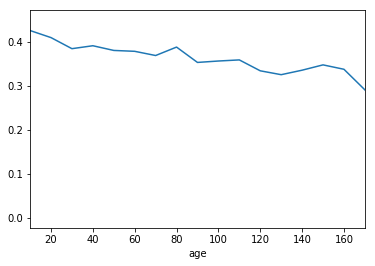

real_per


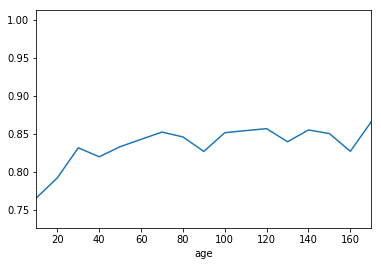

shortrun_per


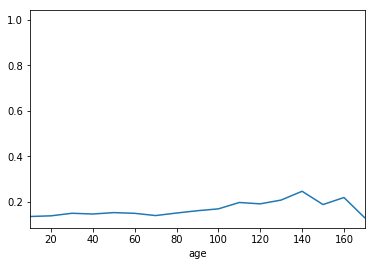

short/real


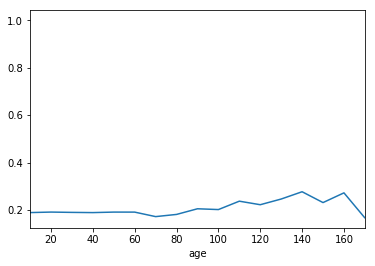

error_per


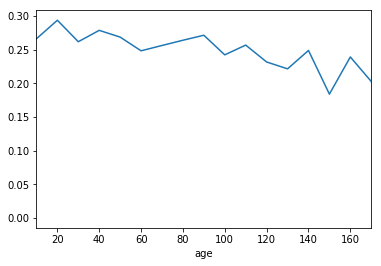

In [593]:
for i in ['meanruntime', 
       'maxruntime', 'meantime to dock', 
       'maxtime to dock', 'meanpause time', 
       'maxpause time', 'delmap', 'map_confidence', 'dock_no', 'pause_no',
       'jobs', 'successrate', 'totalrun', 'totaldock', 'totalpause', 'rate_1',
       'Contacted Charging Dock', 'Entered Paused Mode',
       'meanpauseafterdock', 
      
      'count_real', 'mean_real',
       'count_shortruns', 'mean_shortruns',
       'time_to_clear_error', 'sum_error',
       'totalrun_real', 'totalshortrun', 'weekday_per', 'weekend_per',
       'pause_per', 'dock_per', 'real_per', 'shortrun_per', 'short/real',
       'error_per']:
    print(i)
    data.groupby(['age'])[i].mean().plot(xlim=[10,170])
    plt.show()

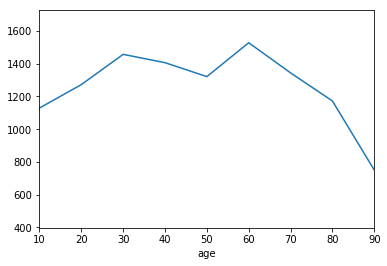

In [460]:
data.groupby(['age'])['totalrun_real'].mean().plot(xlim=[10,90])


In [438]:
data.groupby(['age_bin']).size()

age_bin
0      87
1     314
2     111
3     133
4     110
5      56
6      46
7      33
8      14
9      15
10      5
12      1
dtype: int64

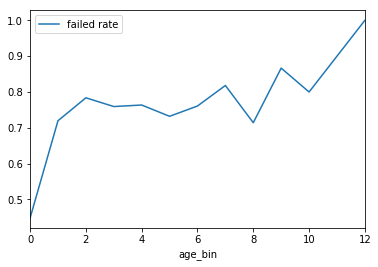

In [437]:
data.groupby(['age_bin']).apply(lambda x:sum(x['cluster']=='failed')/len(x)).rename('failed rate').reset_index().plot('age_bin','failed rate')

In [471]:
data.groupby(['date']).size()

date
2019-12-22    925
dtype: int64

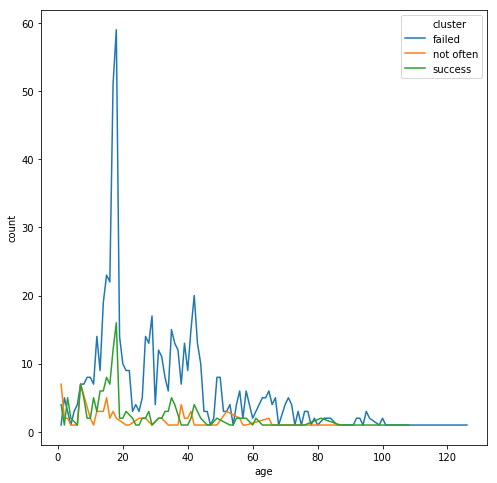

In [410]:
plt.figure(figsize=(8,8))


sns.lineplot(x="age", y="count", hue='cluster', data=data.groupby(['cluster','age']).size().rename('count').reset_index())

In [329]:
ds=list(data['date'].unique())

In [330]:
ds.remove(datetime.date(2019, 9, 8))

In [336]:
ds.remove(datetime.date(2019, 9, 29))

In [364]:

def version(d):
    mps=pd.DataFrame([])
    for dd in ds:
        ddd=dd+datetime.timedelta(days=21)
        try:
            v=d[(d['Property Name']=='GET_Nav_Module_App_Version')&(d['Created At']<ddd)]['Property Value'].iloc[-1]
        except:v=np.nan
        mps=mps.append(pd.DataFrame([dd,v]).T)
        return mps

In [365]:
import numpy as np

In [367]:
version=final_df.groupby(['DSN']).apply(version).reset_index()

/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Comparing Series of datetimes with 'datetime.date'.  Currently, the
'datetime.date' is coerced to a datetime. In the future pandas will
not coerce, and a TypeError will be raised. To retain the current
behavior, convert the 'datetime.date' to a datetime with
'pd.Timestamp'.
  


In [368]:
data=data[data['quarter']<10]

In [371]:
version.columns=['DSN', 'level_1', 'date', 'version']

In [373]:
data=pd.merge(data,version,on=['DSN','date'])

In [383]:
data.groupby(['version','cluster']).size().rename('count').unstack()

cluster,failed,not often,success
version,,,
V3.6.15-1307-Aug 25 2019,NaN,NaN,1.0
V3.6.15-1321-Aug 27 2019,15.0,6.0,4.0
V3.6.16-1352-Sep 03 2019,27.0,6.0,23.0
V3.6.17-m1469-Oct 11 2019,3.0,1.0,4.0
V3.6.18-m1490-Oct 26 2019,232.0,29.0,45.0
V3.6.18-m1495-Oct 31 2019,1.0,NaN,NaN
V3.6.20-m1576-Dec 05 2019,366.0,19.0,88.0
V3.6.21-m1636-Dec 28 2019,1.0,1.0,NaN


In [388]:
final_df[final_df['Property Value']=='V3.6.17-m1469-Oct 11 2019']['Created At'].min(),final_df[final_df['Property Value']=='V3.6.17-m1469-Oct 11 2019']['Created At'].max()

(Timestamp('2019-10-18 20:28:24'), Timestamp('2020-01-24 12:53:53'))

In [389]:
final_df[final_df['Property Value']=='V3.6.16-1352-Sep 03 2019']['Created At'].min(),final_df[final_df['Property Value']=='V3.6.16-1352-Sep 03 2019']['Created At'].max()

(Timestamp('2019-09-26 15:56:39'), Timestamp('2020-03-04 20:10:45'))

In [390]:
final_df[final_df['Property Value']=='V3.6.15-1321-Aug 27 2019']['Created At'].min(),final_df[final_df['Property Value']=='V3.6.15-1321-Aug 27 2019']['Created At'].max()

(Timestamp('2019-09-08 01:34:27'), Timestamp('2020-03-22 15:51:40'))

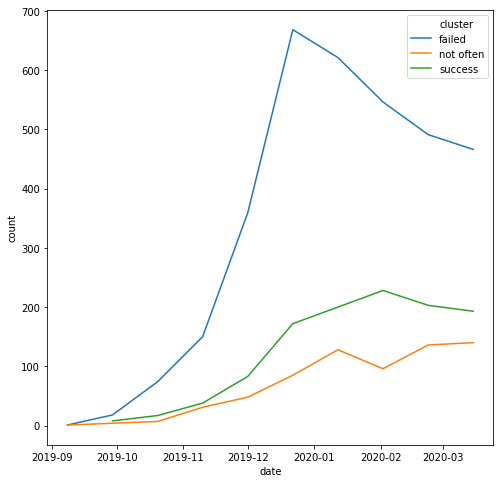

In [281]:
plt.figure(figsize=(8,8))


sns.lineplot(x="date", y="count", hue='cluster', data=data.groupby(['date','cluster']).size().rename('count').reset_index())

In [391]:
data.groupby(['date','cluster']).size().rename('count')

date        cluster  
2019-12-22  failed       668
            not often     85
            success      172
Name: count, dtype: int64

In [125]:
data.columns

Index(['DSN', 'quarter', 'meanruntime', 'stdruntime', '75%runtime',
       'maxruntime', 'meantime to dock', 'stdtime to dock', '75%time to dock',
       'maxtime to dock', 'meanpause time', 'stdpause time', '75%pause time',
       'maxpause time', 'delmap', 'map_confidence', 'dock_no', 'pause_no',
       'jobs', 'successrate', 'totalrun', 'totaldock', 'totalpause', 'rate_1',
       'rate_5', 'rate_15', 'Contacted Charging Dock', 'Entered Paused Mode',
       'meanpauseafterdock', 'stdpauseafterdock', '75%pauseafterdock',
       'maxpauseafterdock', 'meanpausebeforedock', 'stdpausebeforedock',
       '75%pausebeforedock', 'maxpausebeforedock', 'count_real', 'mean_real',
       'std_real', '75%_real', 'count_shortruns', 'mean_shortruns',
       'std_shortruns', '75%_shortruns', 'time_to_clear_error', 'sum_error',
       'totalrun_real', 'totalshortrun', 'weekday_per', 'weekend_per',
       'pause_per', 'dock_per', 'real_per', 'shortrun_per', 'short/real',
       'error_per', 'cluster', 

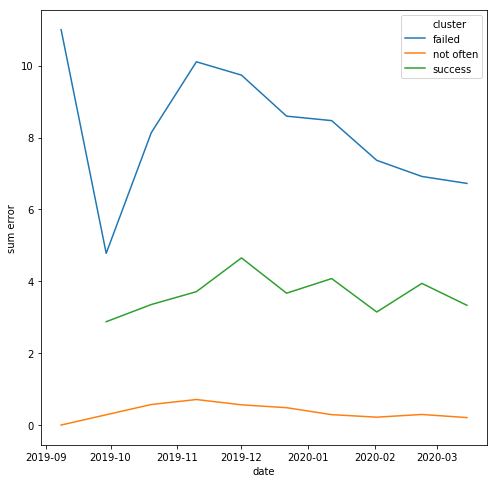

In [288]:
plt.figure(figsize=(8,8))


sns.lineplot(x="date", y='sum error', hue='cluster', data=data.groupby(['date','cluster'])['sum_error'].mean().rename('sum error').reset_index())

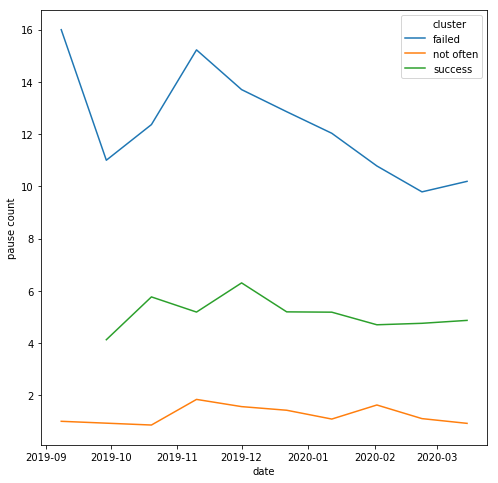

In [289]:
plt.figure(figsize=(8,8))


sns.lineplot(x="date", y='pause count', hue='cluster', data=data.groupby(['date','cluster'])['pause_no'].mean().rename('pause count').reset_index())

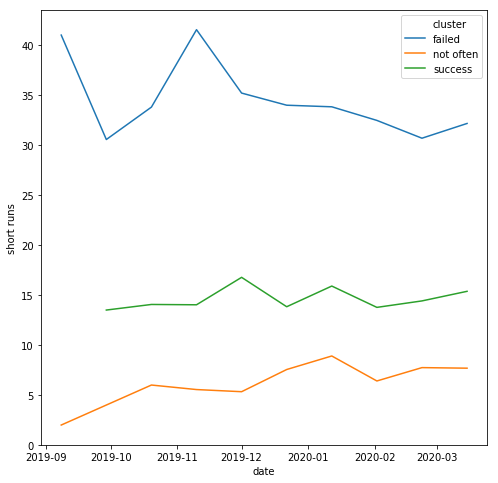

In [308]:
plt.figure(figsize=(8,8))


sns.lineplot(x="date", y='short runs', hue='cluster', data=data.groupby(['date','cluster'])['jobs'].mean().rename('short runs').reset_index())

In [442]:
#X_nav['X_cluster'].value_counts()

0    21
2     6
1     1
Name: X_cluster, dtype: int64

In [443]:
data.shape

(28, 57)

In [359]:
data['cluster_end']=y_kmeans_nav

In [360]:
end=data[['DSN','cluster_end']]

In [444]:
start=data[['DSN','cluster_start']]

In [445]:
internal=pd.merge(start,end,on='DSN',how='left')

In [804]:
X_nav['X_cluster'].value_counts()/len(X_nav)

1    0.661972
2    0.246479
0    0.091549
Name: X_cluster, dtype: float64

In [427]:
X_nav['X_cluster'].value_counts()/len(X_nav)

2    0.894366
0    0.105634
Name: X_cluster, dtype: float64

In [460]:
internal['cluster_end'].value_counts()

failed       12
success       7
not often     5
Name: cluster_end, dtype: int64

In [99]:
result_nav=data.reset_index(drop=True).join(X_nav['X_cluster'])

In [310]:
data['cluster']=y_kmeans_nav

In [312]:
pd.merge(returned,data,on='DSN').to_csv('returned_cluster.csv',index=False)

In [1104]:
#result_rad=data.reset_index(drop=True).join(X_rad['X_cluster'])

In [1106]:
# result_rad[['DSN',  'countruntime', 'stdruntime',
#        '50%runtime', 'maxruntime', 
#        'stdtime to dock', '50%time to dock', 
#        'maxtime to dock', 'countpause time', 'meanpause time', 'stdpause time',
#        '50%pause time', '75%pause time', 'maxpause time', 'jobs',
#        'successrate', 'time_to_clear_error', 'sum_error', 
#        'std_real', '50%_real', 'max_real', 'totalrun_per',
#       'totalpause_per', 'totalrun_real_per',  'weekday_per',
#         'X_cluster']].groupby(['X_cluster']).mean().T

In [1123]:
result_nav.to_csv('cluster_Bugs4Bountygroup.csv',index=False)

In [1128]:
result_nav[['DSN','X_cluster']].to_csv('cluster_bugs4.csv',index=False)

In [100]:
result_nav

,DSN,sum,count,chargefreq,dischargefreq,max_chargerate,min_chargerate,meanrate,medianrate,q01rate,...,max_real,totalrun_per,totaldock_per,totalpause_per,totalrun_real_per,weekday_per,weekend_per,pause_per,dock_per,X_cluster
0,AC000W007127559,0.5,0.0,1.000000,0.993307,0.510079,0.493812,0.500950,0.501464,0.496063,...,0.5,0.000099,0.000000,0.000101,0.000000,0.000000,1.000000,0.999500,0.000000,1
1,AC000W007127570,0.5,0.0,1.000000,1.000000,0.509841,0.482277,0.499527,0.500267,0.495807,...,1.0,0.015675,0.000078,0.000613,0.015675,0.833333,0.166667,0.999833,0.666556,2
2,AC000W007127666,0.5,0.0,1.000000,1.000000,0.510161,0.494318,0.499405,0.500134,0.495300,...,1.0,0.026984,0.000989,0.001149,0.026687,0.500000,0.500000,0.999833,0.499917,2
3,AC000W007127672,0.5,0.0,1.000000,0.999994,0.577491,0.461561,0.502800,0.500983,0.495748,...,1.0,0.003373,0.000103,0.000655,0.003274,0.000000,1.000000,0.999500,0.999500,2
4,AC000W007127683,0.5,0.0,1.000000,1.000000,0.540234,0.494681,0.502688,0.500101,0.495403,...,1.0,0.029861,0.001935,0.000117,0.029861,0.800000,0.200000,0.999900,0.999900,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,AC000W007206993,0.5,0.0,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,...,1.0,0.216369,0.000000,0.072488,0.216369,1.000000,0.000000,0.999500,0.000000,2
66,AC000W007206996,0.5,0.0,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,...,0.5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
67,AC000W007207000,0.5,0.0,1.000000,1.000000,0.508445,0.495265,0.499580,0.500974,0.495947,...,1.0,0.038095,0.001453,0.000107,0.038095,0.750000,0.250000,0.999750,0.999750,0
68,AC000W007207004,0.5,0.0,0.999089,0.999983,0.559241,0.469551,0.498786,0.500000,0.480890,...,1.0,0.002480,0.000146,0.000008,0.002480,1.000000,0.000000,0.999500,0.499750,0


In [102]:
result_nav[result_nav['DSN']=='AC000W007205084']

,DSN,sum,count,chargefreq,dischargefreq,max_chargerate,min_chargerate,meanrate,medianrate,q01rate,...,max_real,totalrun_per,totaldock_per,totalpause_per,totalrun_real_per,weekday_per,weekend_per,pause_per,dock_per,X_cluster
40,AC000W007205084,0.5,0.0,1.0,1.0,0.503406,0.496459,0.499737,0.500144,0.496754,...,1.0,0.018849,0.00044,0.00004,0.018849,0.5,0.5,0.9995,0.9995,0


In [1120]:
result_nav[['DSN',  'countruntime', 'stdruntime',
       '50%runtime', 'maxruntime', 
       'stdtime to dock', '50%time to dock', 
       'maxtime to dock', 'countpause time', 'meanpause time', 'stdpause time',
       '50%pause time', '75%pause time', 'maxpause time', 'jobs',
       'successrate', 'time_to_clear_error', 'sum_error', 
       'std_real', '50%_real', 'max_real', 'totalrun_per',
      'totalpause_per', 'totalrun_real_per',  'weekday_per',
        'X_cluster']].groupby(['X_cluster']).mean().T

X_cluster,0,1,2
countruntime,19.629630,1.108108,9.333333
stdruntime,0.999999,0.588738,0.999952
50%runtime,0.913614,0.605927,0.906681
maxruntime,1.000000,0.619313,1.000000
stdtime to dock,0.888788,0.512773,0.838051
50%time to dock,0.763188,0.540580,0.768147
maxtime to dock,0.908176,0.555545,0.954794
countpause time,19.629630,1.108108,9.333333
meanpause time,0.911217,0.542496,0.528295
stdpause time,0.968465,0.508086,0.560356


In [ ]:
RV1000/RV1000A
have trouble
do not run often
run often, no trouble
cluster
0
1
2
countruntime
8.406331
1.561637
6.429014
stdruntime
193.215259
43.66468
120.422262
maxruntime
512.172528
240.454093
300.212791
stdtime to dock
200.043188
3.190754
152.458091
maxtime to dock
335.161001
69.775231
252.994769
countpause time
8.406331
1.561637
6.429014
meanpause time
96.722708
95.235215
0.081199
stdpause time
189.158652
10.277479
0.172216
75%pause time
87.473377
98.611104
0.058339
maxpause time
461.718245
103.542103
0.449141
jobs
8.406331
1.561637
6.429014
successrate
0.472466
0.608074
0.537667
time_to_clear_error
314.674196
71.227924
59.136593
sum_error
2.115399
0.361075
0.363279
std_real
203.973837
17.816967
125.563546
50%_real
101.516543
231.043579
68.571048
max_real
512.457547
246.880819
300.508847
totalrun_per
0.080135
0.024706
0.044793
totalpause_per
0.054996
0.010289
0.000053
totalrun_real_per
0.07999
0.025137
0.044723
weekday_per
0.846569
0.50699
0.871159


In [ ]:
import pandas as pd
import numpy as np


data=pd.read_csv('customer_final.csv')

In [ ]:
signal=pd.read_csv('signal.csv')

In [ ]:
signal.columns=['OEM Model', 'DSN', 'count_sig', 'mean_sig', 'std_sig', 'min_sig', '25%_sig', '50%_sig', '75%_sig',
       'max_sig']

In [ ]:
data=pd.merge(data,signal,on=['OEM Model','DSN'])

In [ ]:
missions=pd.read_csv('missions_real.csv')

In [ ]:
data=pd.merge(data,missions,on=['OEM Model','DSN'])

In [ ]:
data['totalrun']=data['countruntime']*data['meanruntime']
data['totaldock']=data['counttime to dock']*data['meantime to dock']
data['totalpause']=data['countpause time']*data['meanpause time']
data['totalrun_real']=data['count_real']*data['mean_real']


data=data.drop(['sum','totalruntime'],axis=1)

data['totalrun_per']=data['countruntime']*data['meanruntime']/10080
data['totaldock_per']=data['counttime to dock']*data['meantime to dock']/10080
data['totalpause_per']=data['countpause time']*data['meanpause time']/10080
data['totalrun_real_per']=data['count_real']*data['mean_real']/10080


# data['totalruns']=data[['latenight', 'morning',
#        'afternoon', 'evening']].sum(axis=1)

data['latenight_per']=data['latenight']/data['jobs']
data['morning_per']=data['morning']/data['jobs']
data['afternoon_per']=data['afternoon']/data['jobs']
data['evening_per']=data['evening']/data['jobs']

data['weekday_per']=data['weekday']/data['jobs']
data['weekend_per']=data['weekend']/data['jobs']

In [ ]:
data['pause_per']=data['countpause time']/(data['jobs']+0.001)
data['dock_per']=data['counttime to dock']/(data['jobs']+0.001)

In [ ]:
data=data[data['jobs']==data[['latenight', 'morning','afternoon', 'evening']].sum(axis=1)]

In [ ]:
data=data.drop(['Mon','Tue','Wed','Thu','Fri','Sat','Sun'],axis=1)

In [ ]:
data=data[['OEM Model', 'DSN', 'runfreq', 'chargefreq', 'dischargefreq',
       'max_chargerate', 'min_chargerate', 'meanrate', 'medianrate', 'q01rate',
       'q09rate', 'min_chargelevel', 'map_confidence', 'delmap',
       'charge_cycle', 'countruntime', 'meanruntime', 'stdruntime',
       '50%runtime', '75%runtime', 'maxruntime', 'meantime to dock',
       'stdtime to dock', '50%time to dock', '75%time to dock',
       'maxtime to dock', 'countpause time', 'meanpause time', 'stdpause time',
       '50%pause time', '75%pause time', 'maxpause time', 'jobs',
       'successrate', 'time_to_clear_error', 'sum_error', 'count_sig',
       'mean_sig', 'std_sig', 'min_sig', '50%_sig', '75%_sig', 'mean_real',
       'std_real', '50%_real', '75%_real', 'max_real', 'totalrun_per',
       'totaldock_per', 'totalpause_per', 'totalrun_real_per', 'latenight_per',
       'morning_per', 'afternoon_per', 'evening_per', 'weekday_per',
       'weekend_per', 'pause_per', 'dock_per']].fillna(0)

In [ ]:
def sigmoid(x):
    e = np.exp(1)
    y = 1/(1+e**(-x))
    return y
data[[ 'chargefreq', 'dischargefreq',
       'max_chargerate', 'min_chargerate', 'meanrate', 'medianrate', 'q01rate',
       'q09rate', 
       'charge_cycle','meanruntime', 'stdruntime',
       '50%runtime', '75%runtime', 'maxruntime', 'meantime to dock',
       'stdtime to dock', '50%time to dock', '75%time to dock',
       'maxtime to dock',  'meanpause time', 'stdpause time',
       '50%pause time', '75%pause time', 'maxpause time',
        'sum_error', 'count_sig',
       'std_sig', 'mean_real',
       'std_real', '50%_real', '75%_real', 'max_real','time_to_clear_error']] = sigmoid(data[[ 'chargefreq', 'dischargefreq',
       'max_chargerate', 'min_chargerate', 'meanrate', 'medianrate', 'q01rate',
       'q09rate', 
       'charge_cycle','meanruntime', 'stdruntime',
       '50%runtime', '75%runtime', 'maxruntime', 'meantime to dock',
       'stdtime to dock', '50%time to dock', '75%time to dock',
       'maxtime to dock',  'meanpause time', 'stdpause time',
       '50%pause time', '75%pause time', 'maxpause time',
        'sum_error', 'count_sig',
       'std_sig', 'mean_real',
       'std_real', '50%_real', '75%_real', 'max_real','time_to_clear_error']])



In [ ]:
num_cols=data.select_dtypes(include=np.number).columns
cat_cols=data.select_dtypes(include='object').columns

In [ ]:
navigate=data[data['OEM Model'].isin(['RV1000', 'RV1000A'])]
random=data[data['OEM Model'].isin(['RV1000', 'RV1000A'])==False]

In [37]:
from sklearn.preprocessing import StandardScaler  # For scaling dataset
from sklearn.cluster import KMeans, AgglomerativeClustering, AffinityPropagation #For clustering
from sklearn.mixture import GaussianMixture #For GMM clustering

import os                     # For os related operations
import sys                    # For data size

In [ ]:
cor = random.drop(['OEM Model','DSN','map_confidence', 'delmap'],axis=1).corr()
plt.figure(figsize=(16,16))#Calculate the correlation of the above variables
sns.heatmap(cor, square = True)

In [38]:
#Scaling of data
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.preprocessing import MaxAbsScaler

from sklearn.cluster import KMeans

In [ ]:
nav=navigate.drop(['OEM Model','DSN'],axis=1)
ss = MinMaxScaler()
nav=ss.fit_transform(nav.fillna(0))
wcss=[]

for i in range(1,10):
        kmeans = KMeans(n_clusters= i, init='k-means++', random_state=0)
        kmeans.fit(nav)
        wcss.append(kmeans.inertia_)
    #Visualizing the ELBOW method to get the optimal value of K 
plt.plot(range(1,10), wcss)
plt.title('The Elbow Method')
plt.xlabel('no of clusters')
plt.ylabel('wcss')
plt.show()

In [ ]:
#df=data[data['OEM Model']==i]
rad=random.drop(['OEM Model','DSN','map_confidence', 'delmap'],axis=1)
ss = MinMaxScaler()
rad=ss.fit_transform(rad.fillna(0))
wcss=[]

for i in range(1,10):
        kmeans = KMeans(n_clusters= i, init='k-means++', random_state=0)
        kmeans.fit(rad)
        wcss.append(kmeans.inertia_)
    #Visualizing the ELBOW method to get the optimal value of K 
plt.plot(range(1,10), wcss)
plt.title('The Elbow Method')
plt.xlabel('no of clusters')
plt.ylabel('wcss')
plt.show()

In [ ]:
from sklearn.decomposition import PCA
rad=random.drop(['OEM Model','DSN','map_confidence', 'delmap'],axis=1)
ss = MinMaxScaler()
rad=ss.fit_transform(rad.fillna(0))
pca_rad = PCA(n_components=20)
principalComponents_rad = pca_rad.fit_transform(rad)
# Plot the explained variances
features = range(pca_rad.n_components_)
plt.bar(features, pca_rad.explained_variance_ratio_, color='black')
print(pca_rad.explained_variance_ratio_)
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
# Save components to a DataFrame
PCA_components_rad = pd.DataFrame(principalComponents_rad)




In [ ]:
pca_nav = PCA(n_components=20)
principalComponents_nav = pca_nav.fit_transform(nav)
# Plot the explained variances
features = range(pca_nav.n_components_)
plt.bar(features, pca_nav.explained_variance_ratio_, color='black')
print(pca_nav.explained_variance_ratio_)
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
PCA_components_nav = pd.DataFrame(principalComponents_nav)




In [ ]:
X_rad=PCA_components_rad.iloc[:,:6]
kmeansmodel_rad = KMeans(n_clusters= 3, init='k-means++', random_state=0)
y_kmeans_rad= kmeansmodel_rad.fit_predict(X_rad)
X_rad['X_cluster']=y_kmeans_rad
sns.pairplot(X_rad, hue='X_cluster', palette= 'Dark2', diag_kind='kde',size=1.85)

In [ ]:
X_nav=PCA_components_nav.iloc[:,:6]
kmeansmodel_nav = KMeans(n_clusters= 3, init='k-means++', random_state=0)
y_kmeans_nav= kmeansmodel_nav.fit_predict(X_nav)
X_nav['X_cluster']=y_kmeans_nav
sns.pairplot(X_nav, hue='X_cluster', palette= 'Dark2', diag_kind='kde',size=1.85)

In [39]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
train_nav, test_nav, y_train_nav, y_test_nav = train_test_split(
    navigate,y_kmeans_nav , test_size=0.20, random_state=None)

# Vectorizer / regressor pipeline that filters out tokens that are too rare or too frequent

train_rad, test_rad, y_train_rad, y_test_rad = train_test_split(
    random,y_kmeans_rad , test_size=0.20, random_state=None)

NameError: name 'navigate' is not defined

In [ ]:
import shap
import xgboost
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

In [36]:
model_1 = XGBClassifier(max_depth= 3, eta= 1, learning_rate= 0.01,n_estimators=200)

model_1.fit(train_nav.drop(['OEM Model','DSN'],axis=1),y_train_nav)

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer_1 = shap.TreeExplainer(model_1)
shap_values_1 = explainer.shap_values(train_nav.drop(['OEM Model','DSN'],axis=1))

predict_test = model_1.predict(test_nav.drop(['OEM Model','DSN'],axis=1))
predict_train = model_1.predict(train_nav.drop(['OEM Model','DSN'],axis=1))

print(accuracy_score(y_train_nav,predict_train))
print(accuracy_score(y_test_nav,predict_test))

NameError: name 'XGBClassifier' is not defined

In [ ]:
shap.summary_plot(shap_values_1, train_nav.drop(['OEM Model','DSN'],axis=1))

In [ ]:
shap.summary_plot(shap_values_1[0], train_nav.drop(['OEM Model','DSN'],axis=1))

In [ ]:
shap.summary_plot(shap_values_1[1], train_nav.drop(['OEM Model','DSN'],axis=1))

In [ ]:
shap.summary_plot(shap_values_1[2], train_nav.drop(['OEM Model','DSN'],axis=1))

In [ ]:
model = XGBClassifier(max_depth= 3, eta= 1, learning_rate= 0.01,n_estimators=200)

model.fit(train_rad.drop(['OEM Model','DSN'],axis=1),y_train_rad)

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_rad.drop(['OEM Model','DSN'],axis=1))

predict_test = model.predict(test_rad.drop(['OEM Model','DSN'],axis=1))
predict_train = model.predict(train_rad.drop(['OEM Model','DSN'],axis=1))

print(accuracy_score(y_train_rad,predict_train))
print(accuracy_score(y_test_rad,predict_test))

In [ ]:
shap.summary_plot(shap_values, train_rad.drop(['OEM Model','DSN'],axis=1))

In [ ]:
shap.summary_plot(shap_values[0], train_rad.drop(['OEM Model','DSN'],axis=1))

In [ ]:
shap.summary_plot(shap_values[1], train_rad.drop(['OEM Model','DSN'],axis=1))

In [ ]:
shap.summary_plot(shap_values[2], train_rad.drop(['OEM Model','DSN'],axis=1))

In [1132]:
list(result_nav[result_nav['X_cluster']==2]['DSN'])

['AC000W007127683',
 'AC000W007127745',
 'AC000W007127772',
 'AC000W007205084',
 'AC000W007207000',
 'AC000W007207004']

In [1137]:
a=final_df[(final_df['DSN'].isin(list(result_nav[result_nav['X_cluster']==2]['DSN'])))&(final_df['Property Name']!='GET_RSSI')]


In [1138]:
a.to_csv('success.csv',index=False)

In [124]:
a=pd.read_csv('sample.csv')

In [ ]:
def fun(row):
    timestamp=row.iloc[0]
    x=row.iloc[1]
    y=row.iloc[2]
    ...
    return [timestamp,x,y...]

In [133]:
data.loc[data['column']=='timestamp','row number']=range(sum(data['column']=='timestamp'))
data['row number']=data['row number'].fillna(method='ffill')
data.groupby(['row number']).apply(fun)

   OEM Model              DSN            Property Name  \
0      RV750  AC000W003327504       Entered Clean Mode   
1      RV750  AC000W003327504    Lost Charging Contact   
2      RV750  AC000W003327504      Entered Paused Mode   
3      RV750  AC000W003327504           GET_Error_Code   
4      RV750  AC000W003327504             RunTimeCycle   
5      RV750  AC000W003327504        RunTimeCumulative   
6      RV750  AC000W003327504           GET_Error_Code   
7      RV750  AC000W003327504       Entered Clean Mode   
8      RV750  AC000W003327504      Entered Paused Mode   
9      RV750  AC000W003327504             RunTimeCycle   
10     RV750  AC000W003327504        RunTimeCumulative   
11     RV750  AC000W003327504           GET_Error_Code   
12     RV750  AC000W003327504       Entered Clean Mode   
13     RV750  AC000W003327504           GET_Error_Code   
14     RV750  AC000W003327504        Entered Dock Mode   
15     RV750  AC000W003327504             RunTimeCycle   
16     RV750  

In [316]:
pd.read_csv('nav_month_part.csv').columns

Index(['sum', 'count', 'No Battery/Fuse Error', 'totalruntime', 'runfreq',
       'chargefreq', 'dischargefreq', 'max_chargerate', 'min_chargerate',
       'meanrate', 'medianrate', 'q01rate', 'q09rate', 'min_chargelevel',
       'map_confidence', 'delmap', 'charge_cycle', 'recharge', 'evacuate',
       'Drop Error', 'Error = 0', 'Drop Error time to clear',
       'Drop Error#clear', 'Cliff Sensor Error',
       'Cliff Sensor Error time to clear', 'Cliff Sensor Error#clear',
       'Bumper Error', 'Mag Strip Error', 'No Dustbox Error',
       'Mag Strip Error time to clear', 'Mag Strip Error#clear',
       'Bumper Error time to clear', 'Bumper Error#clear', 'Front Wheel Error',
       'Wheels Error', 'Front Wheel Error time to clear',
       'No Battery/Fuse Error time to clear', 'Wheels Error time to clear',
       'Front Wheel Error#clear', 'No Battery/Fuse Error#clear',
       'Wheels Error#clear', 'Wheel Encoder Error',
       'No Dustbox Error time to clear', 'Wheel Encoder Error 

In [31]:
a=final_df[final_df['DSN'].isin(['AC000W008128921', 'AC000W008129582', 'AC000W008136541', 'AC000W008137212', 'AC000W008140665', 'AC000W008141580', 'AC000W008186082', 'AC000W008190301', 'AC000W008191923', 'AC000W008216434', 'AC000W008235242', 'AC000W008241414', 'AC000W008244446', 'AC000W008250040', 'AC000W008285000', 'AC000W008310869', 'AC000W008311693', 'AC000W008341279', 'AC000W008341628', 'AC000W008342339', 'AC000W008342634', 'AC000W008343379', 'AC000W008356715', 'AC000W008361606', 'AC000W008364359', 'AC000W008369879', 'AC000W008602177', 'AC000W008708162', 'AC000W008709081', 'AC000W008779874', 'AC000W008791727', 'AC000W008797817', 'AC000W008797820', 'AC000W008799146', 'AC000W008824713'])]

In [32]:
pd.merge(a,returned,on='DSN',how='left').to_csv('sample.csv',index=False)

In [73]:
pd.merge(returned,pd.read_csv('returned_rv1000.csv'),on='DSN').drop_duplicates('DSN').to_csv('returned_rvs.csv',index=False)

In [71]:
94+35+13

142

In [446]:
import openpyxl
wb = openpyxl.load_workbook('./Downloads/Robot Data Pull 3.12.xlsx')

In [447]:
wb.sheetnames

['Mesa MP 1',
 'Valley MP 1',
 'Valley MP 1 Star',
 'Mesa 2 MP',
 'Mesa 2 MP Star',
 'Valley MP 2 Star',
 'Beta Testers - MesaValley',
 'Comet MP',
 'Comet Mp Star',
 'Robo Wet dry',
 'Ecovacs wet dry',
 'Wet Dry Robot Buy Live Oct 2019',
 'Poseidon VISA',
 'Ki100 - external',
 'KI100 Star']

In [371]:
pd.read_excel('./Downloads/Robot Data Pull 3.12.xlsx',sheet_name='Mesa MP 1').append(pd.read_excel('./Downloads/Robot Data Pull 3.12.xlsx',sheet_name='Mesa 2 MP'))

/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


,Approximately how big is your current residence?,Approximately how much of your floors are carpeting (wall to wall or area rugs)?,Are you currently looking to purchase any of the following? Select all that apply. - Blender,Are you currently looking to purchase any of the following? Select all that apply. - Coffee Maker,Are you currently looking to purchase any of the following? Select all that apply. - Microwave,Are you currently looking to purchase any of the following? Select all that apply. - None of the above,Are you currently looking to purchase any of the following? Select all that apply. - Slow Cooker,Are you currently looking to purchase any of the following? Select all that apply. - Television,Are you currently looking to purchase any of the following? Select all that apply. - Vacuum,Are you currently looking to purchase any of the following? Select all that apply. - Washer and or Dryer,...,Which of the following best describes your children's age range? - College age or older,Which of the following best describes your children's age range? - Elementary school age,Which of the following best describes your children's age range? - High school age,Which of the following best describes your children's age range? - Middle school age,Which of the following best describes your children's age range? - Newborn,Which of the following best describes your children's age range? - Pre-school age,Which of the following best describes your loving arrangement status?,Which option below best describes how often you vacuum using your primary household product?,Who in your household is the primary decision maker for purchasing a new vacuum?,Who in your household is the primary vacuum user?
0,500 - 999 sq. ft,Greater than 75%,N,N,N,N,N,N,Y,N,...,NaN,NaN,NaN,NaN,NaN,NaN,Single,5 times per week or more,I am the primary decision maker for purchasing,I am the primary vacuum user
1,"2, 000 sq. ft or more",25%-50%,Y,Y,Y,N,Y,Y,Y,Y,...,N,Y,N,N,N,N,Living with spouse or significant other,5 times per week or more,I am the primary decision maker for purchasing,I am the primary vacuum user
2,"2, 000 sq. ft or more",25%-50%,N,N,N,N,N,N,Y,Y,...,N,Y,N,N,N,N,Living with spouse or significant other,5 times per week or more,I am the primary decision maker for purchasing,I am the primary vacuum user
3,"2, 000 sq. ft or more",51%-75%,N,N,Y,N,N,Y,Y,N,...,N,Y,N,N,N,Y,Living with spouse or significant other,5 times per week or more,I am the primary decision maker for purchasing,I am the primary vacuum user
4,"1, 000 - 1, 499 sq. ft",51%-75%,N,N,Y,N,Y,N,Y,N,...,N,N,N,N,Y,Y,Living with spouse or significant other,1-2 times per week,I am the primary decision maker for purchasing,I am the primary vacuum user
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41,"2, 000 sq. ft or more",25%-50%,N,N,N,N,N,N,Y,N,...,N,N,N,N,N,Y,Living with spouse or significant other,5 times per week or more,I share the decision making with someone else ...,I share vacuuming responsibilities with someon...
42,"1, 500 - 1, 999 sq. ft",25%-50%,N,N,N,N,N,N,Y,N,...,NaN,NaN,NaN,NaN,NaN,NaN,Living with spouse or significant other,3-4 times per week,I am the primary decision maker for purchasing,I am the primary vacuum user
43,"2, 000 sq. ft or more",51%-75%,N,Y,N,N,N,Y,Y,N,...,N,Y,N,Y,N,Y,Living with spouse or significant other,1-2 times per week,I am the primary decision maker for purchasing,I am the primary vacuum user
44,"1, 500 - 1, 999 sq. ft",51%-75%,N,Y,Y,N,N,Y,Y,N,...,N,Y,N,N,N,N,Living with spouse or significant other,1-2 times per week,I am the primary decision maker for purchasing,I am the primary vacuum user


In [452]:
import pandas as pd
a=pd.DataFrame()
for i in wb.sheetnames:
    a=a.append(pd.read_excel('./Downloads/Robot Data Pull 3.12.xlsx',sheet_name=i))

/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


In [356]:
a.columns

Index(['After reviewing the products, which are you most interested in purchasing?',
       'After reviewing the products, which was your second choice?',
       'After reviewing the products, which was your third choice?', 'Age',
       'Age of Children Living in Household with You :: Newborn/Infant  (Less than a year old)',
       'Age of Children Living in Household with You :: Pre-Teen (11 - 12 years old)',
       'Age of Children Living in Household with You :: School Age (4 - 10 years old)',
       'Age of Children Living in Household with You :: Teenager (13 - 19 years old)',
       'Age of Children Living in Household with You :: Toddler (1 - 3 years old)',
       'Anything else you would like to share related to the robots docking capability?',
       ...
       'You indicated that you are interested in purchasing a new robot vacuum. We'd like to know if you've had any experience testing robot vacuums. Have you participated in any studies involving robot vacuums in the last 2 

In [107]:
a['Email'].iloc[0]

'germansiberianwesley@gmail.com'

In [453]:
emails=pd.read_csv('./Downloads/internal_dsn.csv')

In [454]:
emails=emails[emails['DSN']!='None']

In [455]:
emails=emails.drop_duplicates(subset=['DSN'])

In [456]:
a=pd.merge(a,emails,left_on='Email',right_on='Email')

In [457]:
a.shape

(205, 470)

In [84]:
a['Email'].nunique()

630

In [88]:
#a=pd.read_excel('./Downloads/Robot Data Pull 3.12.xlsx',sheet_name=wb.sheetnames[0])

In [380]:
#pd.merge(a,emails,left_on='Email',right_on='Email')

In [13]:
b=internal

In [41]:
b['target'].value_counts()

1    56980
2    39095
0     7895
Name: target, dtype: int64

In [20]:
for i in a['DSN']:
    print(i)

AC000W007829952
AC000W008814165
AC000W007830142
AC000W003784384
AC000W003784384
AC000W007825186
AC000W007825186
AC000W007825732
AC000W007825732
AC000W007825625
AC000W007825625
AC000W007825756
AC000W008121680
AC000W008121680
AC000W008121680
AC000W008105190
AC000W008105190
AC000W008121551
AC000W008121551
AC000W008121551
AC000W008121551
AC000W008121610
AC000W008121610
AC000W008121610
AC000W008121610
AC000W008121692
AC000W008121692
AC000W008121357
AC000W008121357
AC000W008121519
AC000W008121519
AC000W008121519
AC000W008121519
AC000W008121663
AC000W008121663
AC000W008121663
AC000W008105116
AC000W008105116
AC000W008105116
AC000W008121670
AC000W008121670
AC000W008121566
AC000W008121566
AC000W008105205
AC000W008105205
AC000W008105205
AC000W008105205
AC000W008105205
AC000W008105216
AC000W008105216
AC000W008105216
AC000W008121459
AC000W008121459
AC000W008121459
AC000W008121459
AC000W008105649
AC000W008105649
AC000W008105649
AC000W008105649
AC000W008121382
AC000W008121382
AC000W008121382
AC000W00

In [22]:
b.shape

(103970, 5)

In [23]:
a.columns

Index(['After reviewing the products, which are you most interested in purchasing?',
       'After reviewing the products, which was your second choice?',
       'After reviewing the products, which was your third choice?', 'Age',
       'Age of Children Living in Household with You :: Newborn/Infant  (Less than a year old)',
       'Age of Children Living in Household with You :: Pre-Teen (11 - 12 years old)',
       'Age of Children Living in Household with You :: School Age (4 - 10 years old)',
       'Age of Children Living in Household with You :: Teenager (13 - 19 years old)',
       'Age of Children Living in Household with You :: Toddler (1 - 3 years old)',
       'Anything else you would like to share related to the robots docking capability?',
       ...
       'You indicated that you are interested in purchasing a new robot vacuum. We'd like to know if you've had any experience testing robot vacuums. Have you participated in any studies involving robot vacuums in the last 2 

In [24]:
import seaborn as sns

/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


In [28]:
pd.merge(a,b,on='DSN')['After reviewing the products, which are you most interested in purchasing?'].dropna()

Series([], Name: After reviewing the products, which are you most interested in purchasing?, dtype: object)

In [36]:
import matplotlib.pyplot as plt

In [358]:
internal.head()

,DSN,cluster_start,cluster_end
0,AC000W008126496,0,0.0
1,AC000W008158763,0,2.0
2,AC000W008159009,2,0.0
3,AC000W008159019,0,2.0
4,AC000W008159030,1,1.0


In [458]:
internal['cluster_start']=internal['cluster_start'].map({0:'failed',2:'success',1:'not often'})
internal['cluster_end']=internal['cluster_end'].map({0:'failed',2:'success',1:'not often'})

In [378]:
pd.merge(a,internal,on='Email')

KeyError: 'Email'

In [459]:
for i in a.columns:

    #print(i)
    
    print(pd.merge(a,internal,on='DSN').groupby([i,'cluster_start']).size())
    
    print(pd.merge(a,internal,on='DSN').groupby([i,'cluster_end']).size())
    

Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Age    cluster_start
25-34  failed           3
35-44  failed           5
       success          2
45-54  failed           3
       not often        1
       success          1
dtype: int64
Age    cluster_end
25-34  failed         1
       not often      1
       success        1
35-44  failed         4
       not often      1
       success        2
45-54  failed         2
       not often      2
       success        1
dtype: int64
Age of Children Living in Household with You :: Newborn/Infant  (Less than a year old)  cluster_start
N                                                                                       failed           4
                                                                                        not often        1
                                                                                        success 

Are you currently looking to purchase any of the following? Select all that apply. - None of the above  cluster_end
N                                                                                                       failed         2
dtype: int64
Are you currently looking to purchase any of the following? Select all that apply. - Slow Cooker  cluster_start
N                                                                                                 failed           1
                                                                                                  success          1
Y                                                                                                 failed           2
dtype: int64
Are you currently looking to purchase any of the following? Select all that apply. - Slow Cooker  cluster_end
N                                                                                                 failed         1
Y                                                

Consider the following types of vacuums, which one(s) would you be interested in? Full Size UprightRobot VacuumHand VacuumStick VacuumCanister VacuumCompact Upright - Hand vacuum  cluster_start
N                                                                                                                                                                                   failed           1
                                                                                                                                                                                    success          1
Y                                                                                                                                                                                   failed           2
dtype: int64
Consider the following types of vacuums, which one(s) would you be interested in? Full Size UprightRobot VacuumHand VacuumStick VacuumCanister VacuumCompact Upright - Hand vacuum  cluster_end
N   

Do you have any pets? - Dogs  cluster_start
N                             success          1
Y                             failed           3
dtype: int64
Do you have any pets? - Dogs  cluster_end
Y                             failed         2
dtype: int64
Do you have any pets? - Fish  cluster_start
N                             failed           3
                              success          1
dtype: int64
Do you have any pets? - Fish  cluster_end
N                             failed         2
dtype: int64
Do you have any pets? - I do not have pets  cluster_start
N                                           failed           3
                                            success          1
dtype: int64
Do you have any pets? - I do not have pets  cluster_end
N                                           failed         2
dtype: int64
Do you have any pets? - I have pets, but none of the above  cluster_start
N                                                           failed           3
      

Ethnicity :: Non-Hispanic White  cluster_start
N                                failed            1
                                 success           1
Y                                failed           10
                                 not often         1
                                 success           2
dtype: int64
Ethnicity :: Non-Hispanic White  cluster_end
N                                failed         1
                                 success        1
Y                                failed         6
                                 not often      4
                                 success        3
dtype: int64
Ethnicity :: Prefer not to answer  cluster_start
N                                  failed           11
                                   not often         1
                                   success           3
dtype: int64
Ethnicity :: Prefer not to answer  cluster_end
N                                  failed         7
                                   not of

Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
How many children live in your household? - Child 1  cluster_start
female :: 07/2018                                    success          1
female :: 09/2002                                    failed           1
male :: 05/2007                                      failed           1
male :: 12/2009                                      failed           1
dtype: int64
How many children live in your household? - Child 1  cluster_end
female :: 09/2002                                    failed         1
male :: 12/2009                                      failed         1
dtype: int64
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
How many children live in your household? - Child 2  cluster_start
female :: 05/2012                                    failed           1
male :: 02/2015          

Including yourself, how many total adults over the age of 18 live in your household?  cluster_end
2.0                                                                                   failed         2
dtype: int64
Is your current cell phone a smartphone device?  cluster_start
Yes                                              failed           3
                                                 success          1
dtype: int64
Is your current cell phone a smartphone device?  cluster_end
Yes                                              failed         2
dtype: int64
Keeping in mind the basic description, in this part of the survey, the Shark Robotic Insights Team would like to learn more about the features and functions you would want to add on to make your ideal robotic vacuum. Please select the features functions you would include in your ideal robotic vacuum, bearing in mind that you will not be able to include all the items listed. You will also notice that some items cost more than other

Keeping in mind the basic description, in this part of the survey, the Shark Robotic Insights Team would like to learn more about the features and functions you would want to add on to make your ideal robotic vacuum. Please select the features functions you would include in your ideal robotic vacuum, bearing in mind that you will not be able to include all the items listed. You will also notice that some items cost more than others. If you do not wish to include any of the below features, please select Do not want to include this feature.' Please note you can spend up to 50 chips in total. Note: Please be mindful that some features cannot be selected without others. If you see an i within a feature, please toggle over the i to read the conditions. - Fluid Empty Notification  cluster_end
I would not like to select this feature                                                                                                                                                                   

Keeping in mind the basic description, in this part of the survey, the Shark Robotic Insights Team would like to learn more about the features and functions you would want to add on to make your ideal robotic vacuum. Please select the features functions you would include in your ideal robotic vacuum, bearing in mind that you will not be able to include all the items listed. You will also notice that some items cost more than others. If you do not wish to include any of the below features, please select Do not want to include this feature.' Please note you can spend up to 50 chips in total. Note: Please be mindful that some features cannot be selected without others. If you see an i within a feature, please toggle over the i to read the conditions. - Reusable mopping pad  cluster_end
Tough but gentle microfiber pad that captures dust and dirt. Wash & reuse.                                                                                                                                    

Keeping in mind the basic description, in this part of the survey, the Shark Robotic Insights Team would like to learn more about the features and functions you would want to add on to make your ideal robotic vacuum. Please select the features functions you would include in your ideal robotic vacuum, bearing in mind that you will not be able to include all the items listed. You will also notice that some items cost more than others. If you do not wish to include any of the below features, please select Do not want to include this feature.' Please note you can spend up to 50 chips in total. Please be mindful that some features cannot be selected without others. If you see an i within a feature, please toggle over the i to read the conditions. - Bot Boundary Strips  cluster_end
I would not like to select this feature                                                                                                                                                                              

Keeping in mind the basic description, in this part of the survey, the Shark Robotic Insights Team would like to learn more about the features and functions you would want to add on to make your ideal robotic vacuum. Please select the features functions you would include in your ideal robotic vacuum, bearing in mind that you will not be able to include all the items listed. You will also notice that some items cost more than others. If you do not wish to include any of the below features, please select Do not want to include this feature.' Please note you can spend up to 50 chips in total. Please be mindful that some features cannot be selected without others. If you see an i within a feature, please toggle over the i to read the conditions. - Reusable mopping pad  cluster_end
Tough but gentle microfiber pad that captures dust and dirt. Wash & reuse.                                                                                                                                          

Keeping in mind the basic description, in this part of the survey, the Shark Robotic Insights Team would like to learn more about the features and functions you would want to add on to make your ideal robotic vacuum. Please select the features functions you would include in your ideal robotic vacuum, bearing in mind that you will not be able to include all the items listed. You will also notice that some items cost more than others. If you do not wish to include any of the below features, please select Do not want to include this feature.' Please note you can spend up to 50 chips in total. Please be mindful that some features cannot be selected without others. If you see an i within a feature, please toggle over the i to read the conditions. - XL dust cup  cluster_start
I would not like to select this feature                                                                                                                                                                                    

Pets :: Dogs  cluster_end
N             failed         2
              not often      2
              success        1
Y             failed         5
              not often      2
              success        3
dtype: int64
Pets :: Fish  cluster_start
N             failed           10
              success           3
Y             failed            1
              not often         1
dtype: int64
Pets :: Fish  cluster_end
N             failed         6
              not often      3
              success        4
Y             failed         1
              not often      1
dtype: int64
Pets :: I do not have pets  cluster_start
N                           failed           8
                            not often        1
                            success          3
Y                           failed           3
dtype: int64
Pets :: I do not have pets  cluster_end
N                           failed         6
                            not often      2
                            suc

Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Please indicate the brand(s) of vacuums that you are interested in. - BLACK & DECKER  cluster_start
N                                                                                     failed           1
Y                                                                                     failed           2
                                                                                      success          1
dtype: int64
Please indicate the brand(s) of vacuums that you are interested in. - BLACK & DECKER  cluster_end
Y                                                                                     failed         2
dtype: int64
Please indicate the brand(s) of vacuums that you are interested in. - Bissell  cluster_start
Y                                                                

Please select the household appliances that you currently own. - Blender  cluster_end
Y                                                                         failed         2
dtype: int64
Please select the household appliances that you currently own. - Coffee Maker  cluster_start
Y                                                                              failed           3
                                                                               success          1
dtype: int64
Please select the household appliances that you currently own. - Coffee Maker  cluster_end
Y                                                                              failed         2
dtype: int64
Please select the household appliances that you currently own. - Microwave  cluster_start
Y                                                                           failed           3
                                                                            success          1
dtype: int64
Please select t

Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Please tell us the type of your vacuum(s) that you currently own. Full Size UprightRobot VacuumHand VacuumStick VacuumCanister VacuumCompact Upright  cluster_start
Full size upright                                                                                                                                     failed           3
Robot vacuum                                                                                                                                          success          1
dtype: int64
Please tell us the type of your vacuum(s) that you currently

Thinking about your dream robotic, is there anything missing from this list? If no, please click 'next.'.1                                                                                                                                            cluster_start
Nothing missing - but I had to delete items in order to max out at 50. I would be interested in all of the add-ons. The least important one would be disposable pads. I would rather wash the reusable pads and not spend the $ for disposable ones.  failed           1
no                                                                                                                                                                                                                                                    failed           1
dtype: int64
Thinking about your dream robotic, is there anything missing from this list? If no, please click 'next.'.1                                                                                           

Type of Carpet Floors :: Other  cluster_start
N                               failed           10
                                not often         1
                                success           3
Y                               failed            1
dtype: int64
Type of Carpet Floors :: Other  cluster_end
N                               failed         7
                                not often      4
                                success        3
Y                               success        1
dtype: int64
Type of Carpet Floors :: Small area rugs  cluster_start
N                                         failed           6
Y                                         failed           5
                                          not often        1
                                          success          3
dtype: int64
Type of Carpet Floors :: Small area rugs  cluster_end
N                                         failed         4
                                          not often   

Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
What are your initial thoughts on this product? Baseline: Vacuum robot with multi-surface cleaning, delivering powerful pickup across floors and carpets. Robot equipped with sensors, so it automatically avoids stairs and won't fall off them. Robot pairs with smart home devices, so you can tell your robot to clean on-demand and has an associated app for scheduling and cleaning history reports.  cluster_start
I think that this Robot Vacuum is useful for cleaning. It has a unique feature that would prevent it from falling off the stairs.                                                                                                                                                                                                                                           

Which best describes the type of carpet you have in your home? - Oriental rugs  cluster_start
N                                                                               failed           3
                                                                                success          1
dtype: int64
Which best describes the type of carpet you have in your home? - Oriental rugs  cluster_end
N                                                                               failed         2
dtype: int64
Which best describes the type of carpet you have in your home? - Other  cluster_start
N                                                                       failed           3
                                                                        success          1
dtype: int64
Which best describes the type of carpet you have in your home? - Other  cluster_end
N                                                                       failed         2
dtype: int64
Series([], dtype: int64)
S

Which of the following best describes your children's age range? - Newborn  cluster_start
N                                                                           failed           3
Y                                                                           success          1
dtype: int64
Which of the following best describes your children's age range? - Newborn  cluster_end
N                                                                           failed         2
dtype: int64
Which of the following best describes your children's age range? - Pre-school age  cluster_start
N                                                                                  failed           2
Y                                                                                  failed           1
                                                                                   success          1
dtype: int64
Which of the following best describes your children's age range? - Pre-school age  cluster_end
N 

Which of the following cleaning products do you currently own? - Shop vac  cluster_start
N                                                                          success          1
Y                                                                          failed           3
dtype: int64
Which of the following cleaning products do you currently own? - Shop vac  cluster_end
N                                                                          success        1
Y                                                                          failed         1
                                                                           not often      1
dtype: int64
Which of the following cleaning products do you currently own? - Sponge or string mop  cluster_start
N                                                                                      failed           2
                                                                                       success          1
Y                    

Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Zip      cluster_start
14225.0  failed           1
15943.0  failed           1
17366.0  failed           1
31088.0  failed           1
33032.0  success          1
43431.0  not often        1
47834.0  failed           1
50675.0  failed           1
55024.0  success          1
76574.0  failed           1
80108.0  success          1
91607.0  failed           1
95060.0  failed           1
97223.0  failed           1
97478.0  failed           1
dtype: int64
Zip      cluster_end
14225.0  success        1
15943.0  failed         1
17366.0  failed         1
31088.0  success        1
33032.0  failed         1
43431.0  not often      1
47834.0  not often      1
50675.0  failed         1
55024.0  success        1
76574.0  failed         1
80108.0  not often      1
91607.0  not often      1
95060.0  failed         1
97223.0  s

In [376]:
a['Email'].nunique()

630

In [370]:
len(a['Approximately how much of your floors are carpeting (wall to wall or area rugs)?'].dropna())

44

In [382]:
for i in a.columns:

    #print(i)
    
    print(a.drop_duplicates(subset=['Email']).groupby([i]).size())

After reviewing the products, which are you most interested in purchasing?
Roborock s5 Robotic Vacuum and Mop Cleaner     5
Shark ION Robot Vacuum (RV750)                 1
Shark IQ Robot Self-Empty XL                  12
Shark IQ Robot Vaccum Titan                    8
Shark IQ Robot Vacuum                         11
iRobot Braava Jet M6 Robot Mop                 2
iRobot Roomba 675 Robot Vacuum                 1
iRobot Roomba e5 Robot Vacuum                  1
iRobot Roomba i7 Robot Vacuum                  1
iRobot Roomba i7 Robot Vacuum (plus)           2
dtype: int64
After reviewing the products, which was your second choice?
No products are of interest                    1
Roborock s5 Robotic Vacuum and Mop Cleaner     1
Shark ION Robot Vacuum (RV750)                 6
Shark IQ Robot Self-Empty XL                  11
Shark IQ Robot Vaccum Titan                    6
Shark IQ Robot Vacuum                          1
iRobot Braava Jet M6 Robot Mop                 2
iRobot Roomba 675 R

Consider the following types of vacuums, which ones would you be interested in? - Robot Vacuum
N     2
Y    42
dtype: int64
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Did you use any additional cleaning tools vacuums mops for a deeper clean, after the robot had done its job?
No    1
dtype: int64
Do any children live in your household?
No      32
Yes    112
dtype: int64
Do you currently use a cleaning service in your home?
No     120
Yes     24
dtype: int64
Do you go online to make your final purchase?
Yes    44
dtype: int64
Do you have any children living with you?
No      9
Yes    35
dtype: int64
Do you have any pets? - Birds
N    139
Y      5
dtype: int64
Do you have any pets? - Cats
N    96
Y    48
dtype: int64
Do you have any pets? - Dogs
N    53
Y    91
dtype: int64
Do you have any pets? - Fish
N    130
Y     14
dtype: int64
Do you have any pets? - I do not have pets
N    115
Y     29
dtype: int64
Do you have any pets? - I have pets, but none of the

In total, how many pets do you have that live in your house?
1.0    11
2.0    16
3.0     5
5.0     1
8.0     1
dtype: int64
In total, how many pets live in your home?
0.0      1
1.0     45
2.0     41
3.0     16
4.0      4
5.0      2
6.0      3
8.0      2
10.0     1
dtype: int64
Including yourself, how many total adults over the age of 18 live in your household?
1.0     11
2.0    106
3.0     14
4.0     10
5.0      3
dtype: int64
Is your current cell phone a smartphone device?
Yes    144
dtype: int64
Keeping in mind the basic description, in this part of the survey, the Shark Robotic Insights Team would like to learn more about the features and functions you would want to add on to make your ideal robotic vacuum. Please select the features functions you would include in your ideal robotic vacuum, bearing in mind that you will not be able to include all the items listed. You will also notice that some items cost more than others. If you do not wish to include any of the below features, pl

Keeping in mind the basic description, in this part of the survey, the Shark Robotic Insights Team would like to learn more about the features and functions you would want to add on to make your ideal robotic vacuum. Please select the features functions you would include in your ideal robotic vacuum, bearing in mind that you will not be able to include all the items listed. You will also notice that some items cost more than others. If you do not wish to include any of the below features, please select Do not want to include this feature.' Please note you can spend up to 50 chips in total. Please be mindful that some features cannot be selected without others. If you see an i within a feature, please toggle over the i to read the conditions. - Storage for mopping attachment
I would not like to select this feature                                                                  91
Storage container that attaches to charging dock for convenient storage of fluid tank and extra pads.    81

Please indicate if you own any of these other cleaning tools. - Broom
N     5
Y    45
dtype: int64
Please indicate if you own any of these other cleaning tools. - Dust pan
N     4
Y    46
dtype: int64
Please indicate if you own any of these other cleaning tools. - Hand duster
N    17
Y    33
dtype: int64
Please indicate if you own any of these other cleaning tools. - I do not own any of these cleaning tools
N    50
dtype: int64
Please indicate if you own any of these other cleaning tools. - Vacuum
Y    50
dtype: int64
Please indicate the brand(s) of vacuums that you are interested in. - BLACK & DECKER
N    80
Y    64
dtype: int64
Please indicate the brand(s) of vacuums that you are interested in. - Bissell
N    51
Y    93
dtype: int64
Please indicate the brand(s) of vacuums that you are interested in. - Dirt Devil
N    83
Y    61
dtype: int64
Please indicate the brand(s) of vacuums that you are interested in. - Dyson
N     20
Y    124
dtype: int64
Please indicate the brand(s) of vacuum

Please tell us the type of vacuum(s) that you currently own. UprightRobot VacuumHand VacuumStick VacuumCanister Vacuum - Corded stick vacuum
N    46
Y     4
dtype: int64
Please tell us the type of vacuum(s) that you currently own. UprightRobot VacuumHand VacuumStick VacuumCanister Vacuum - Cordless stick vacuum
N    24
Y    26
dtype: int64
Please tell us the type of vacuum(s) that you currently own. UprightRobot VacuumHand VacuumStick VacuumCanister Vacuum - Hand vacuum
N    36
Y    14
dtype: int64
Please tell us the type of vacuum(s) that you currently own. UprightRobot VacuumHand VacuumStick VacuumCanister Vacuum - I am unsure
N    50
dtype: int64
Please tell us the type of vacuum(s) that you currently own. UprightRobot VacuumHand VacuumStick VacuumCanister Vacuum - Robot vacuum
N    35
Y    15
dtype: int64
Please tell us the type of vacuum(s) that you currently own. UprightRobot VacuumHand VacuumStick VacuumCanister Vacuum - Upright
N     8
Y    42
dtype: int64
Please tell us the ty

Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
Series([], dtype: int64)
UserID
154      1
285      1
558      1
859      1
1138     1
        ..
22102    1
22124    1
22178    1
22311    1
C1192    1
Length: 631, dtype: int64
UserName
1hem          1
1jllindsey    1
ADScott       1
ADonavan      1
AHatt         1
             ..
wlawson73     1
workingMom    1
wrangler4u    1
ziggy12       1
zsmomma       1
Length: 631, dtype: int64
What are the most prevalent floor types in your home? - Engineered hardwood (w.g. Pergo)
N    244
Y     96
dtype: int64
What are the most prevalent floor types in your home? - High pile carpet
N    263
Y     77
dtype: int64
What are the most prevalent floor types in your home? - Linoleum
N    255
Y     85
dtype: int64
What are the most prevalent floor types in your home? - Low pile carpet
N    142
Y    198
dtype: int64
What are the

What kind of pets do you have at home? - Cats
N    131
Y    141
dtype: int64
What kind of pets do you have at home? - Dogs
N     52
Y    220
dtype: int64
What kind of pets do you have at home? - None of the above
N    270
Y      2
dtype: int64
What kind of pets do you have at home? - Other
N    240
Y     32
dtype: int64
What kind of pets do you have at home? - Other - Other
12 Birds, 3 fish, 2 rabbits, 2 turtles, 3 ferrets    1
Bird an a Beta fish                                  1
Birds                                                1
Birds, and rabbit                                    1
Bunnies                                              1
Fish                                                 8
Guinea pig                                           1
Hampster                                             1
Iguana                                               1
Monkey                                               1
Turtle                                               1
bearded dragon    

Which of the following cleaning products do you currently own? - Swiffer or Swiffer-like cleaning floor cleaner
N    128
Y    212
dtype: int64
Which of the following cleaning products do you currently own? - Upright vacuum
N     53
Y    287
dtype: int64
Which of the following statements best describes the home cleaning behavior of your household?
I prefer someone else clean my home, if I have that option                  52
I prefer to clean my home myself, rather than leave it on someone else.    288
dtype: int64
Which of the following statements best describes your role in selecting a vacuum?
I am the primary decision maker for the brand and type of vacuum    44
dtype: int64
Which of the following statements best describes your role in selecting buying a home cleaning vacuum?
Although someone else is the primary decision maker, I request the specific brand thats purchased     13
I am the primary decision maker                                                                      327
d

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

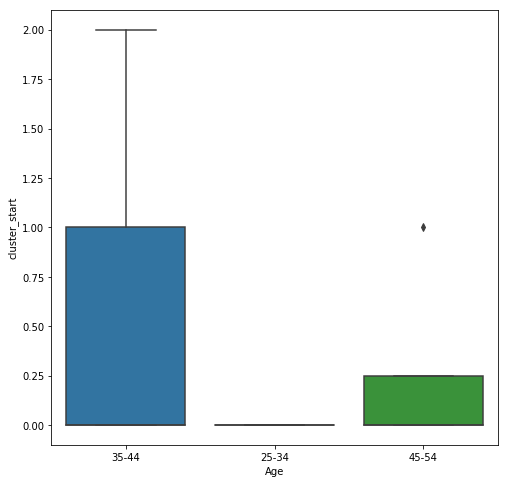

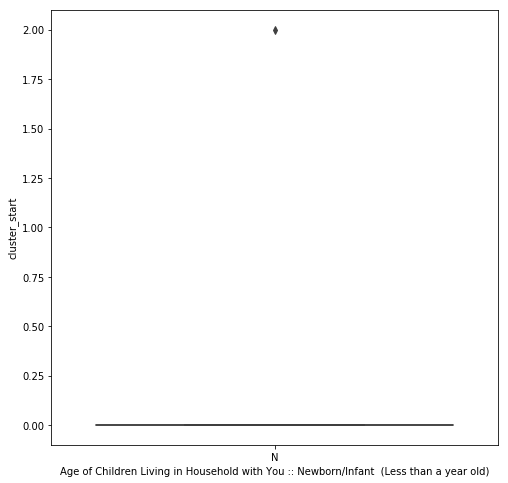

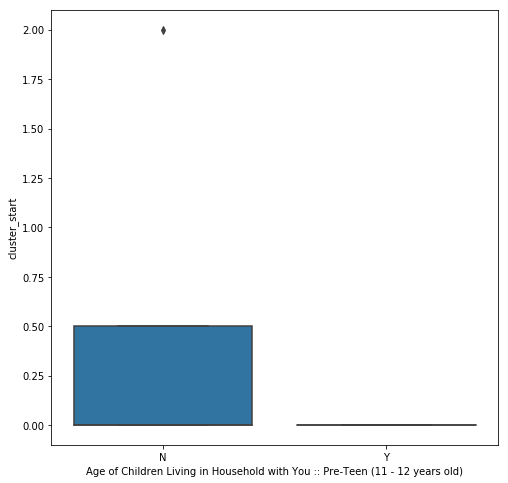

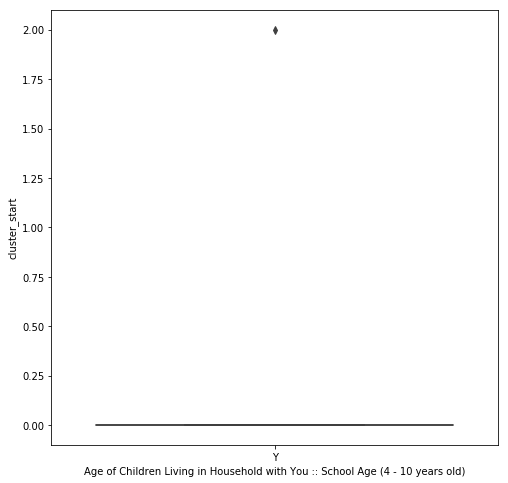

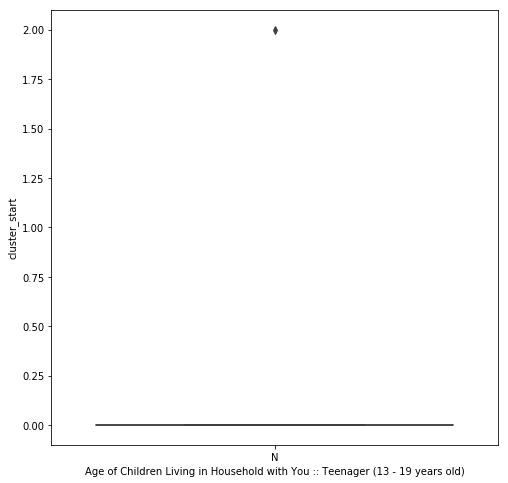

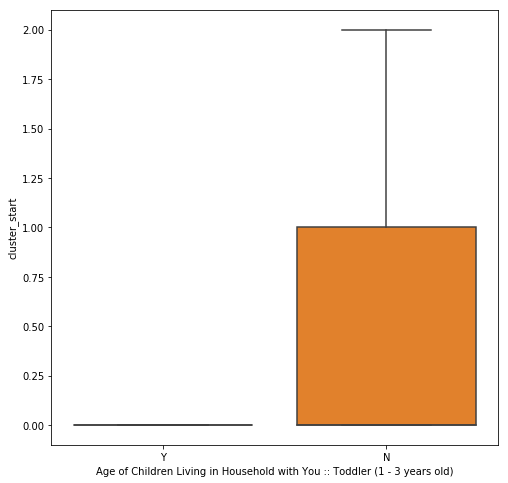

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

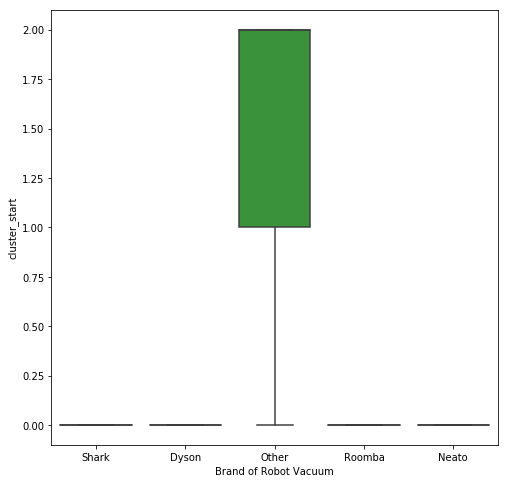

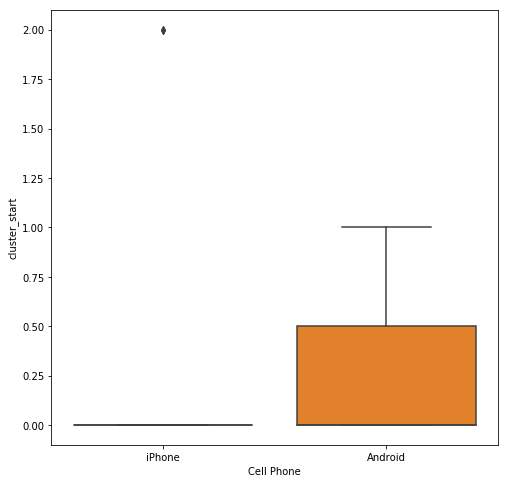

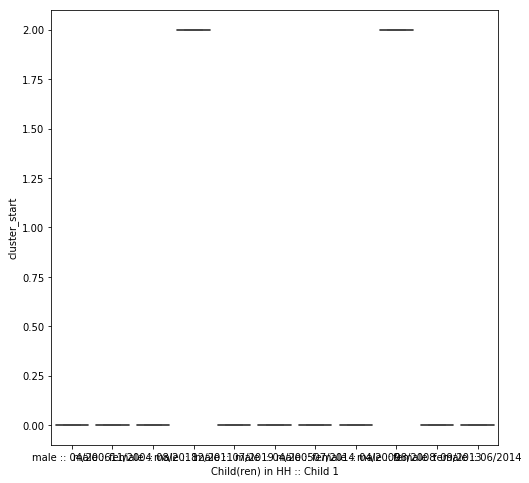

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

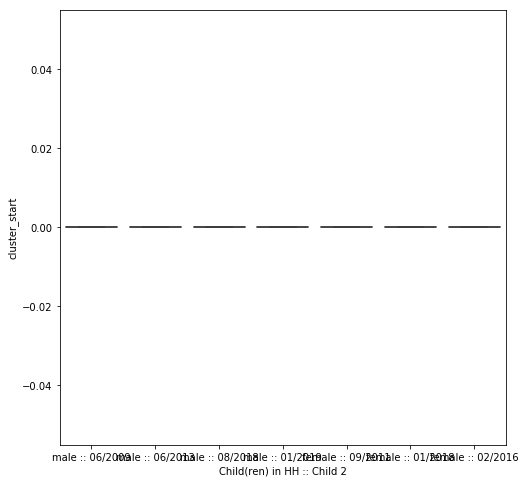

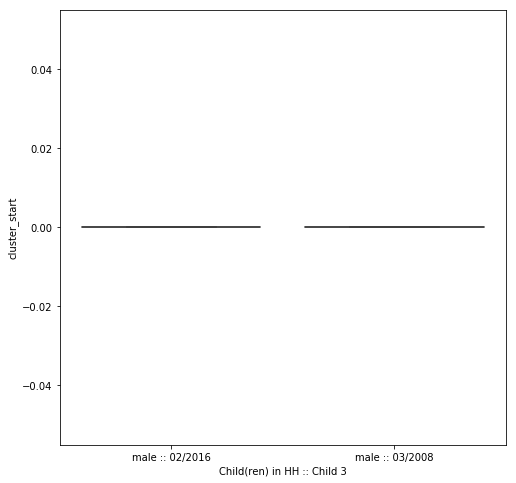

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

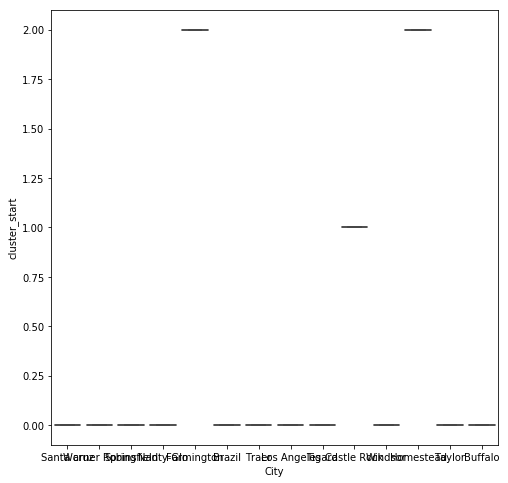

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

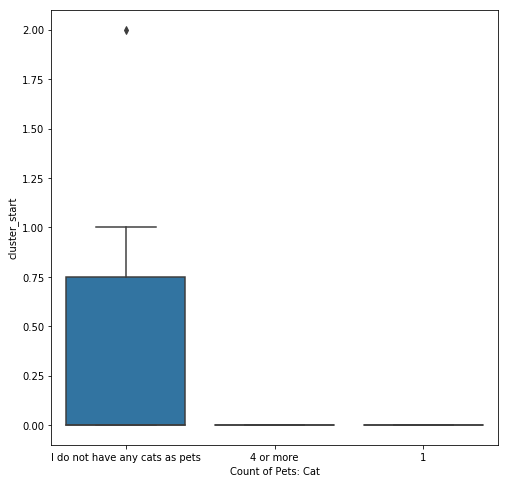

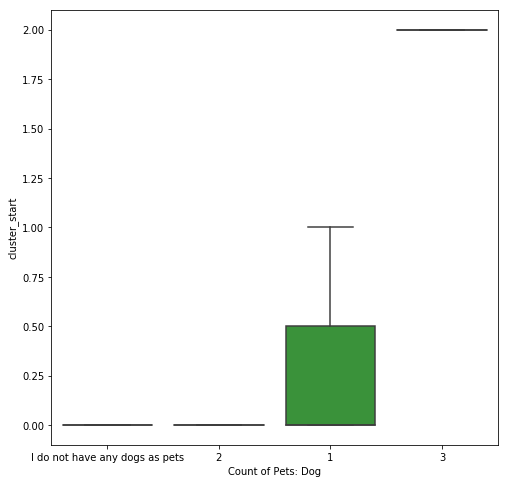

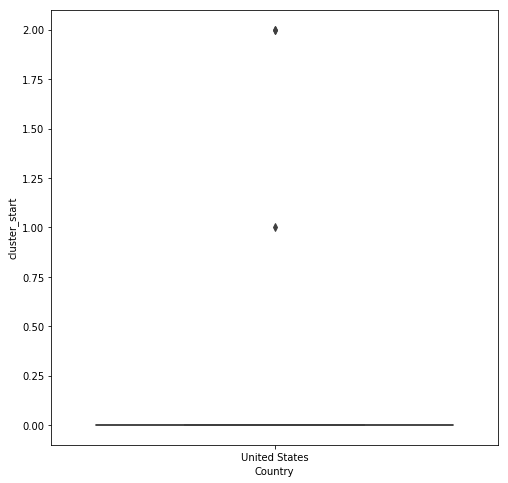

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

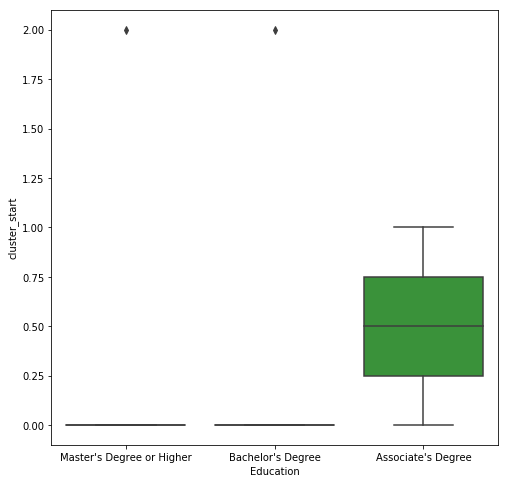

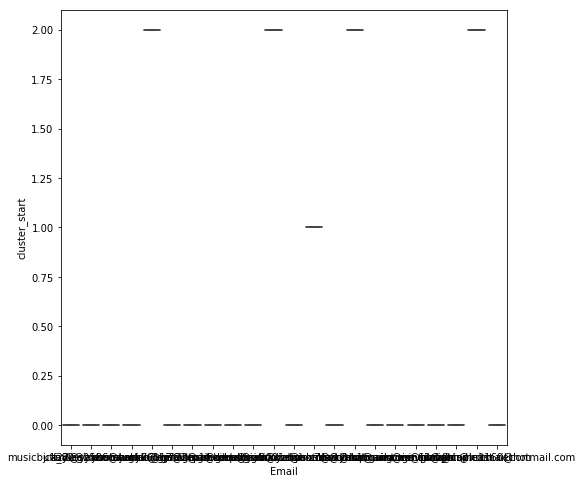

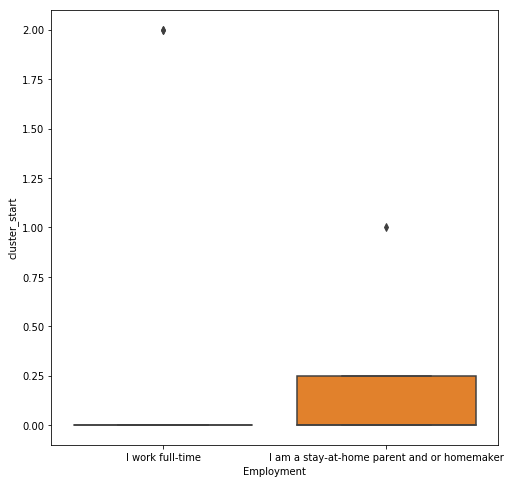

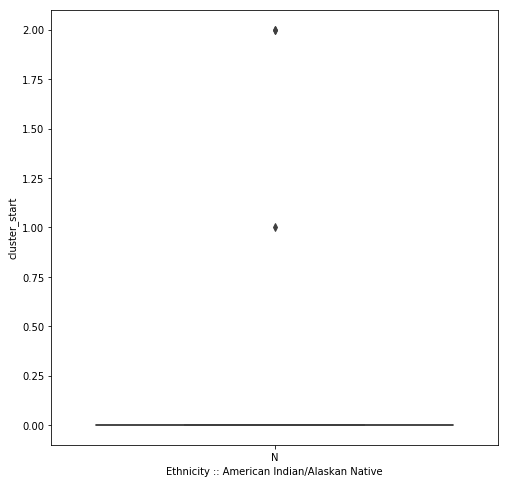

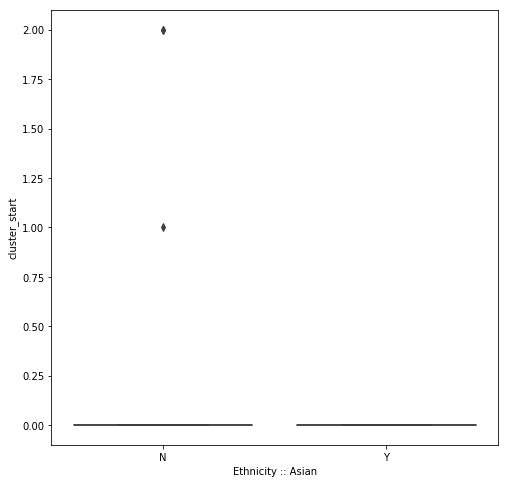

...

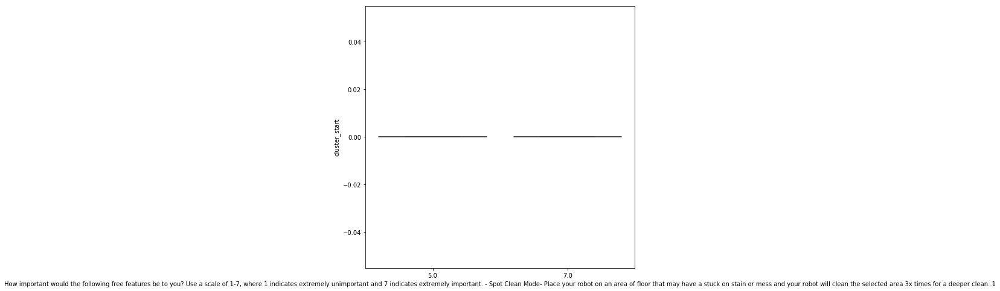

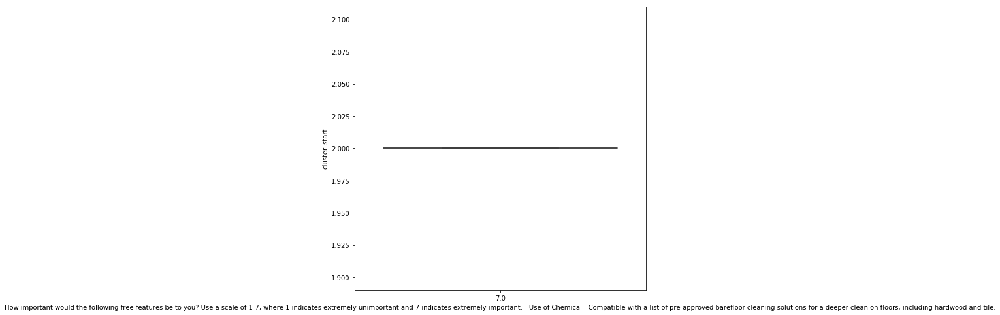

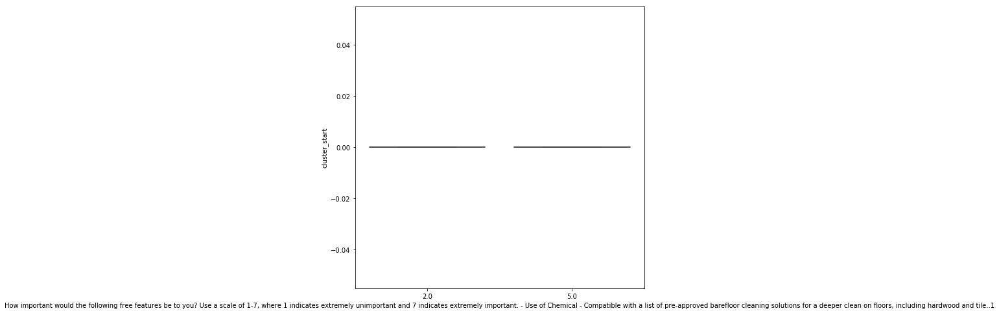

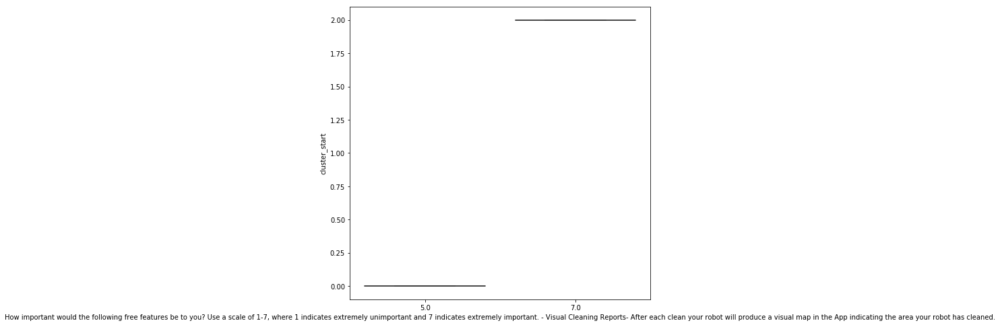

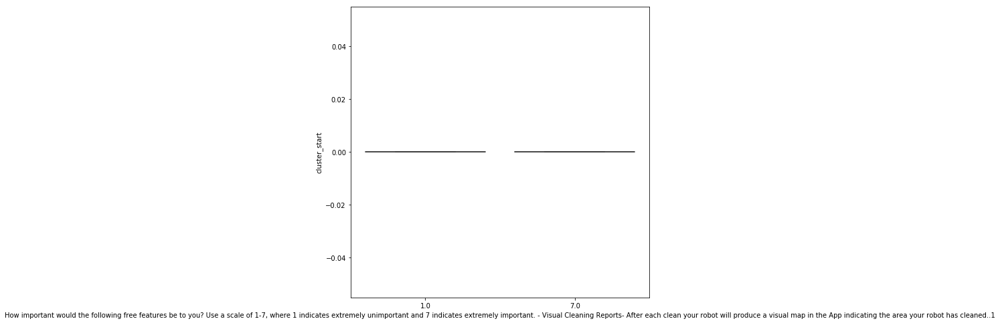

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

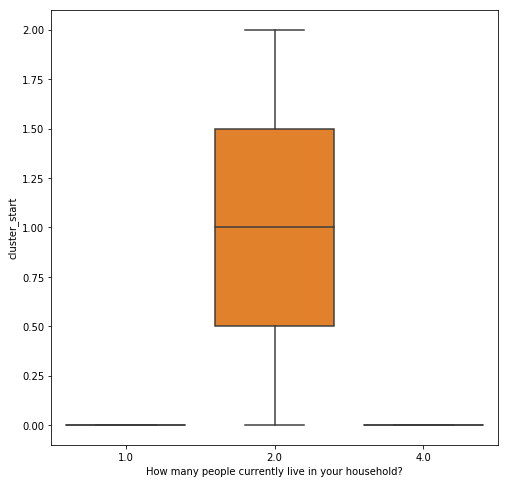

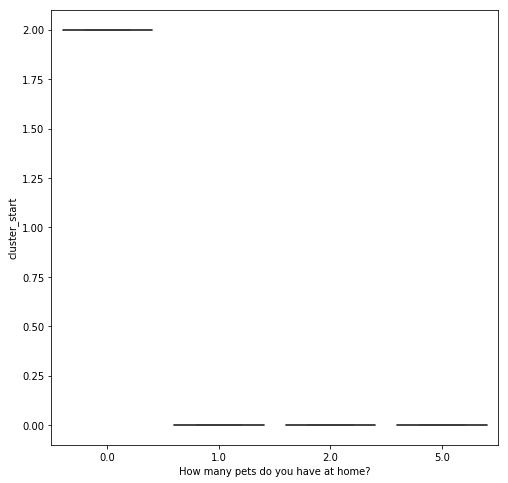

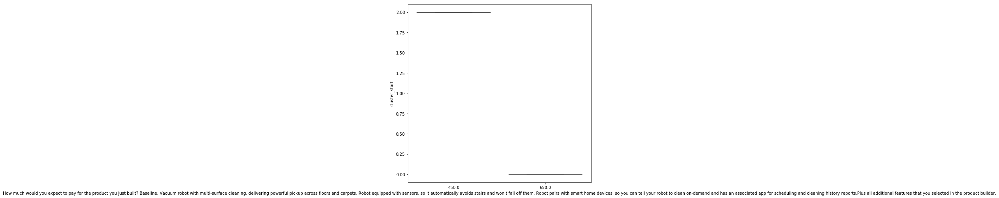

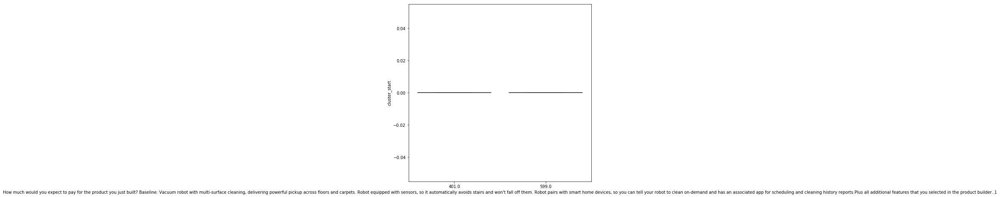

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

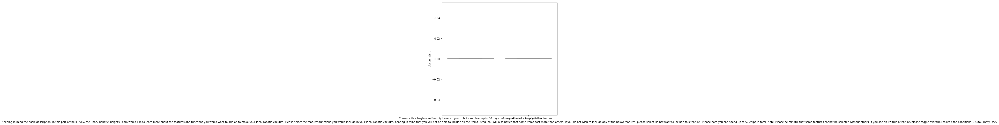

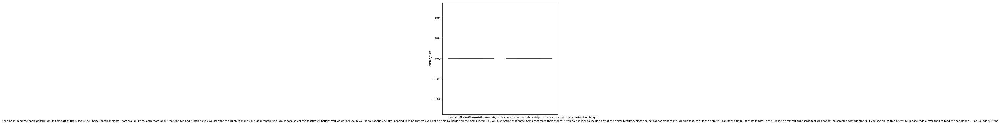

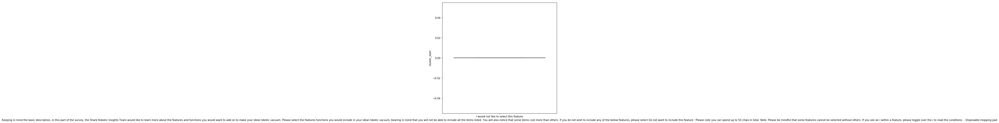

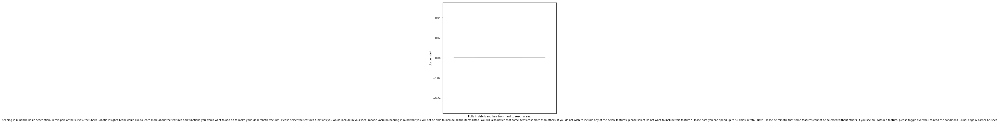

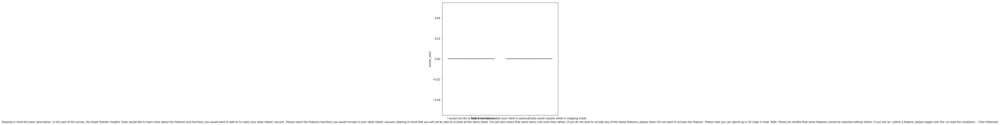

...

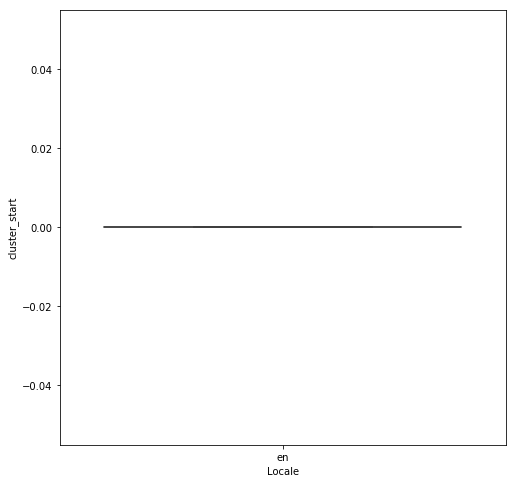

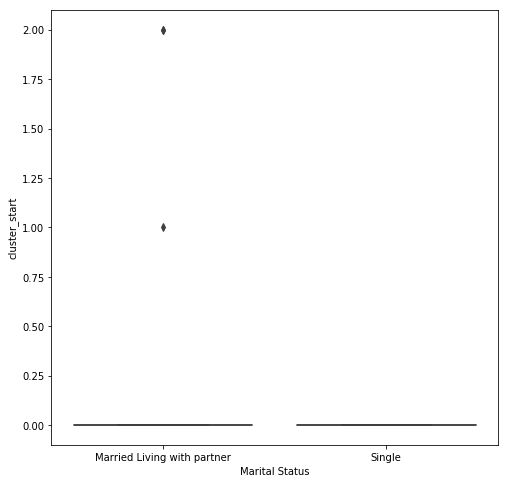

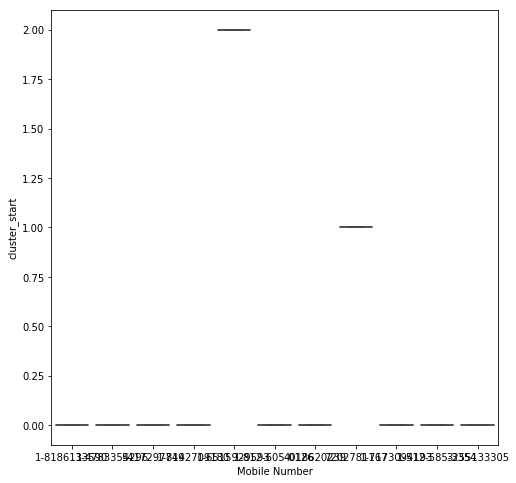

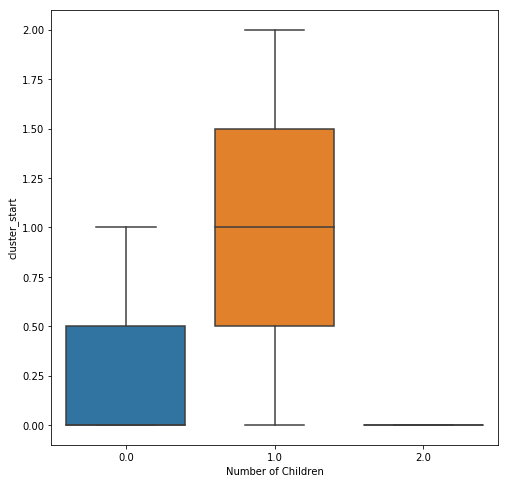

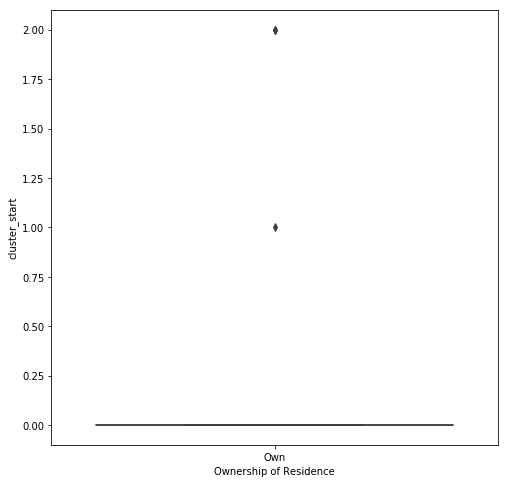

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

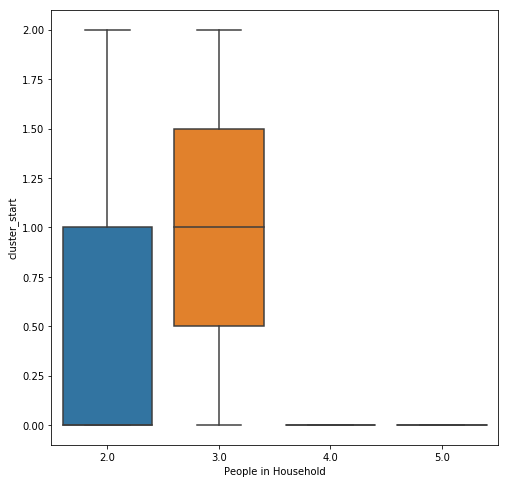

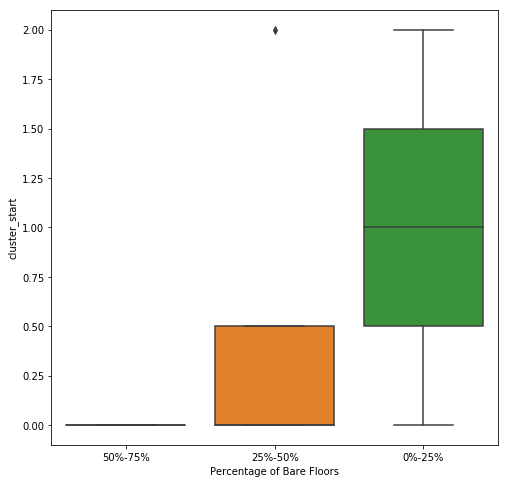

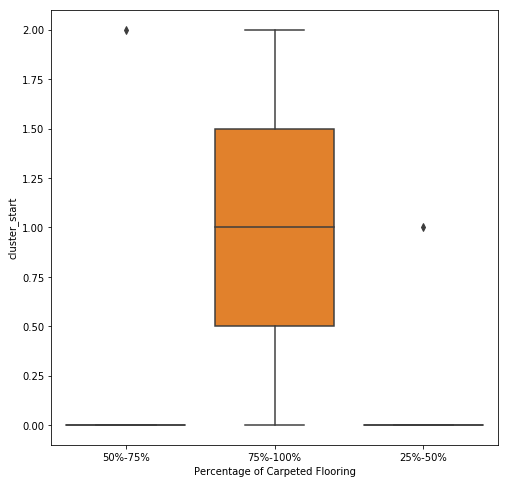

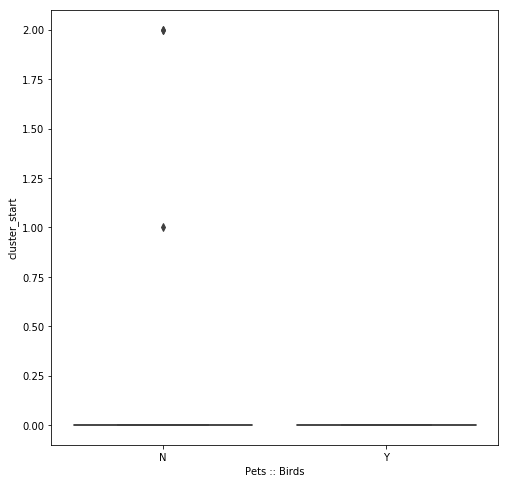

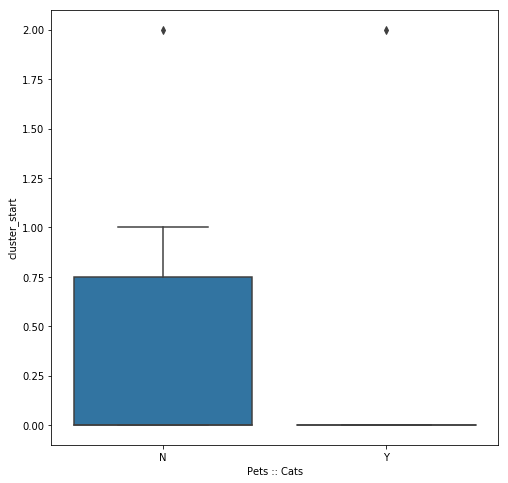

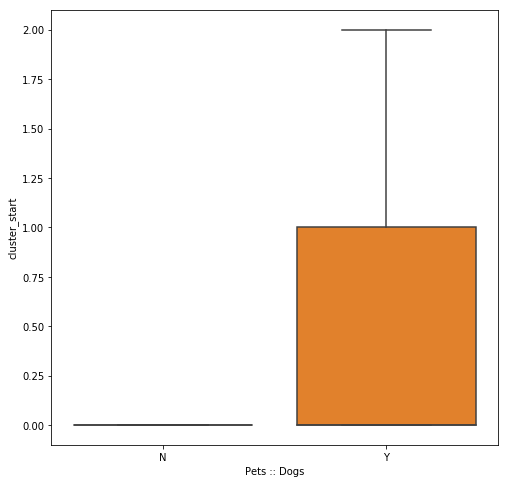

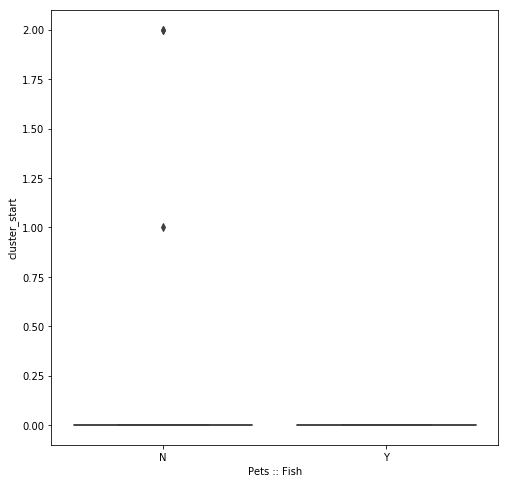

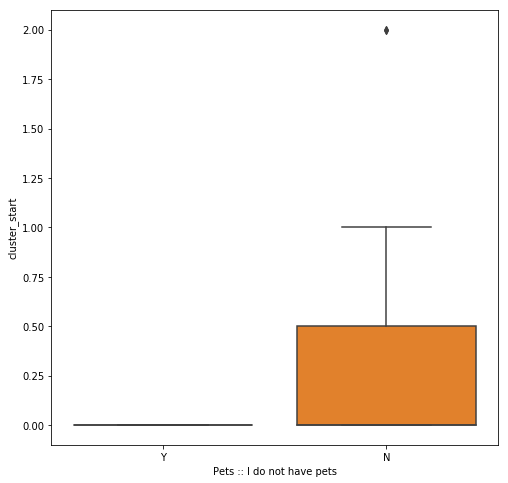

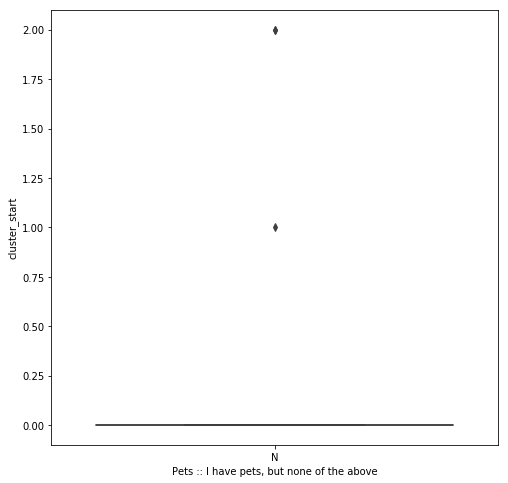

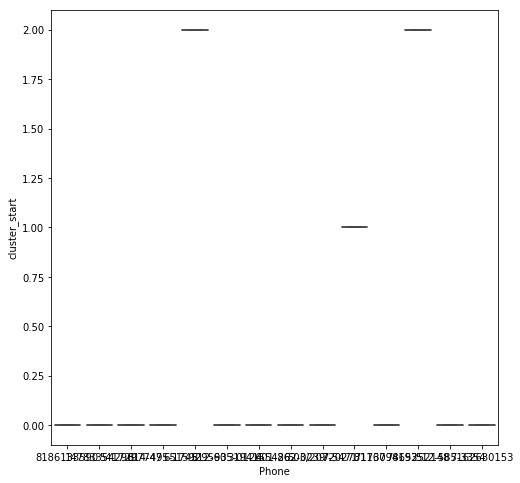

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

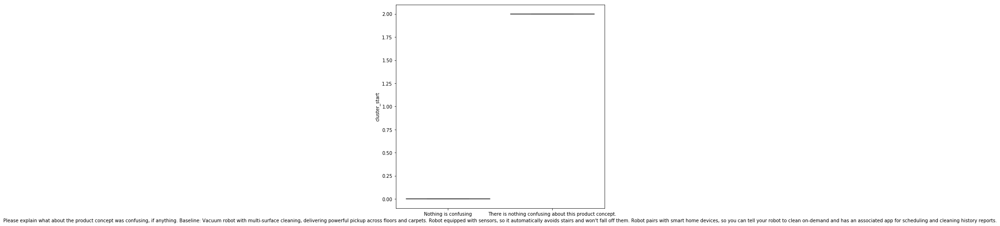

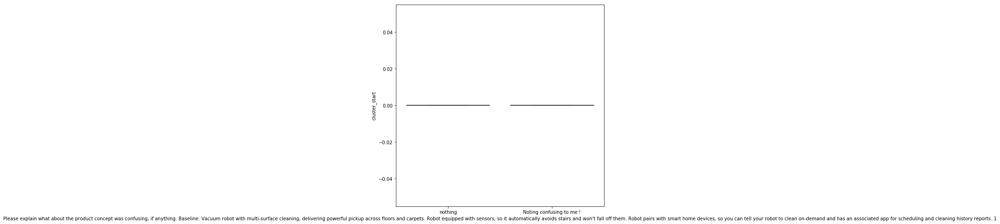

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

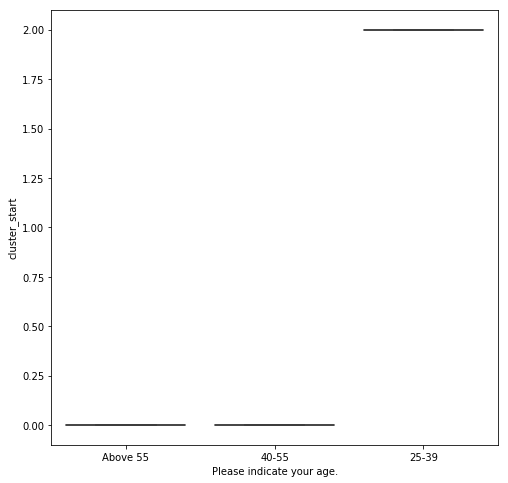

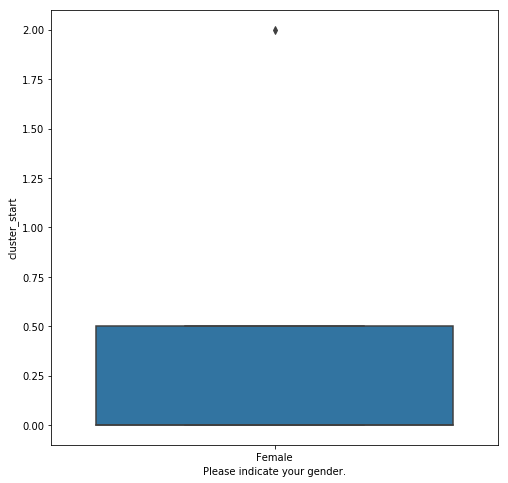

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

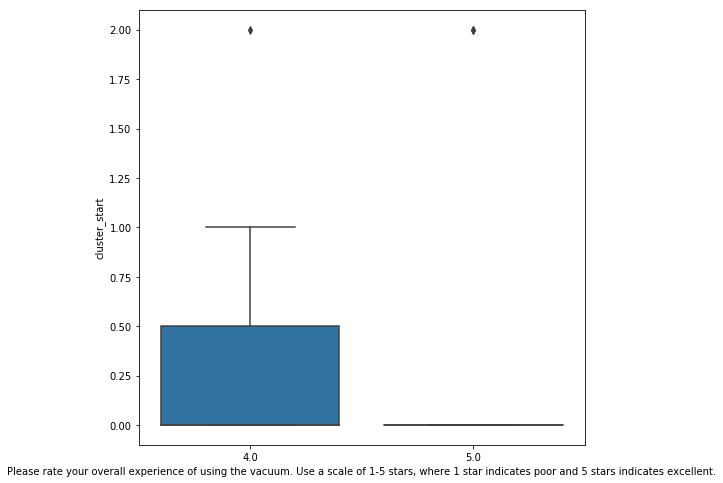

<Figure size 576x576 with 0 Axes>

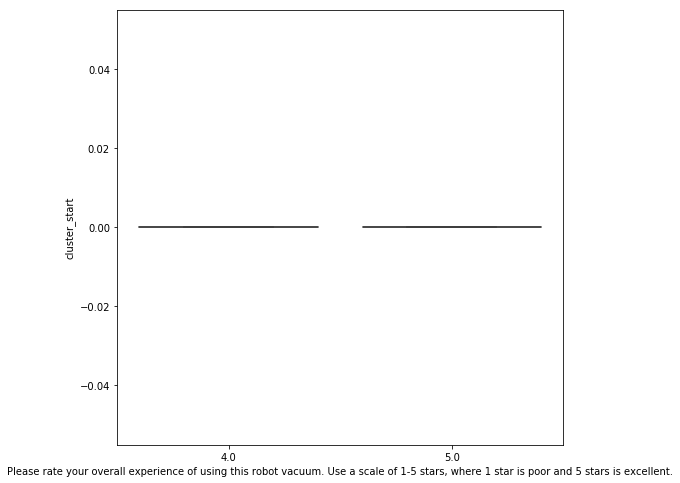

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

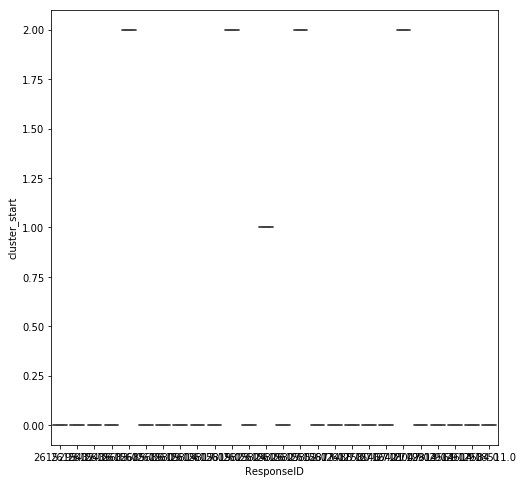

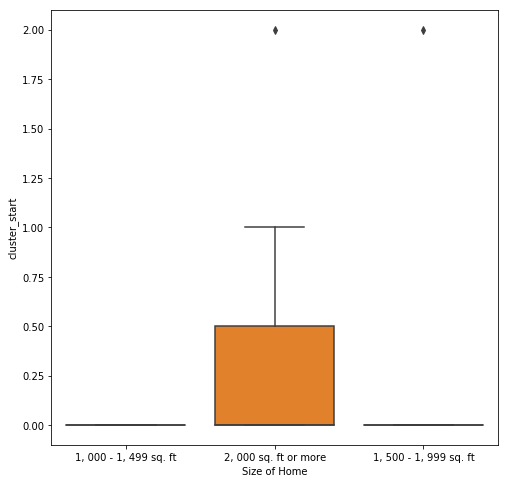

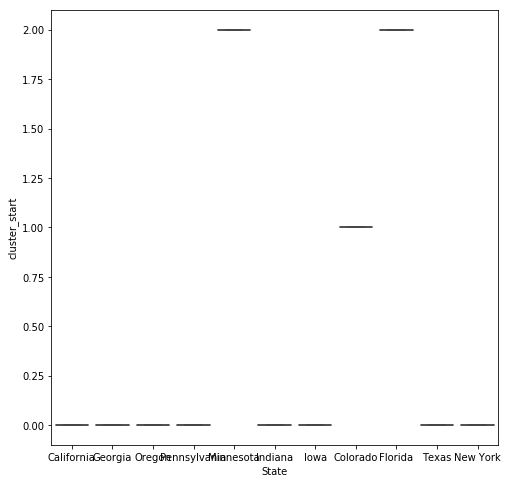

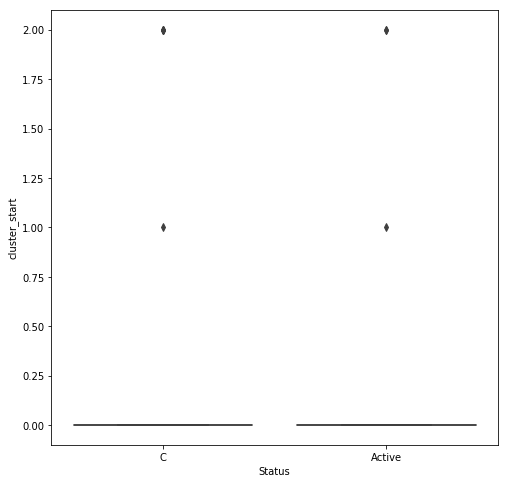

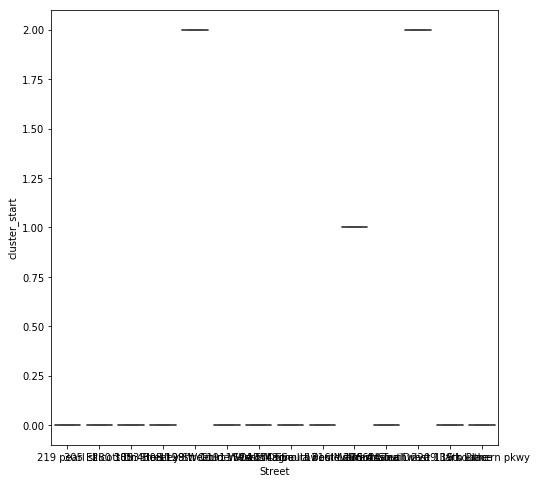

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

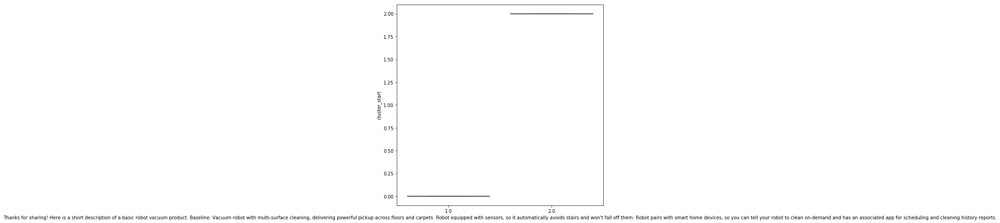

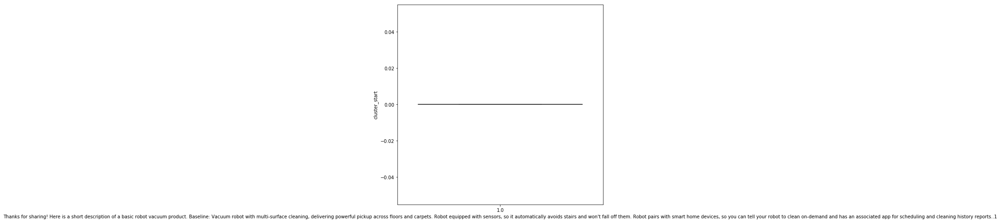

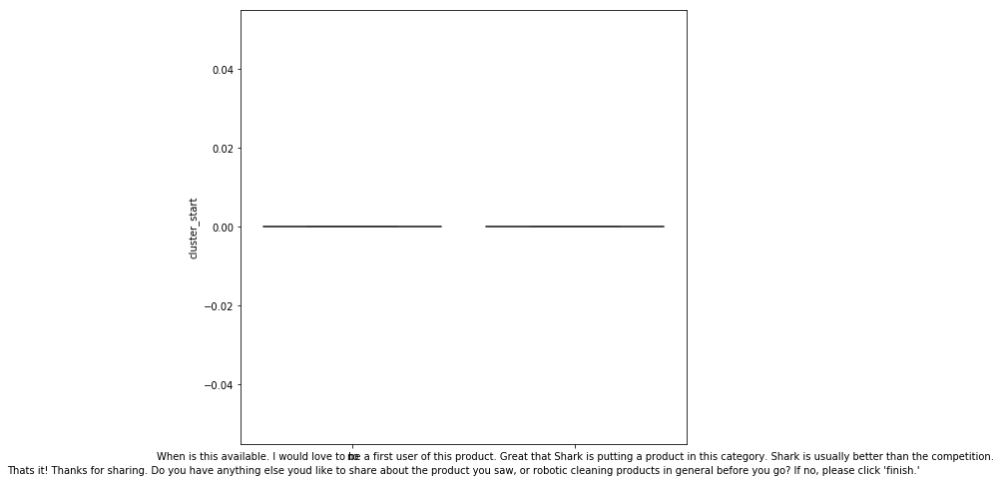

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

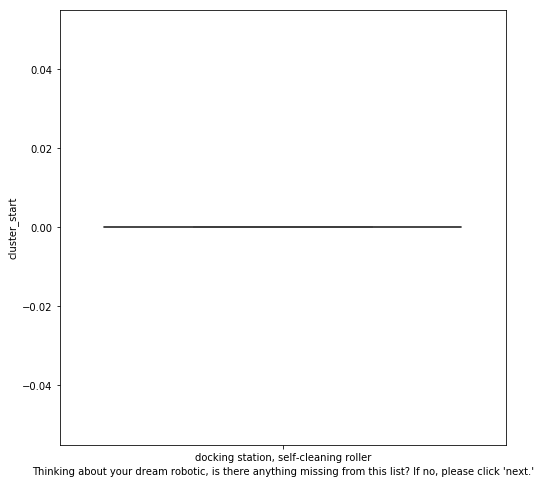

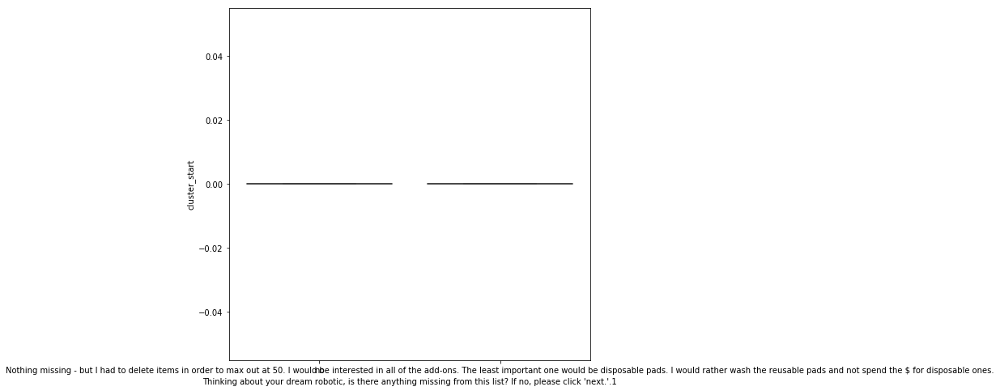

<Figure size 576x576 with 0 Axes>

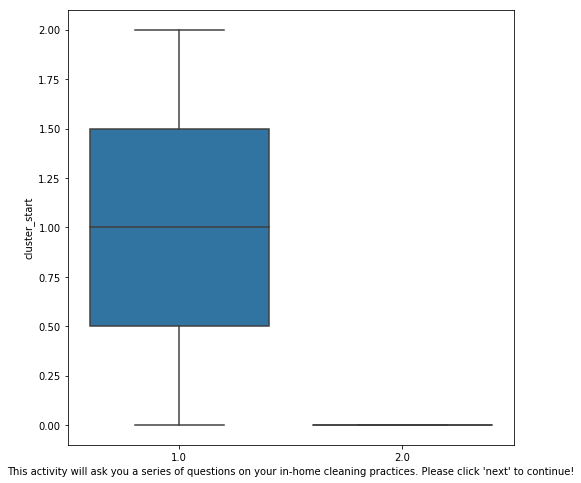

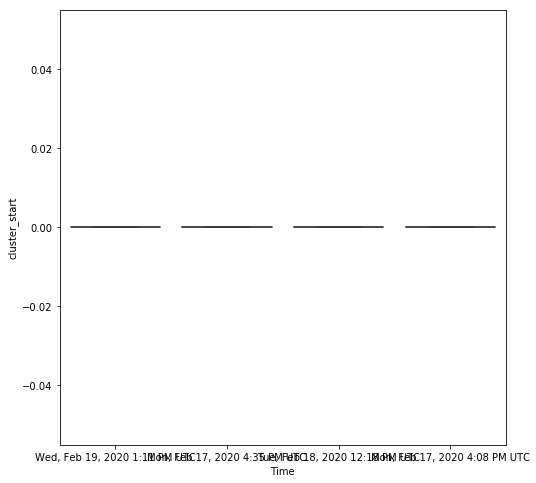

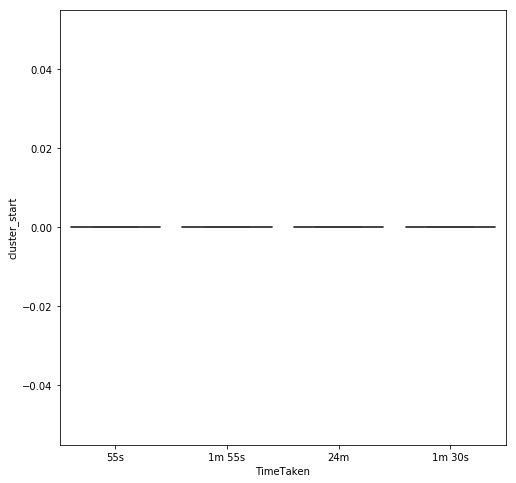

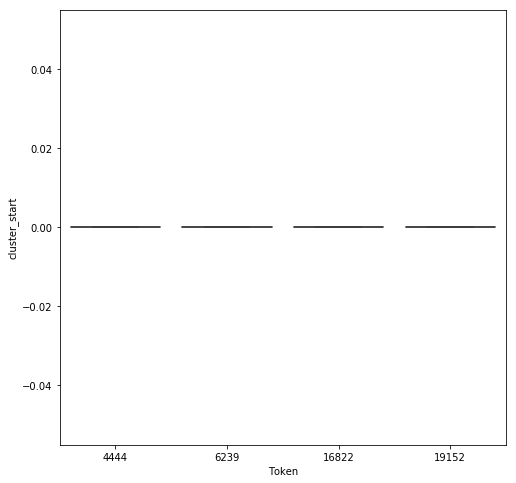

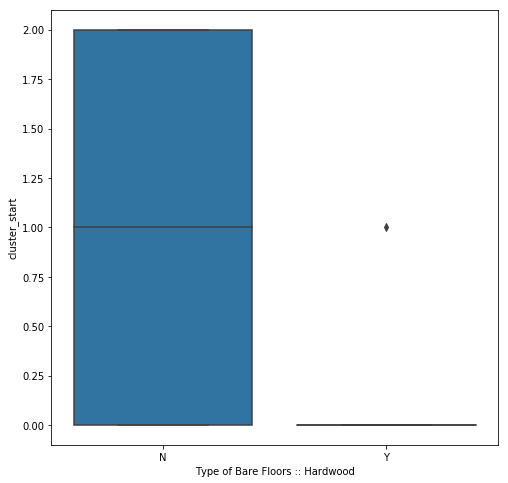

...

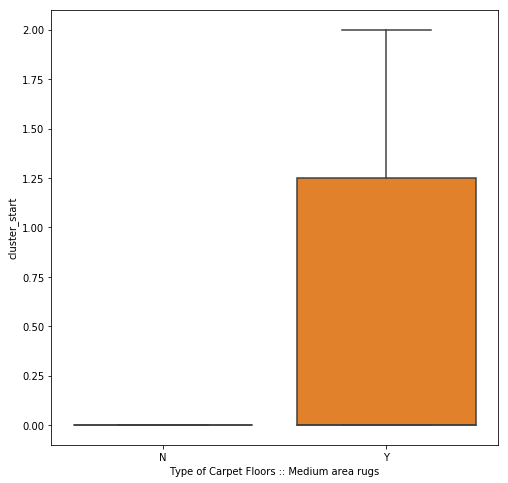

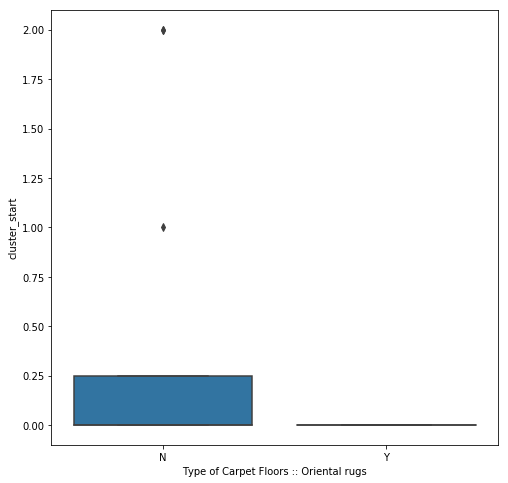

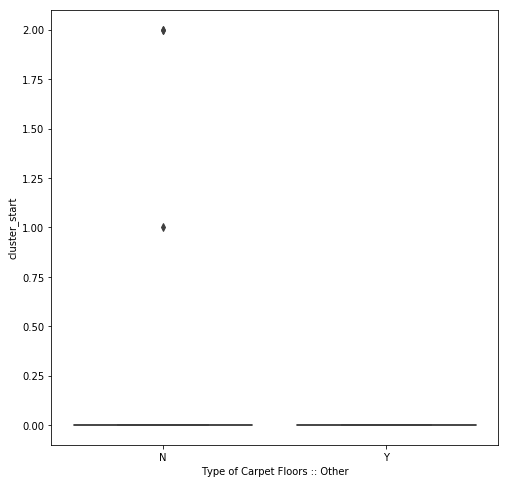

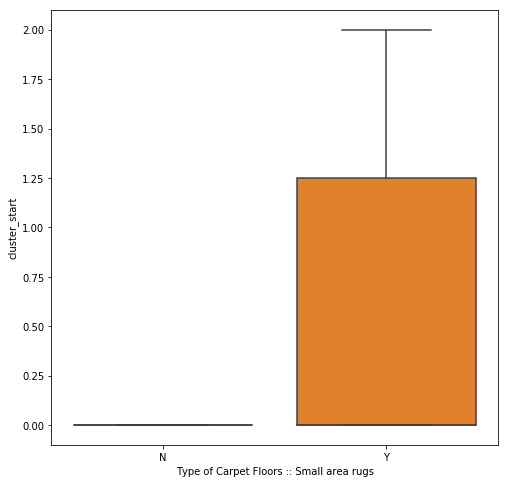

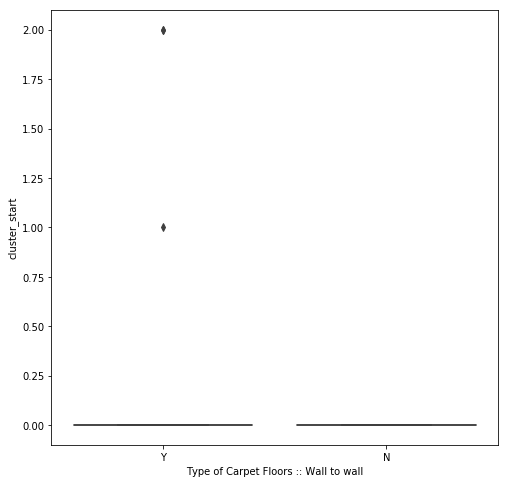

<Figure size 576x576 with 0 Axes>

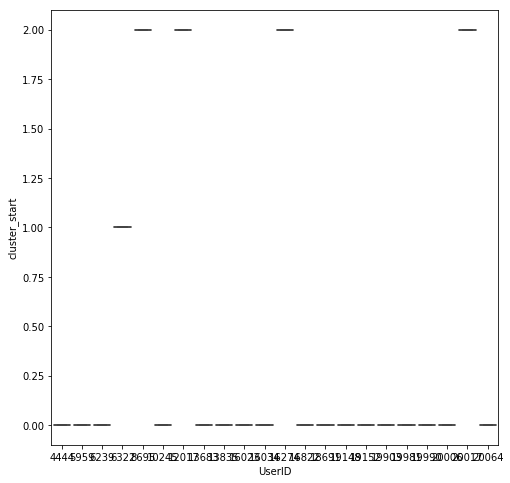

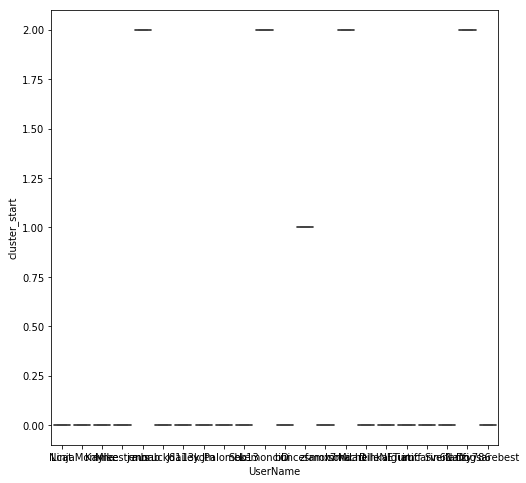

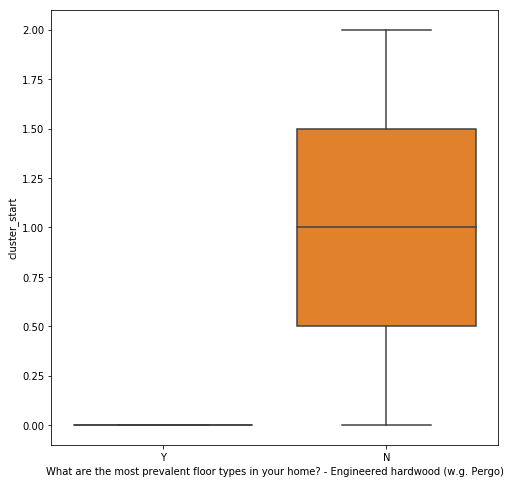

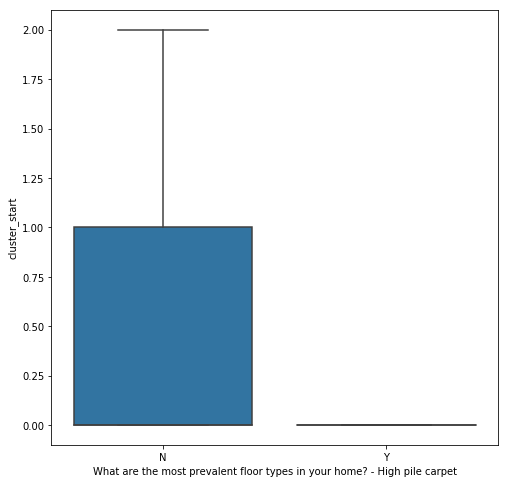

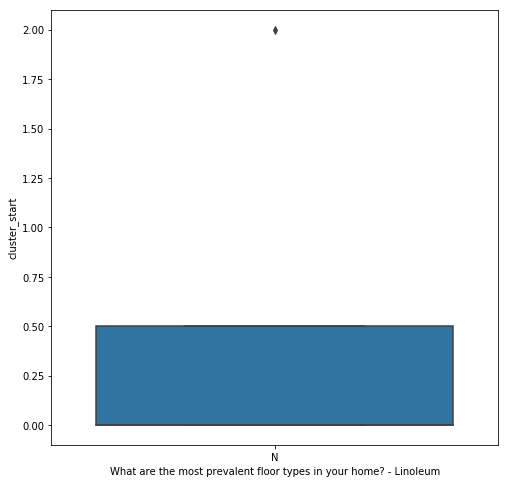

...

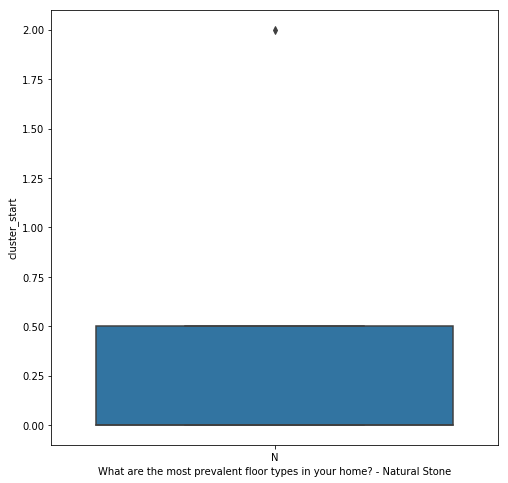

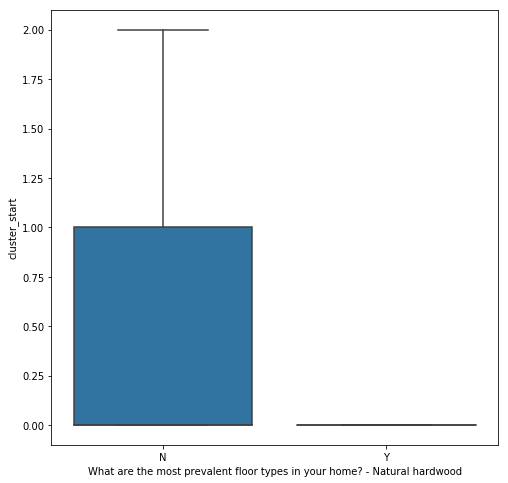

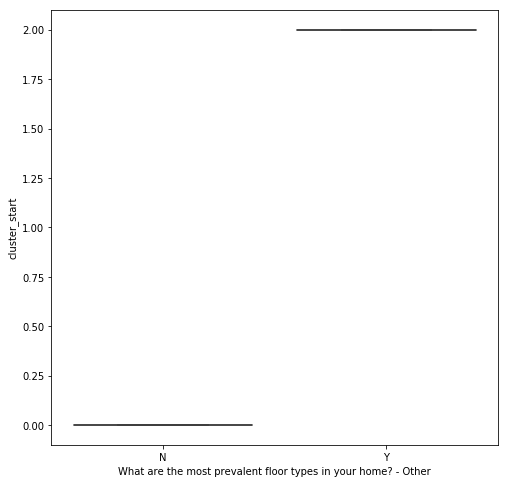

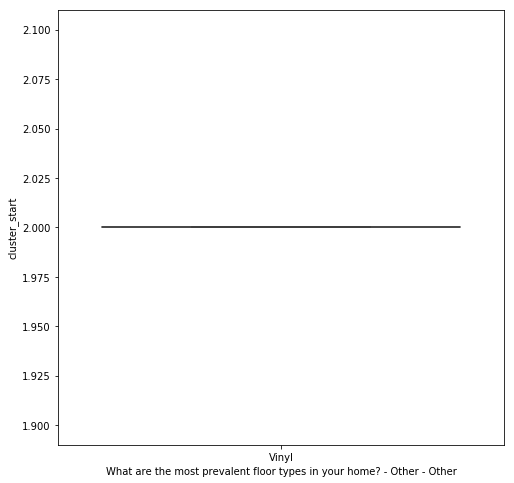

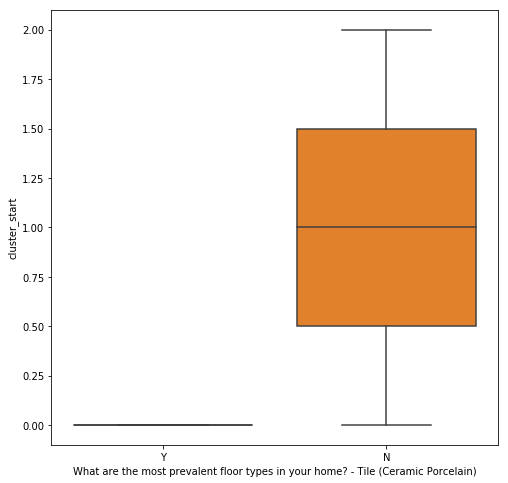

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

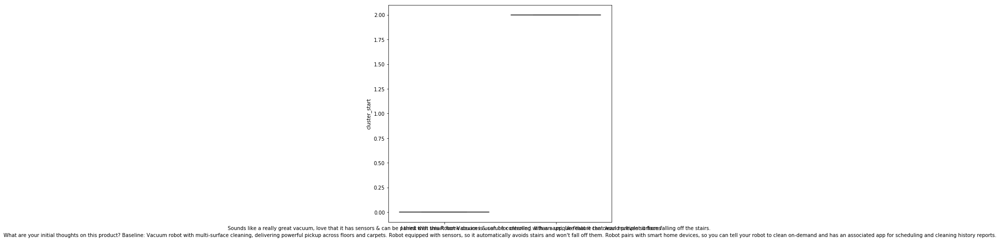

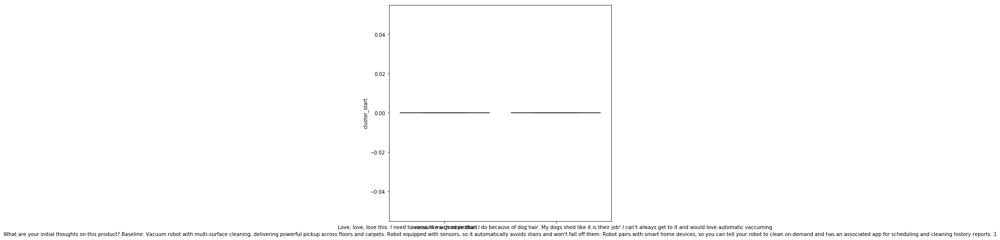

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

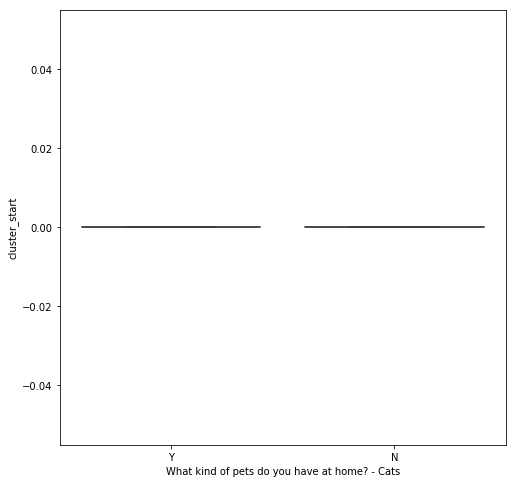

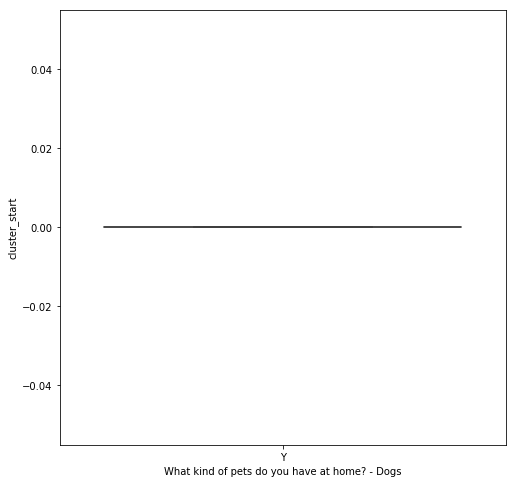

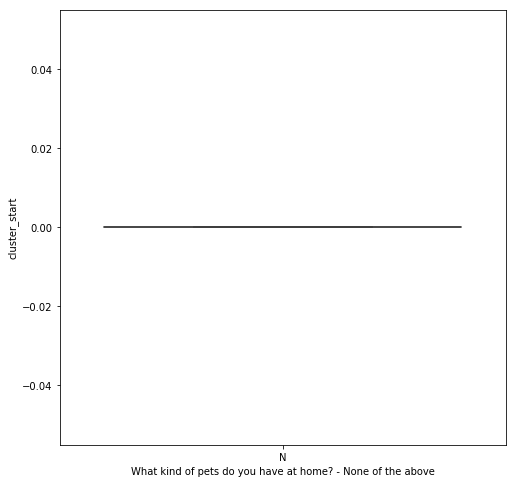

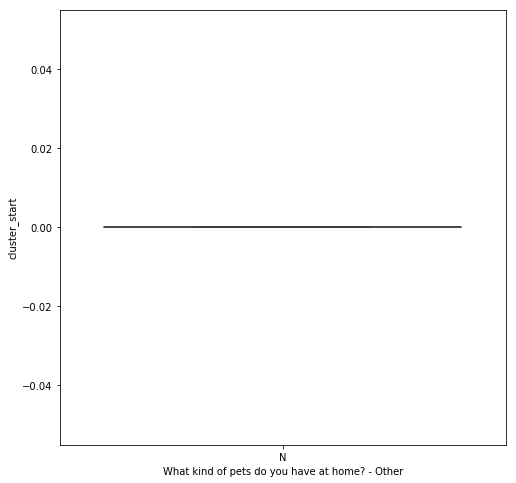

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

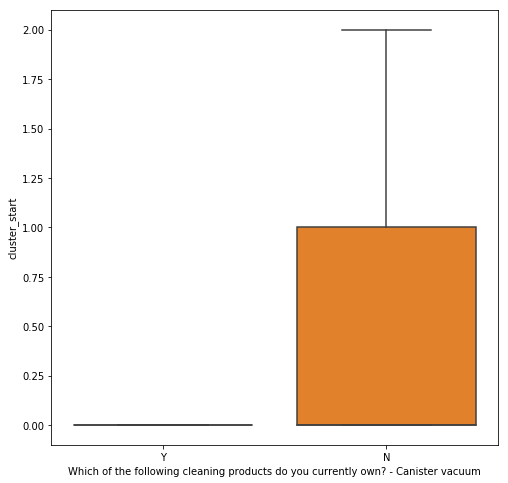

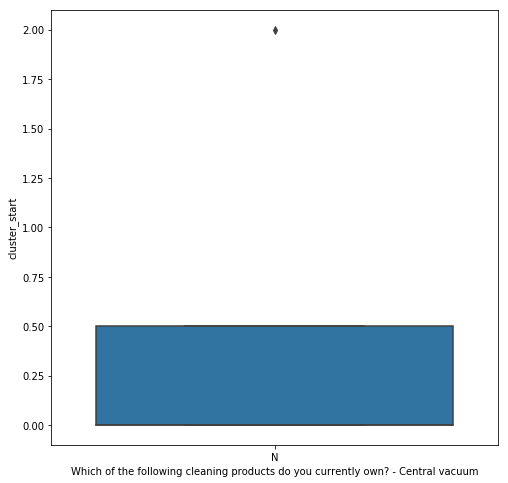

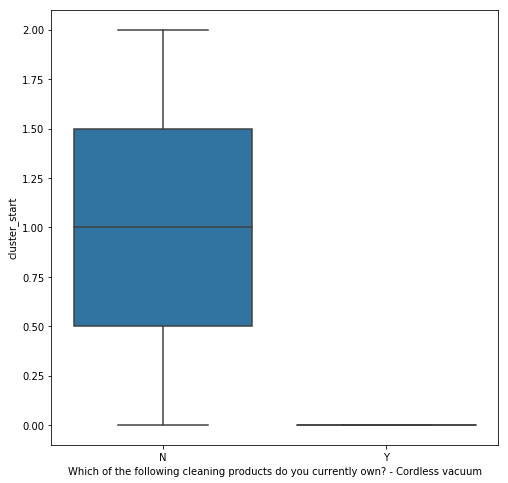

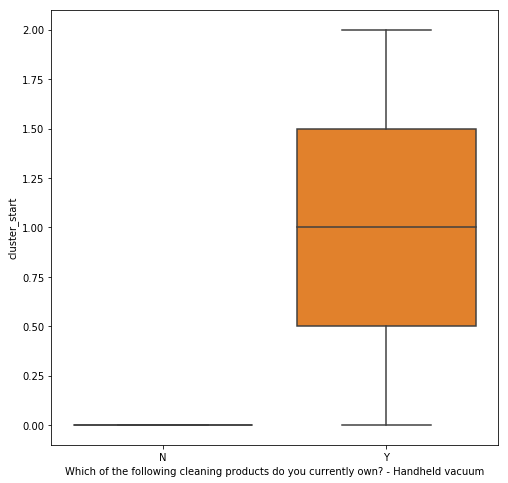

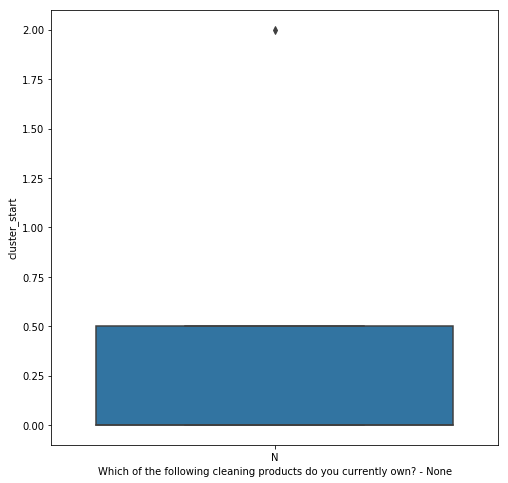

...

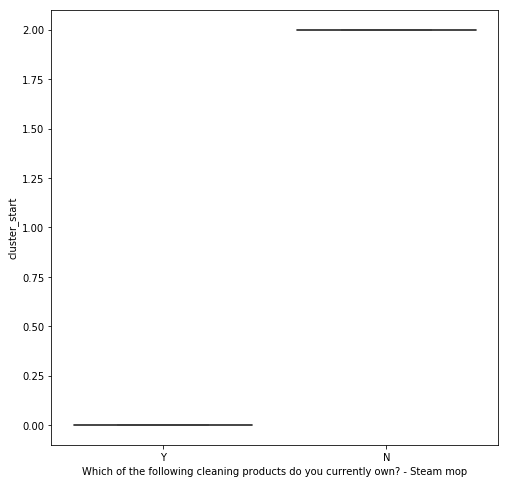

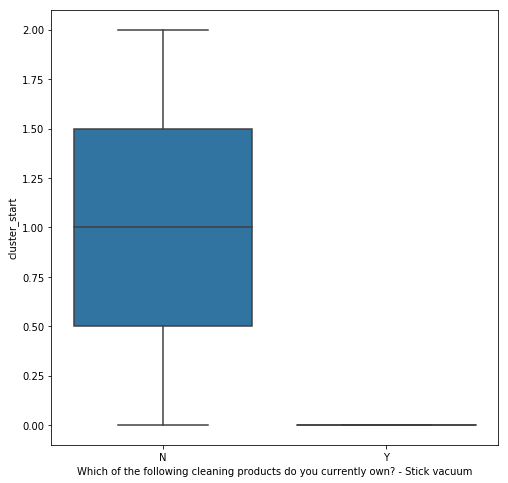

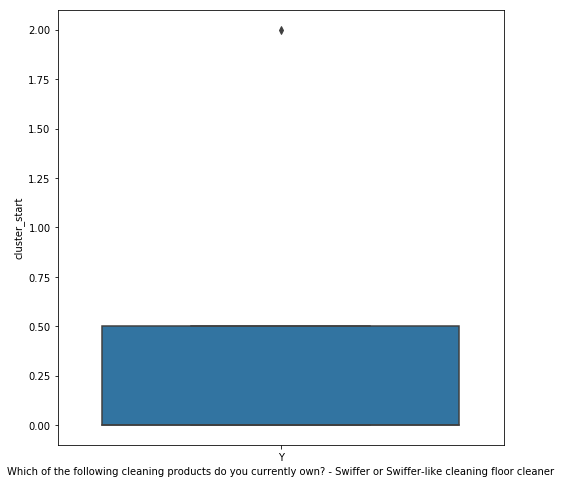

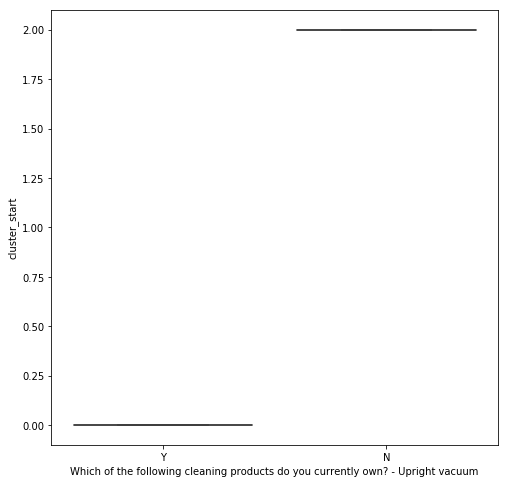

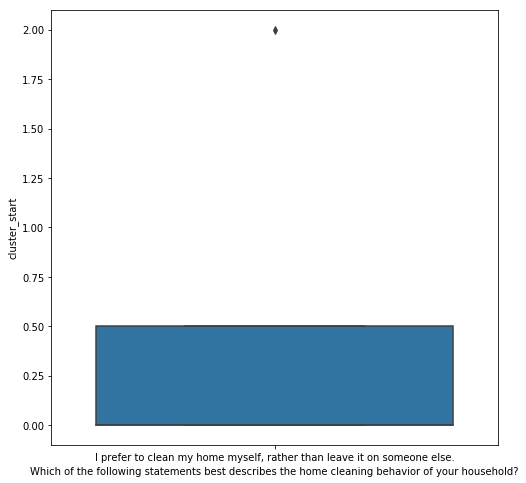

<Figure size 576x576 with 0 Axes>

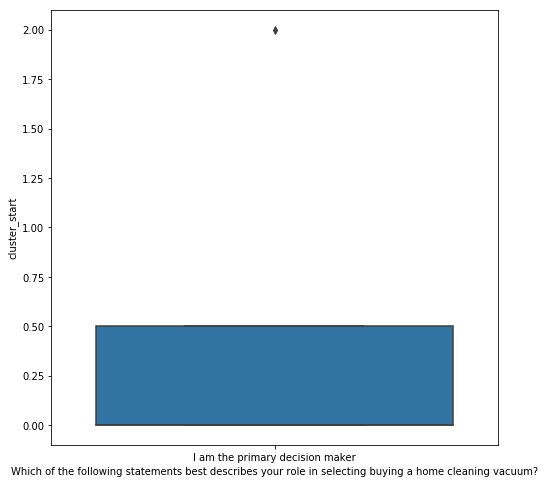

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

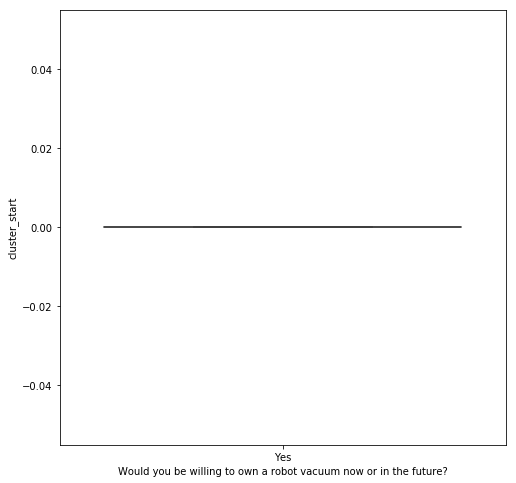

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

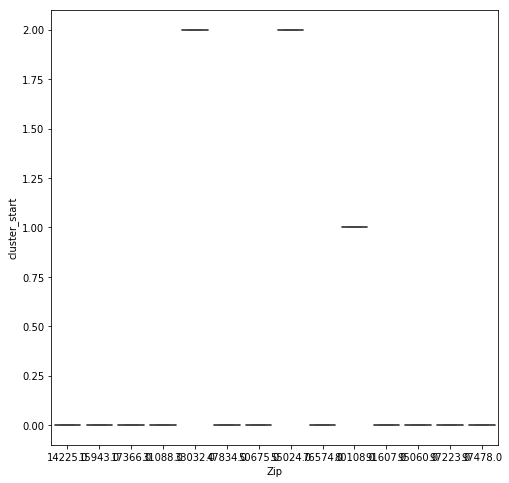

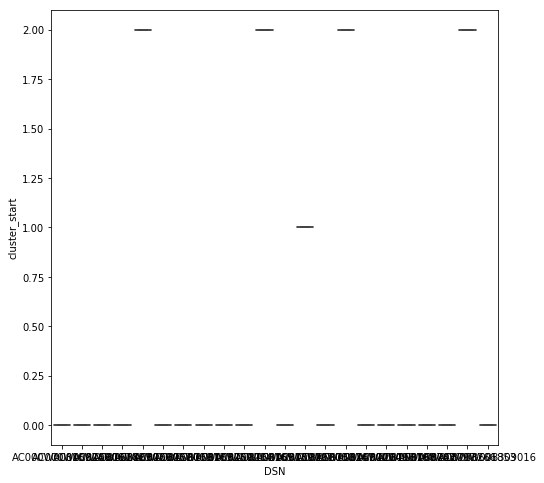

<Figure size 576x576 with 0 Axes>

In [360]:
for i in a.columns:
    try:
        #print(i)
        plt.figure(figsize=(8,8))
        sns.boxplot(x=i, y='cluster_start', data=pd.merge(a,internal,on='DSN'))
        print(pd.merge(a,b,on='DSN').groupby([i,'cluster_start']).size())
        plt.show()
        sns.boxplot(x=i, y='cluster_end', data=pd.merge(a,internal,on='DSN'))
        print(pd.merge(a,b,on='DSN').groupby([i,'cluster_end']).size())
        plt.show()
    except: continue

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

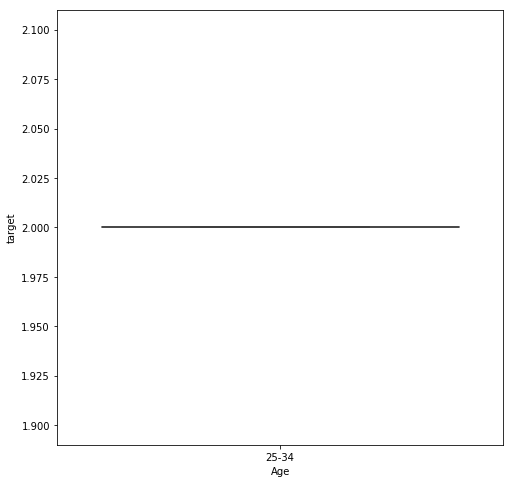

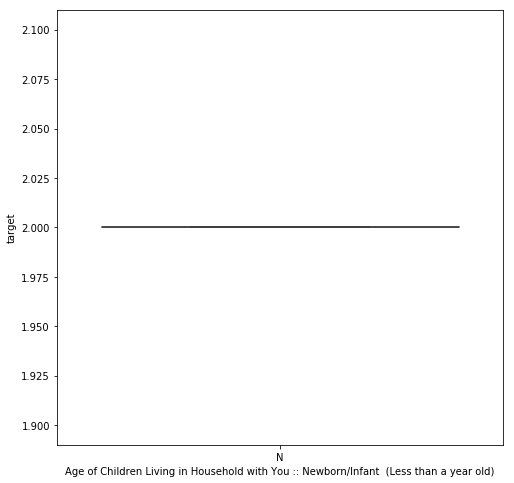

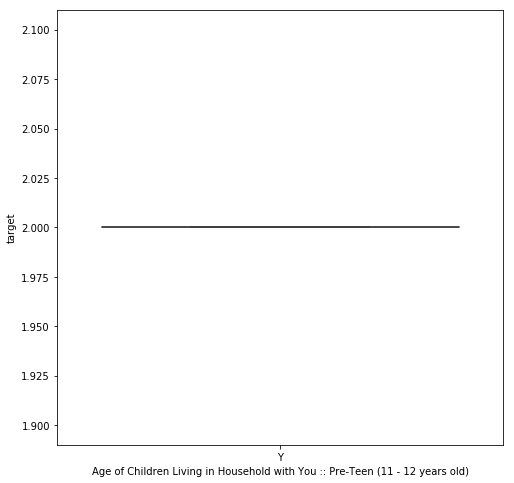

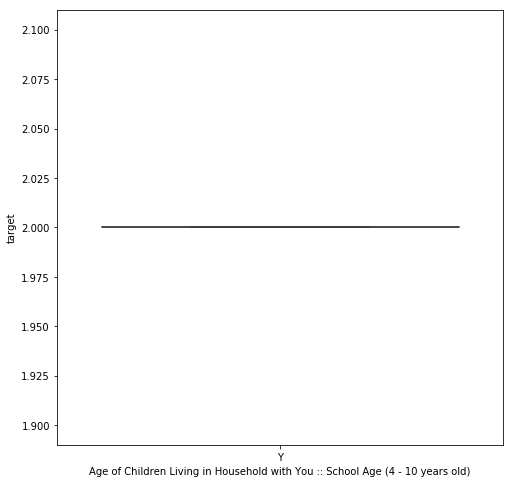

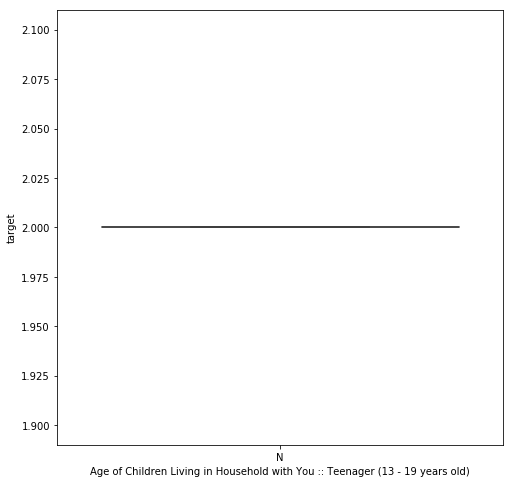

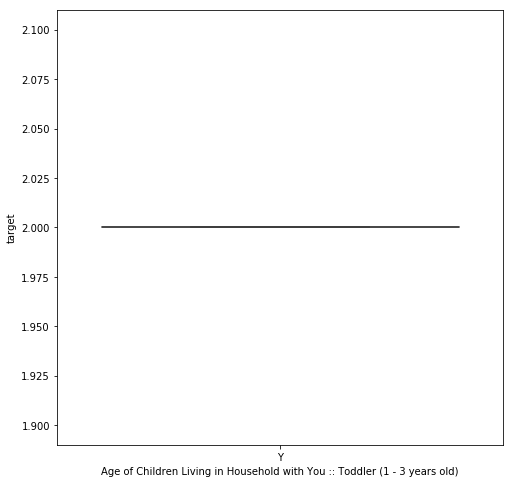

<Figure size 576x576 with 0 Axes>

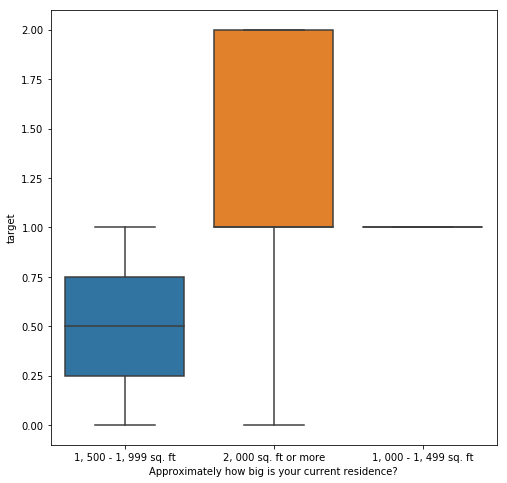

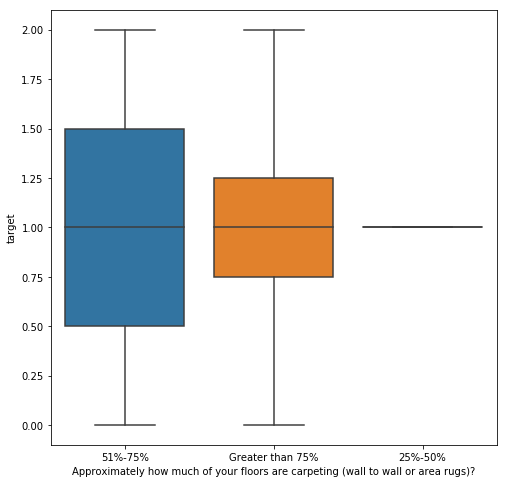

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

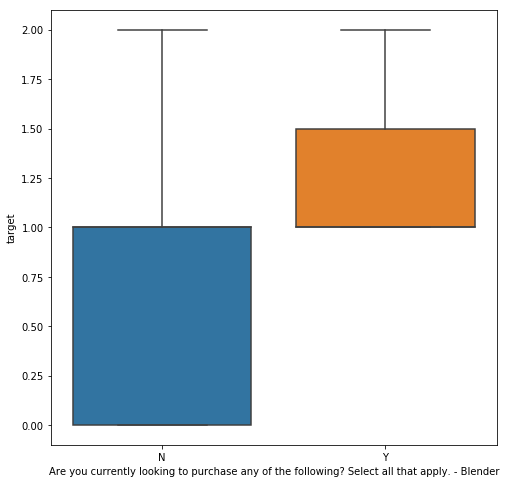

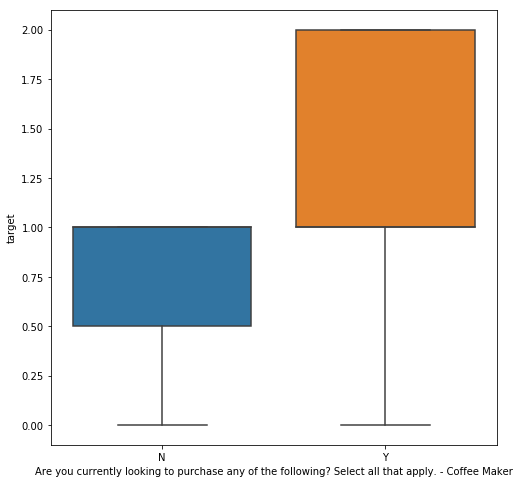

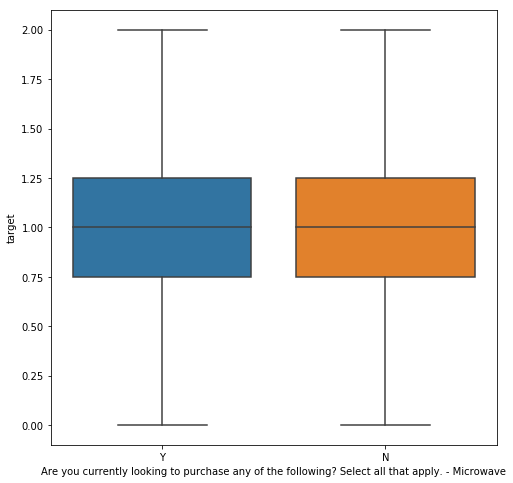

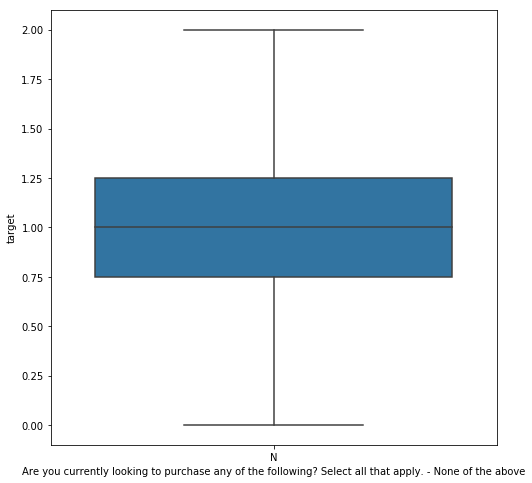

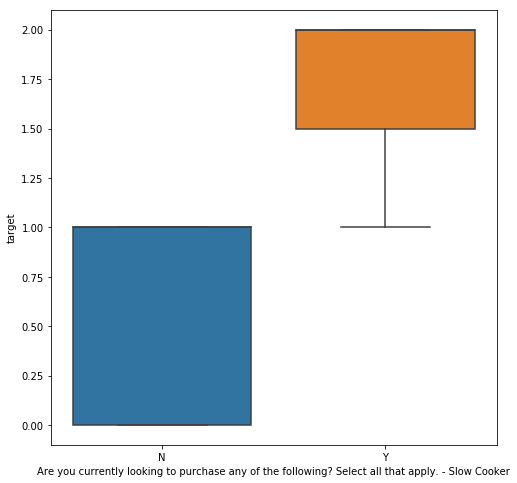

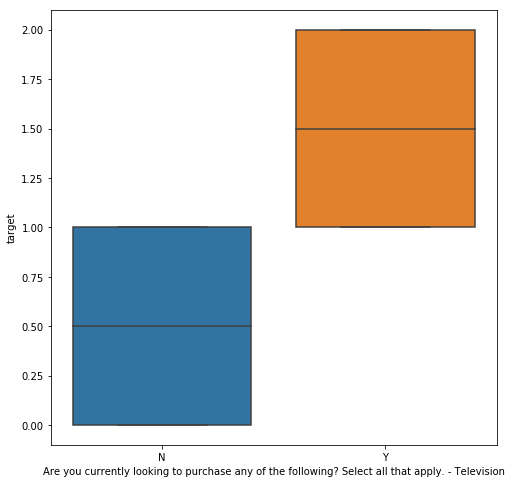

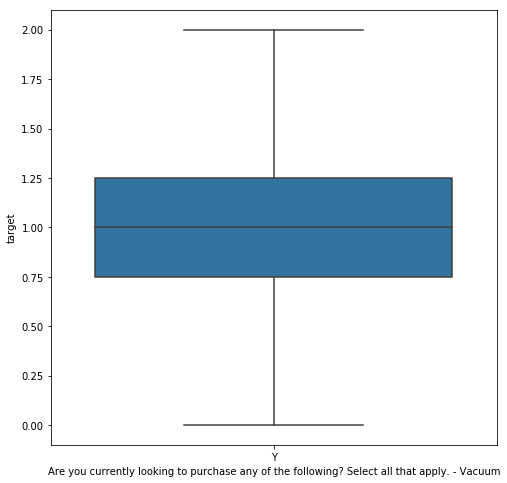

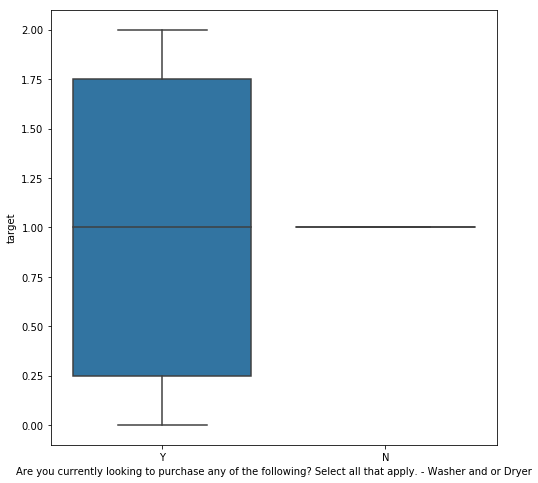

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

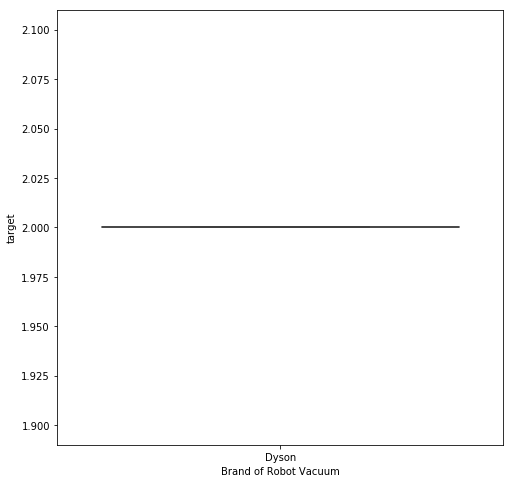

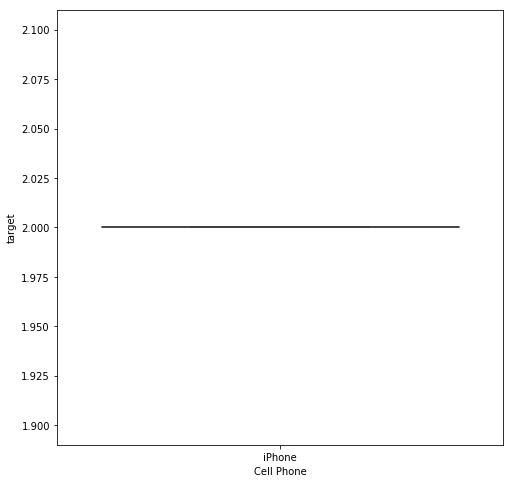

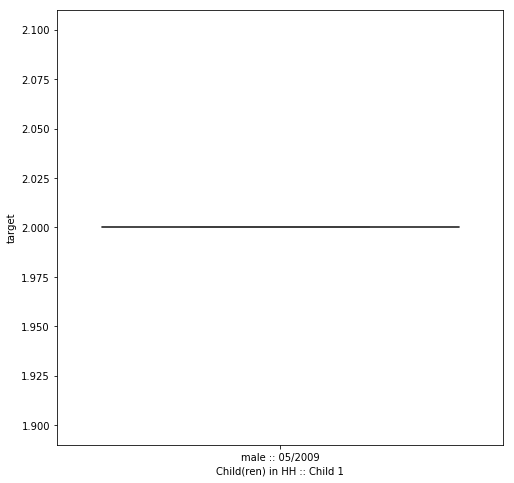

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

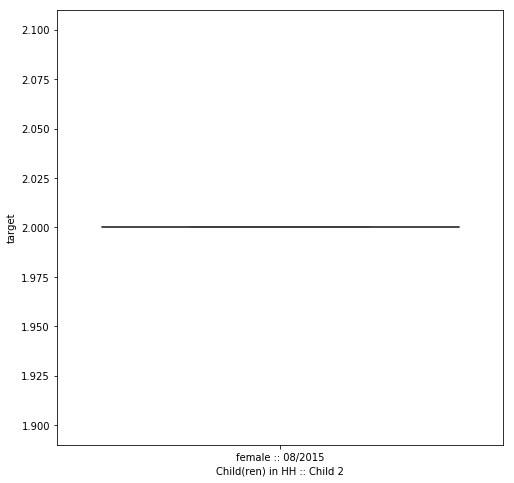

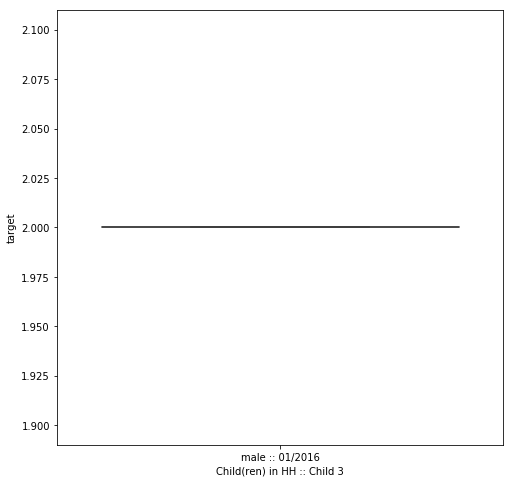

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

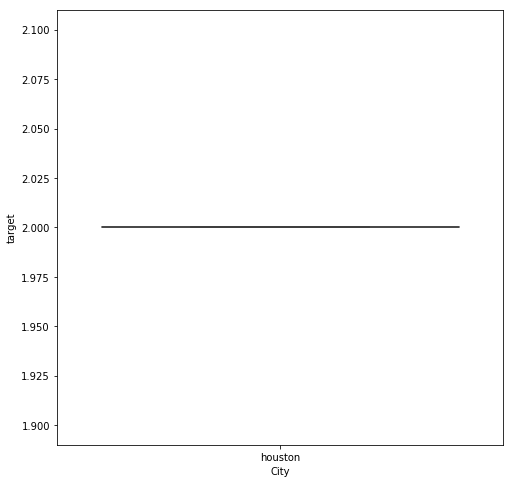

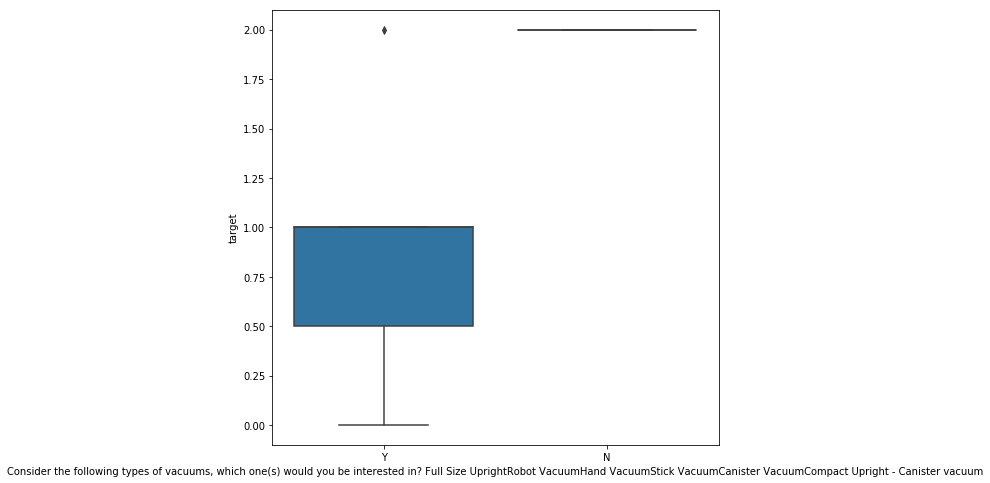

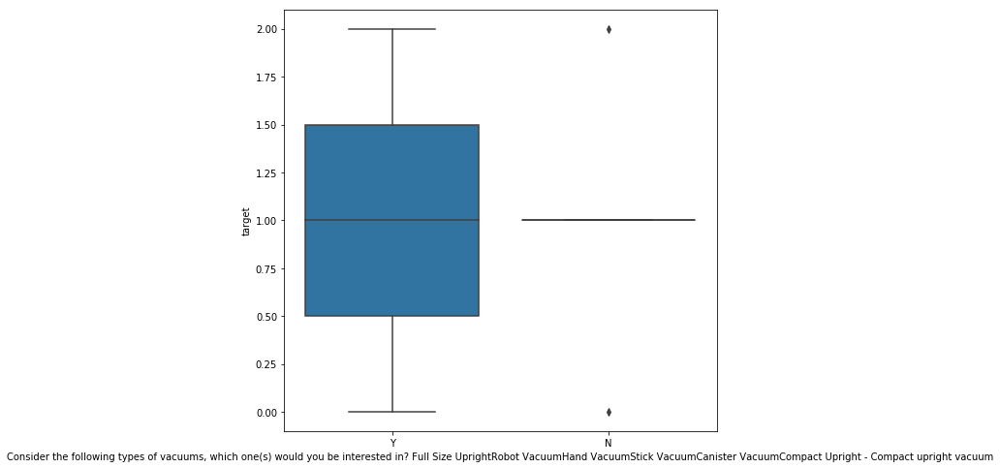

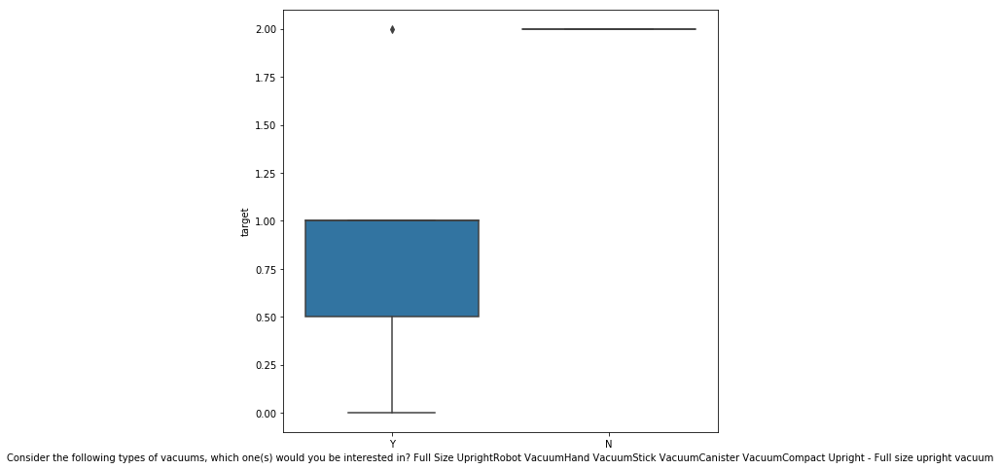

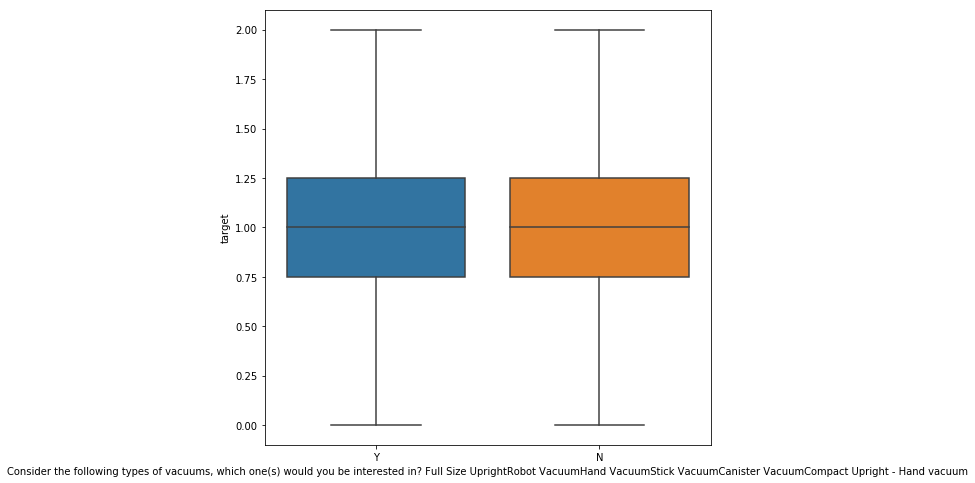

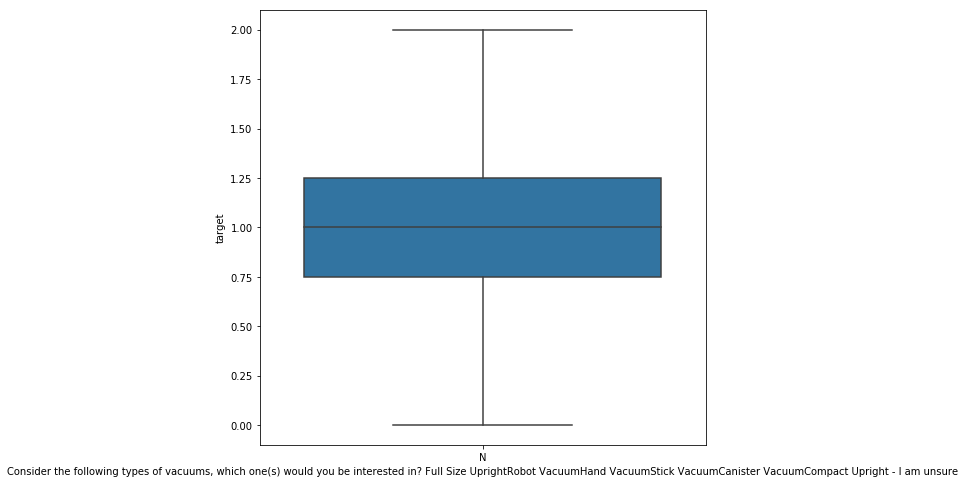

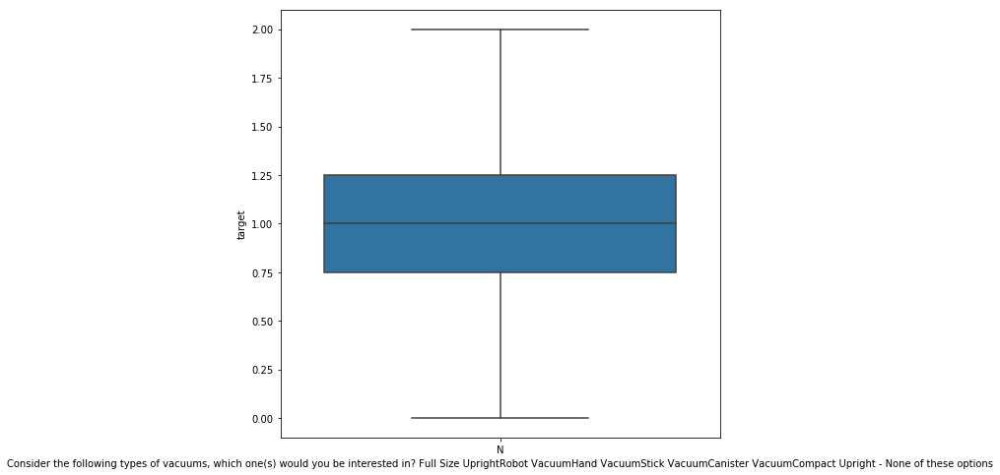

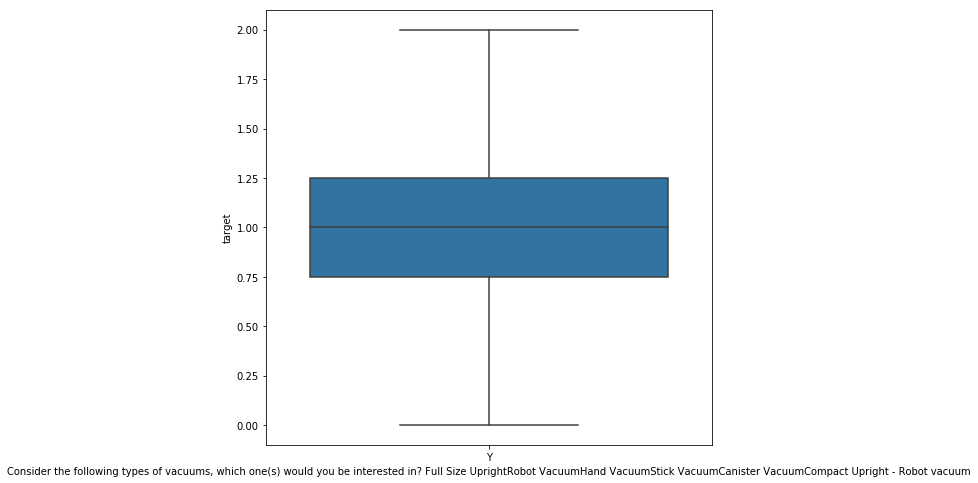

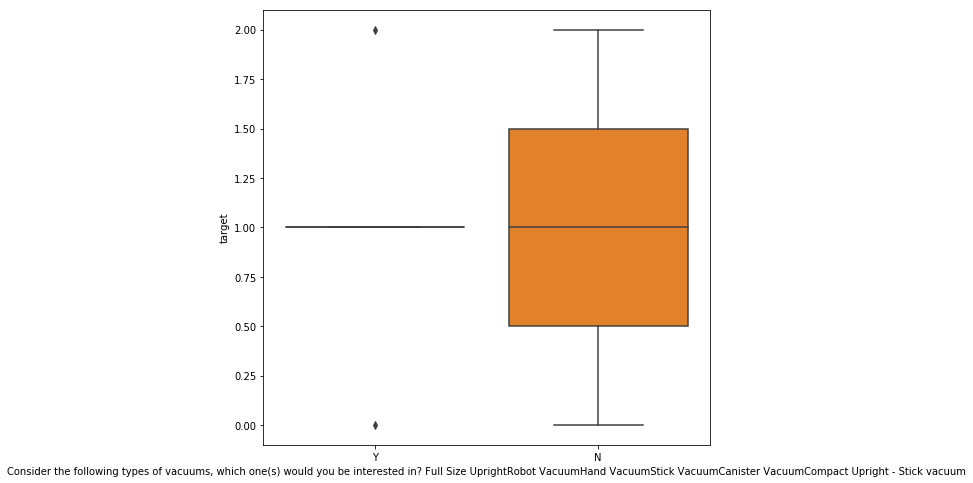

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

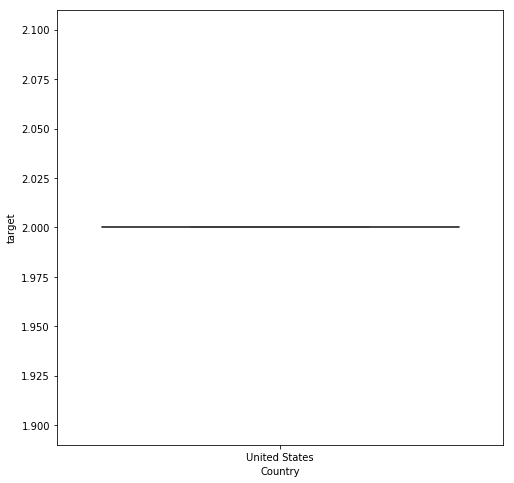

<Figure size 576x576 with 0 Axes>

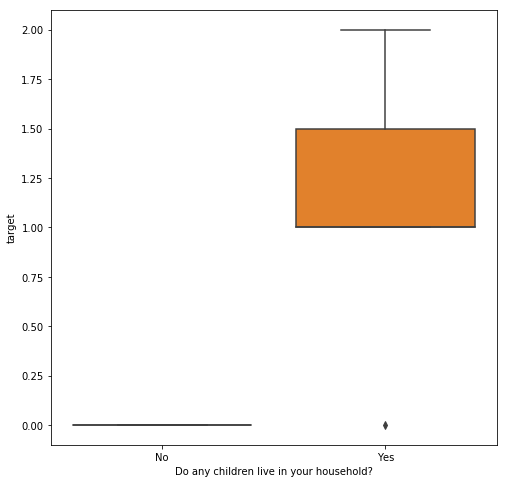

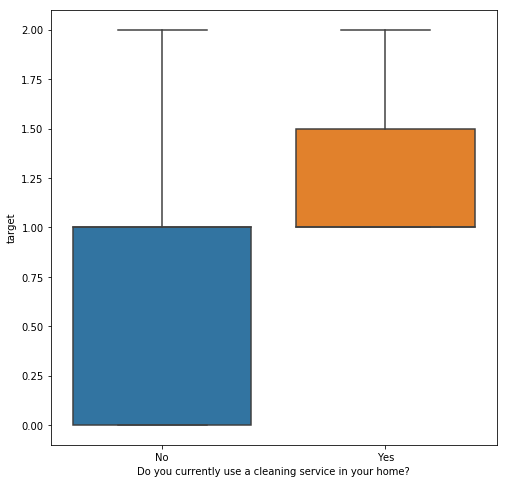

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

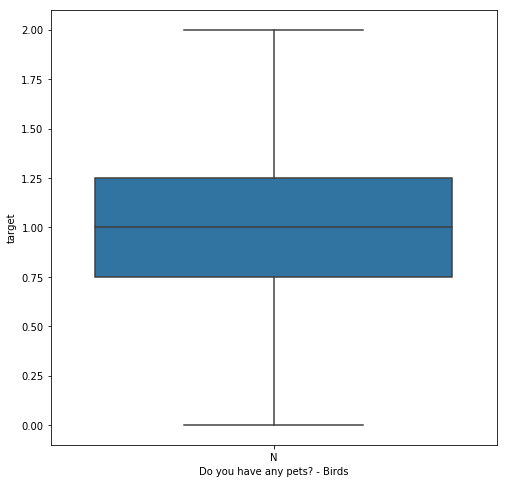

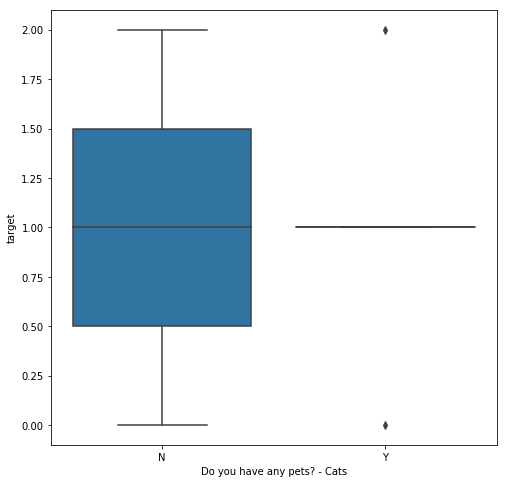

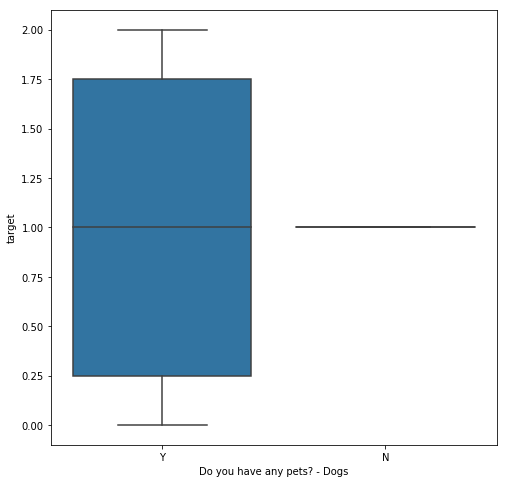

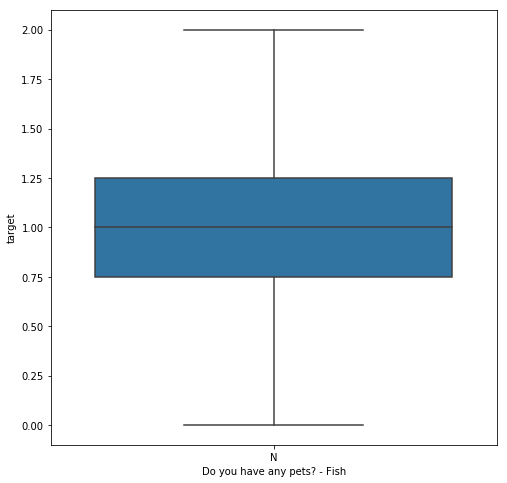

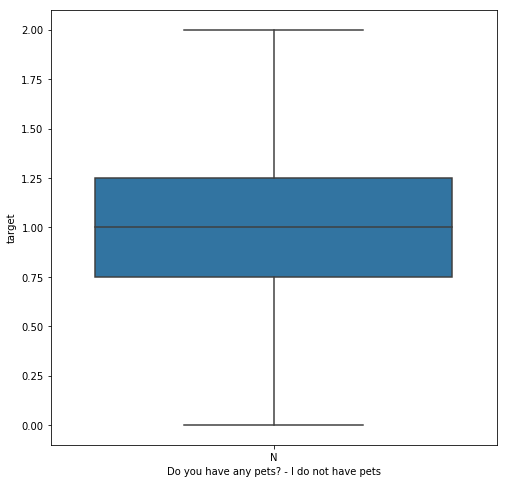

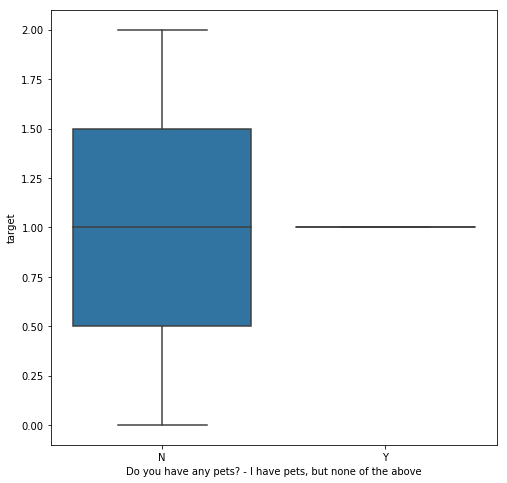

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

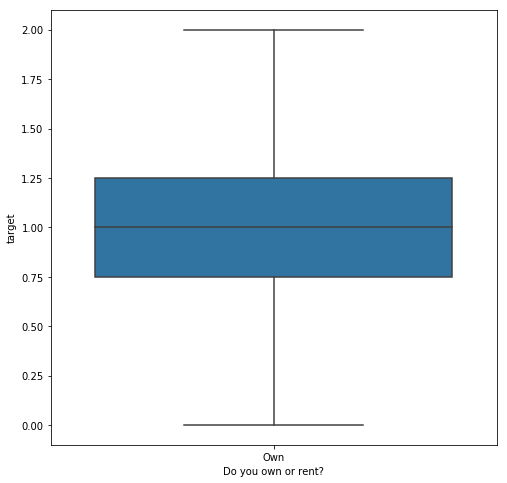

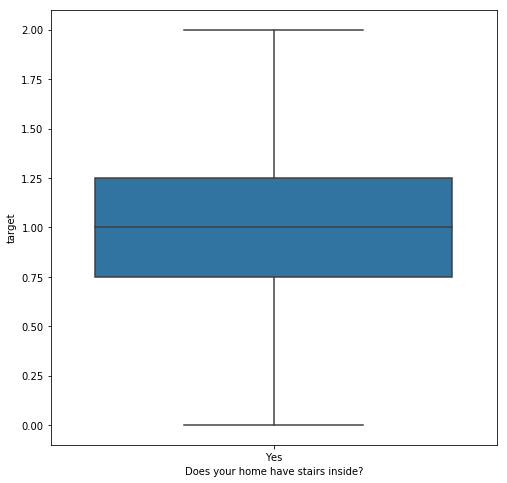

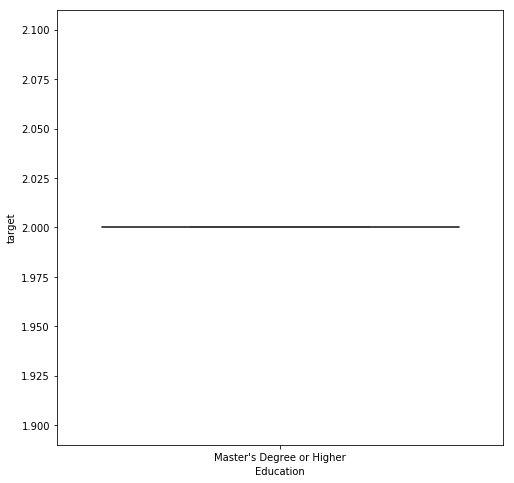

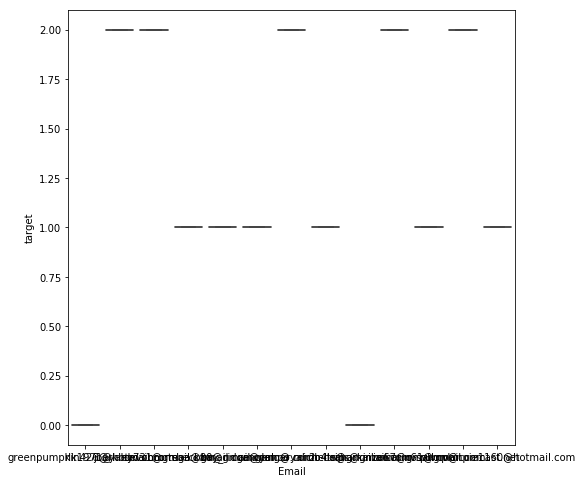

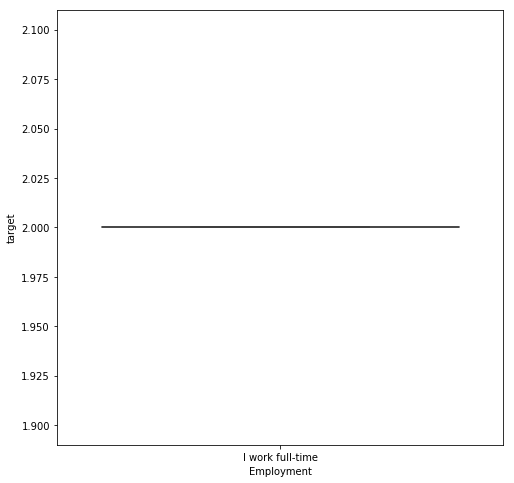

...

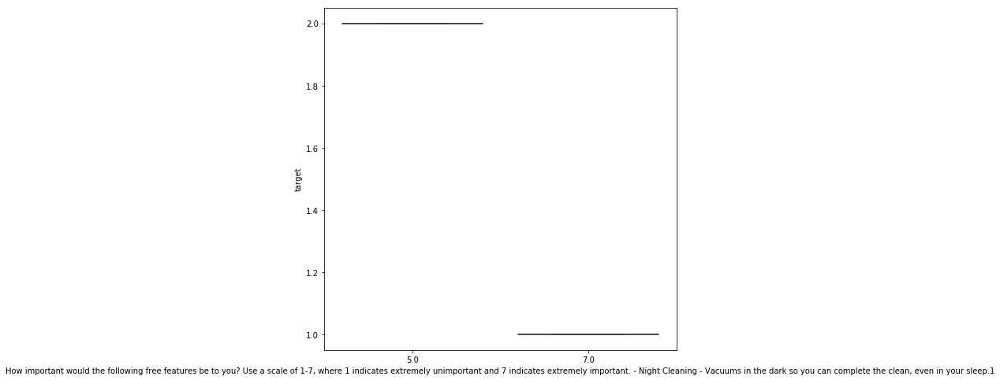

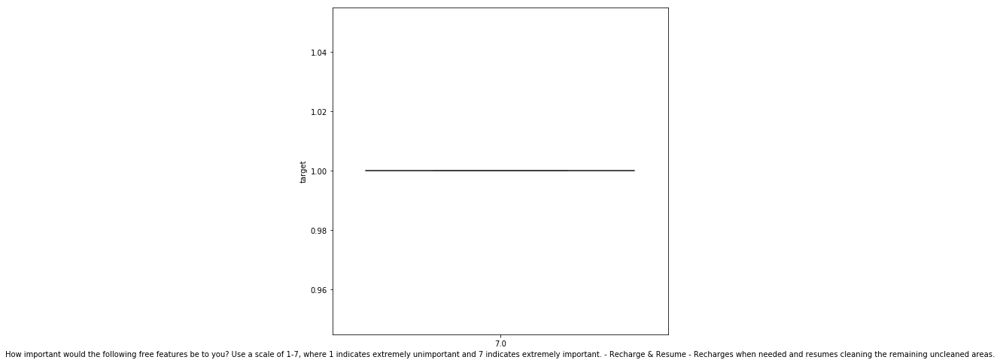

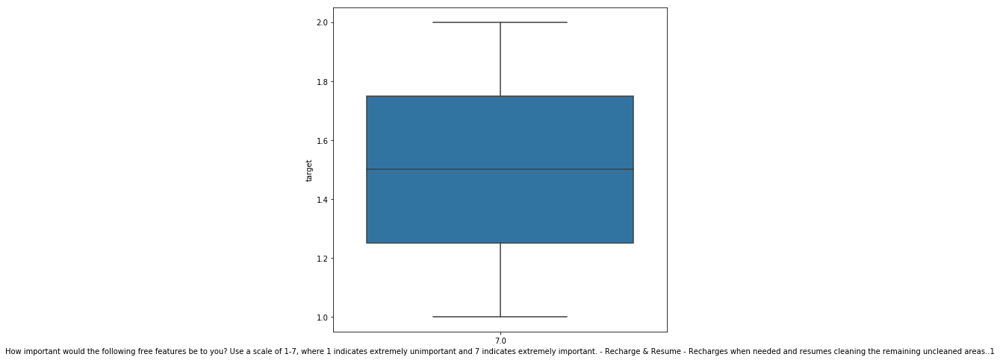

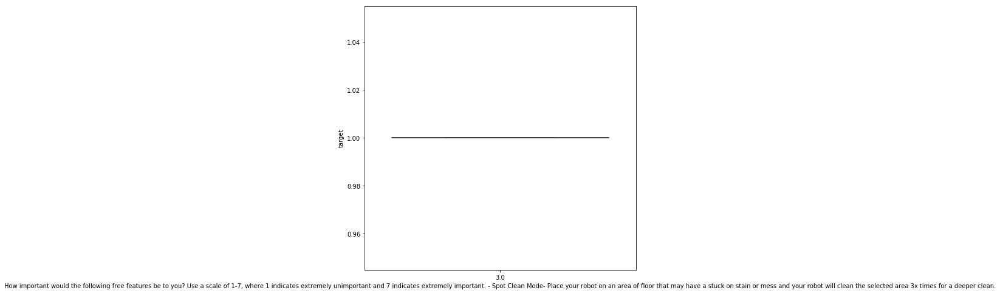

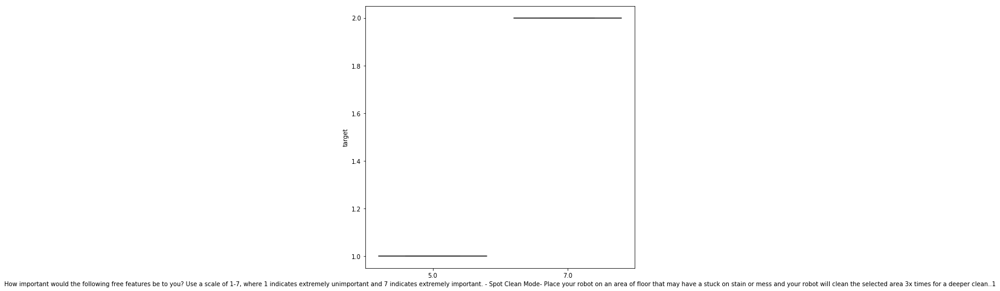

<Figure size 576x576 with 0 Axes>

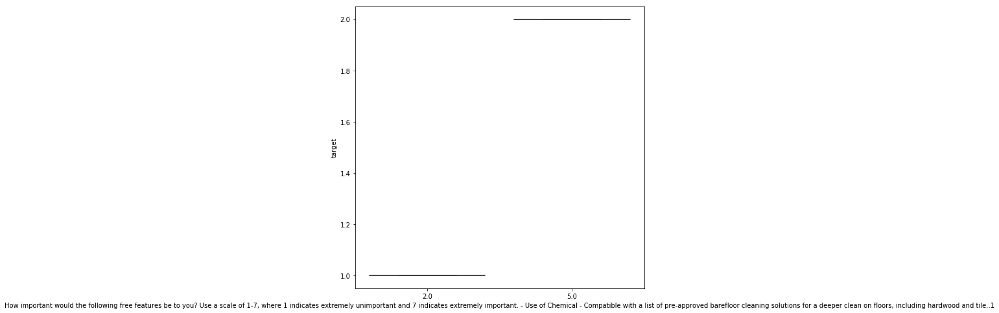

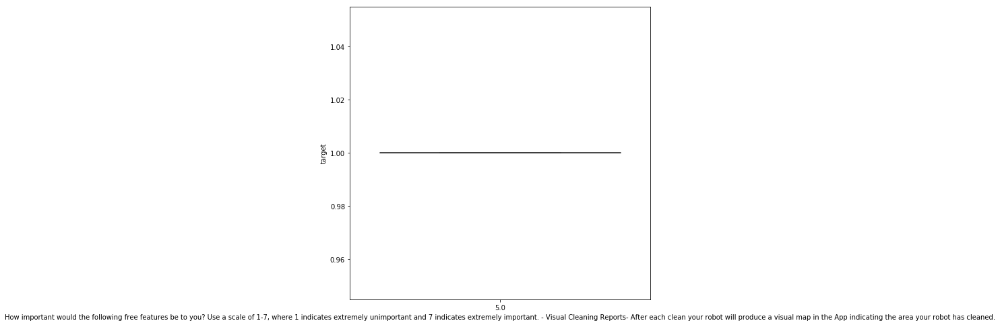

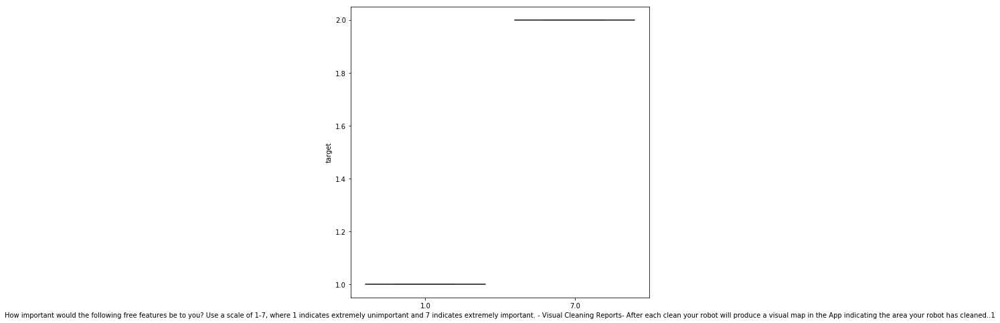

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

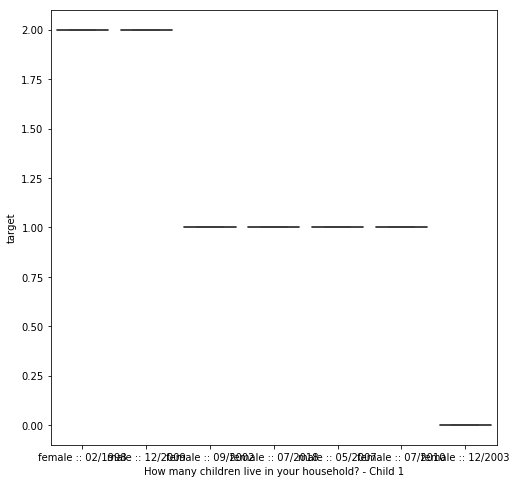

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

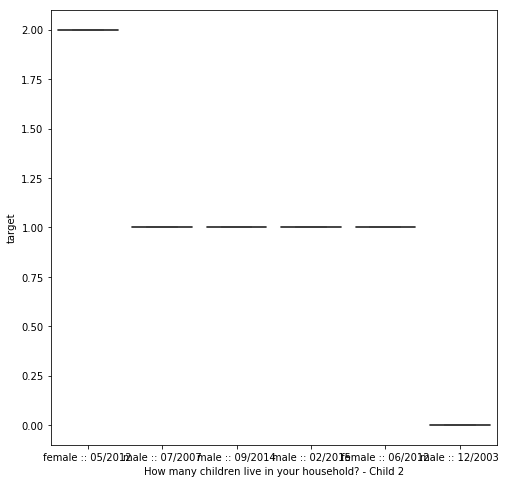

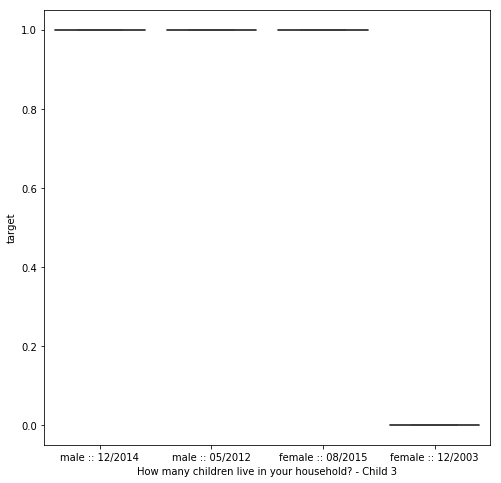

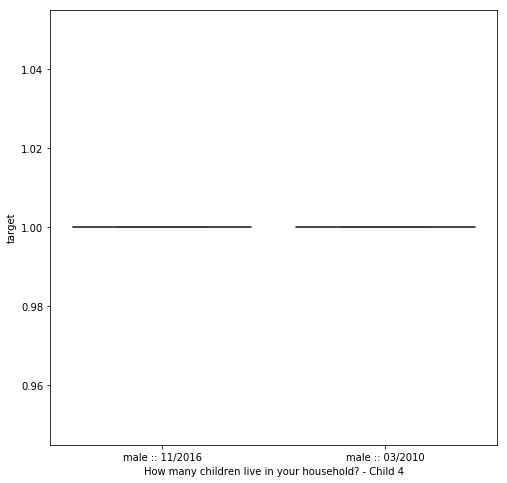

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

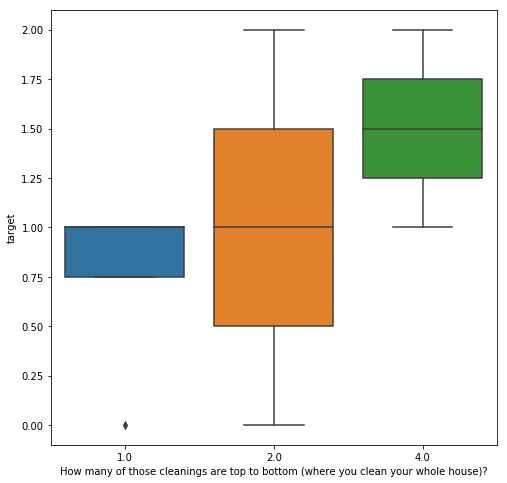

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

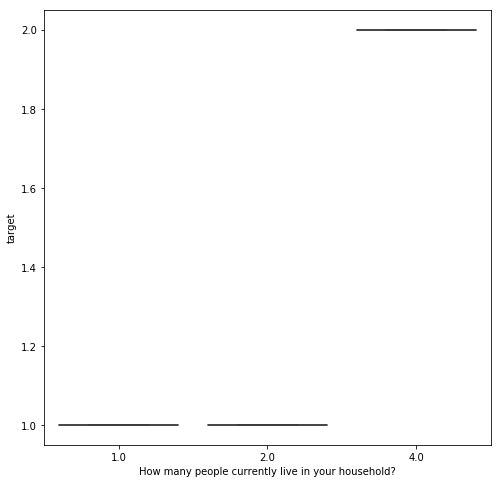

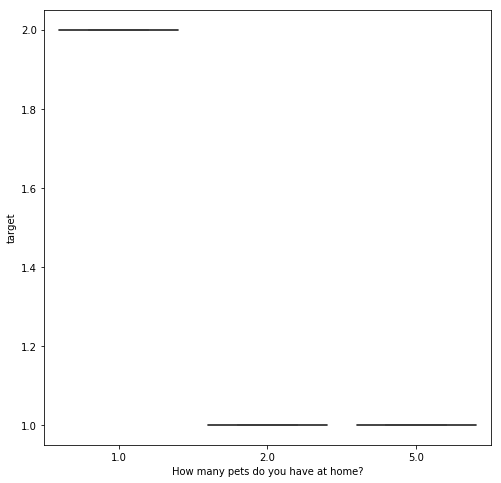

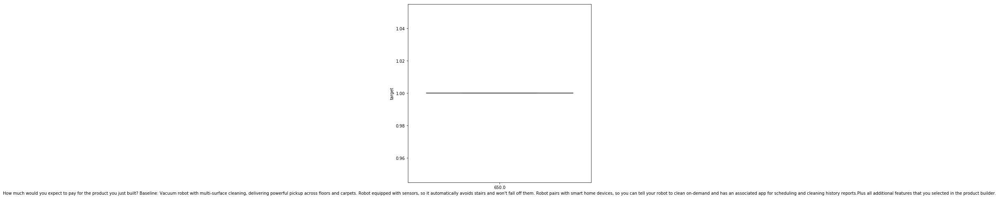

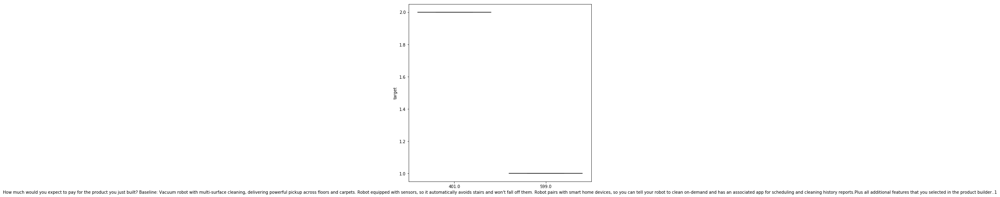

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

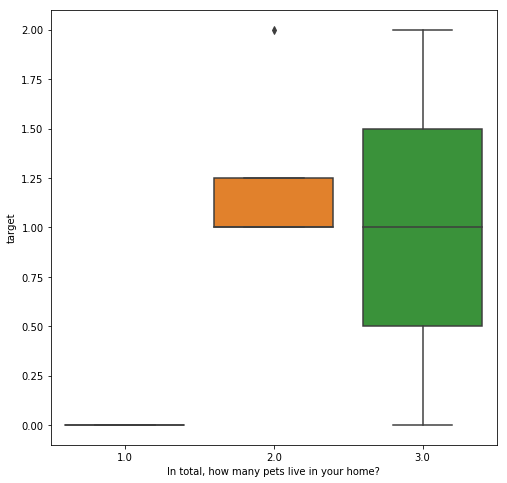

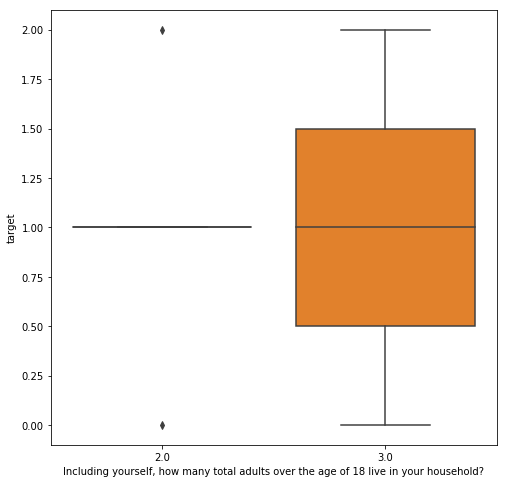

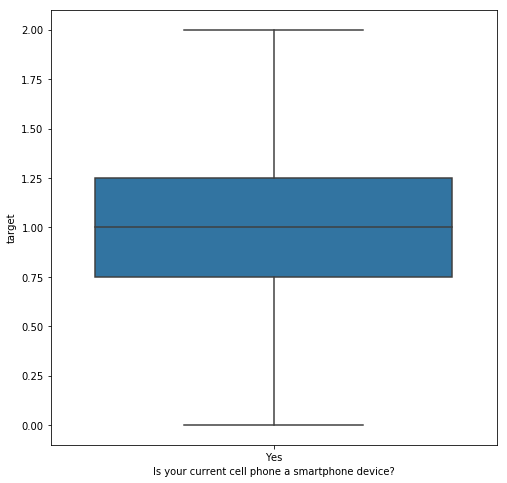

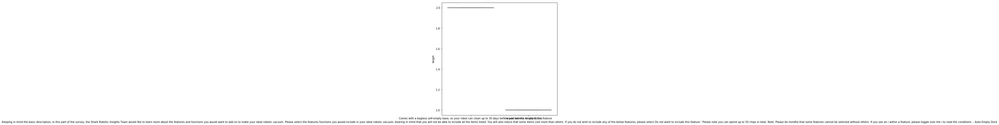

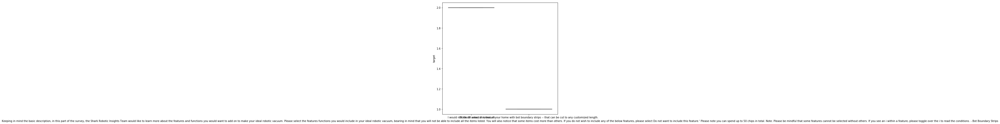

...

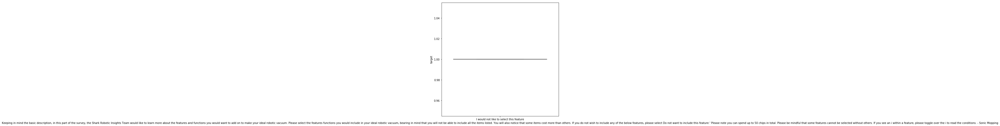

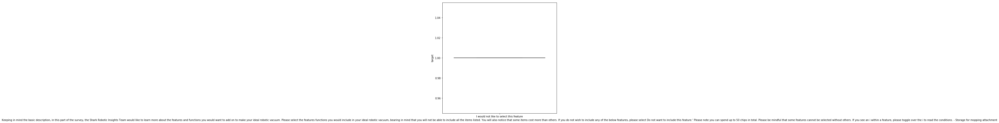

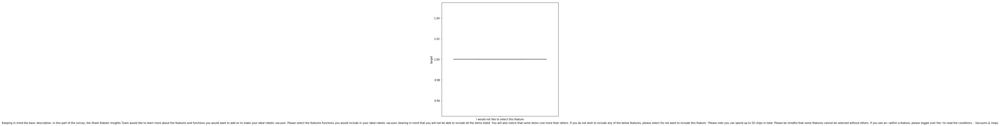

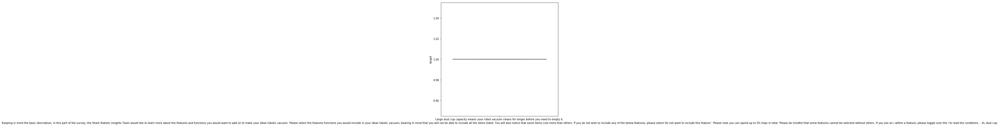

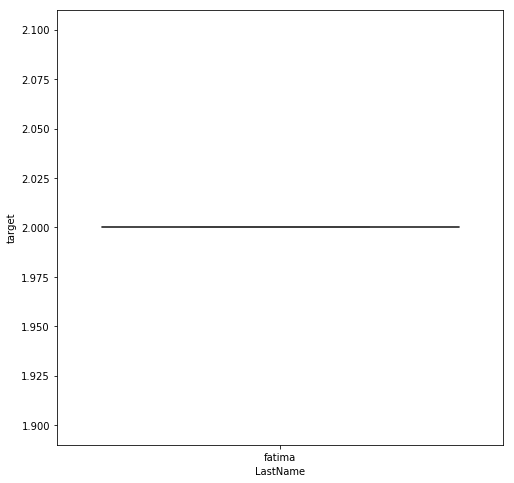

<Figure size 576x576 with 0 Axes>

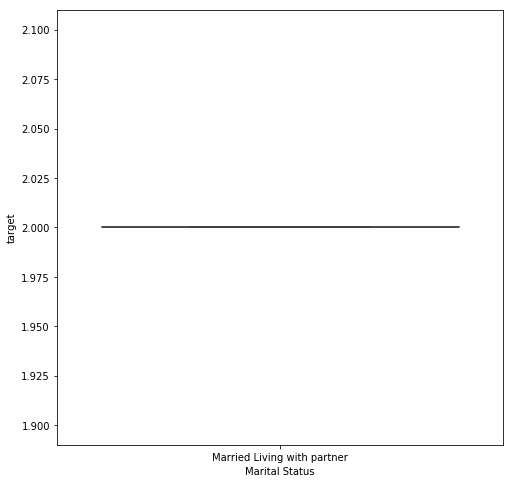

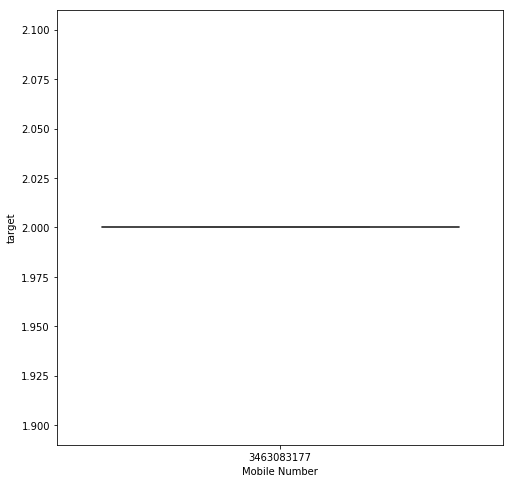

<Figure size 576x576 with 0 Axes>

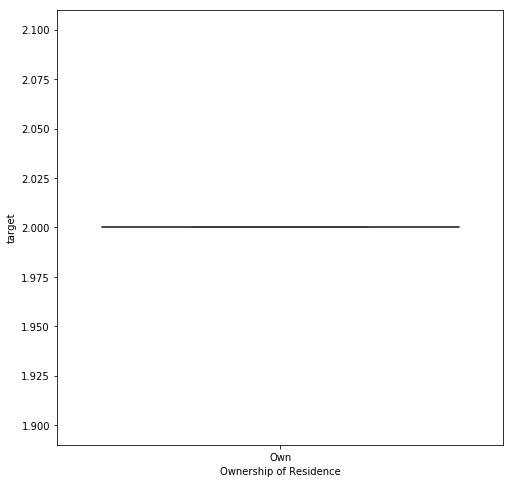

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

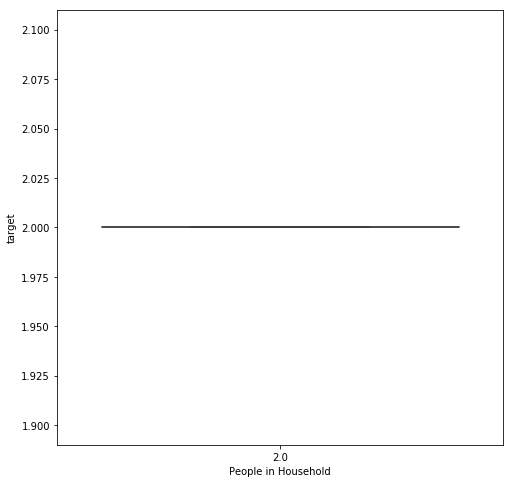

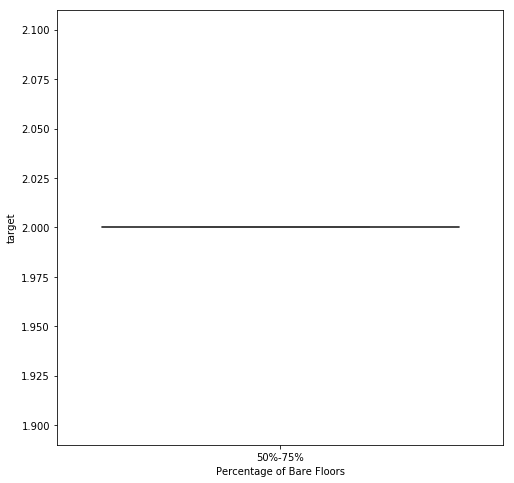

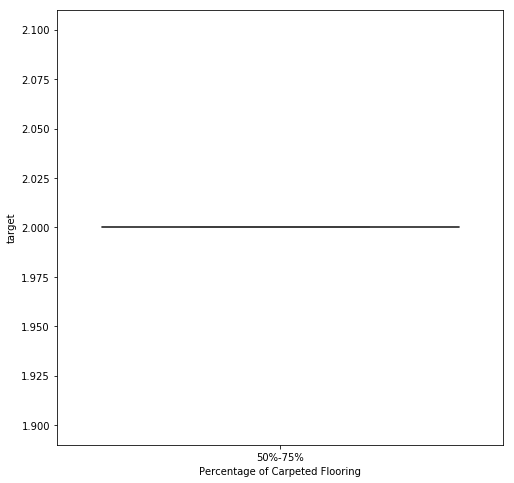

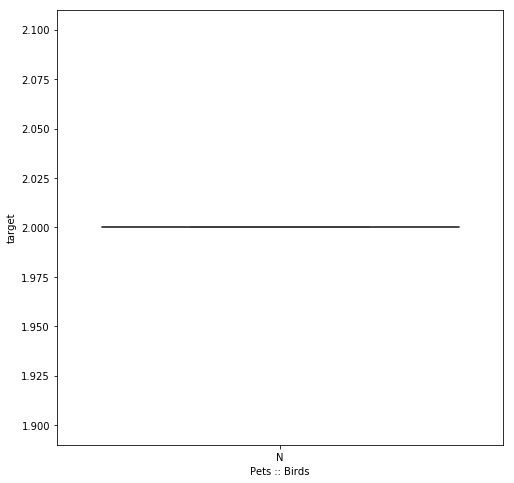

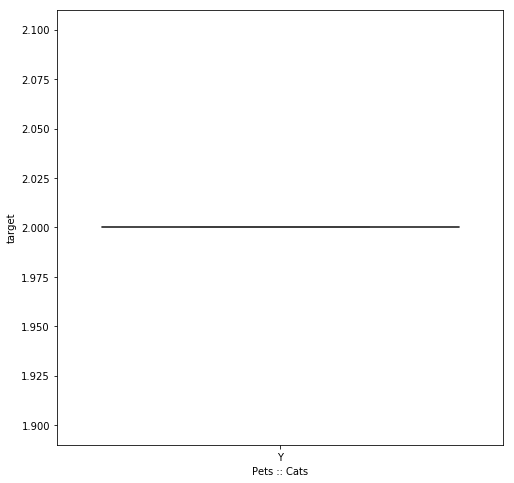

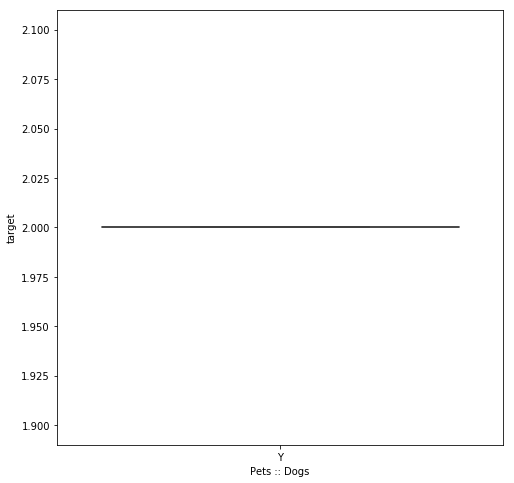

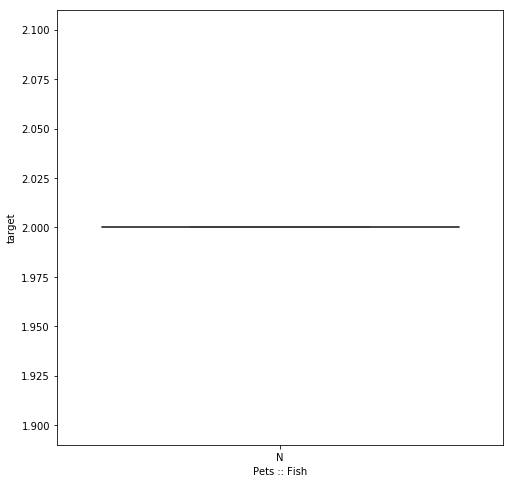

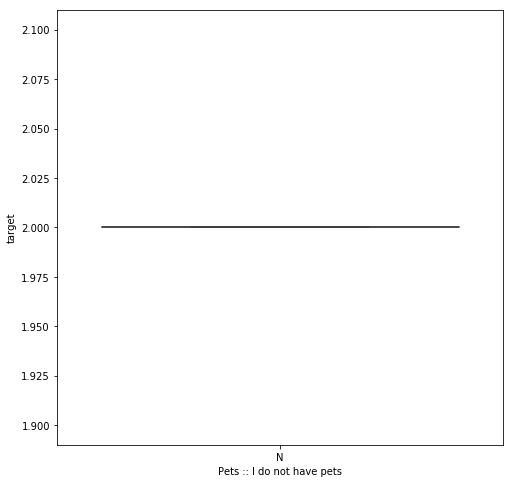

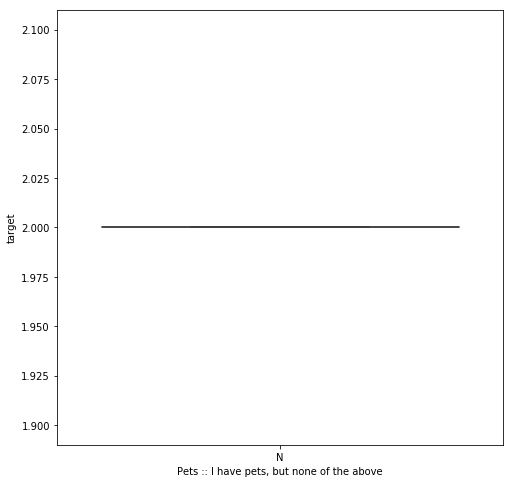

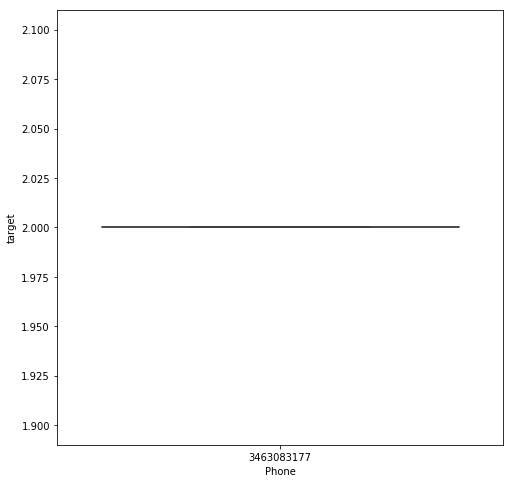

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

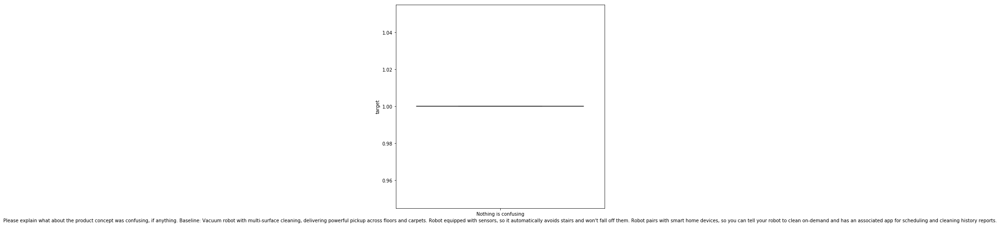

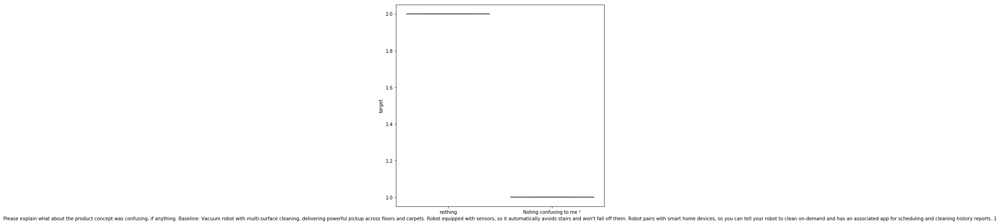

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

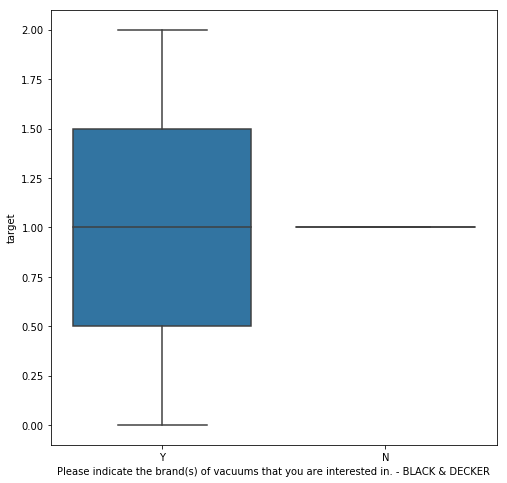

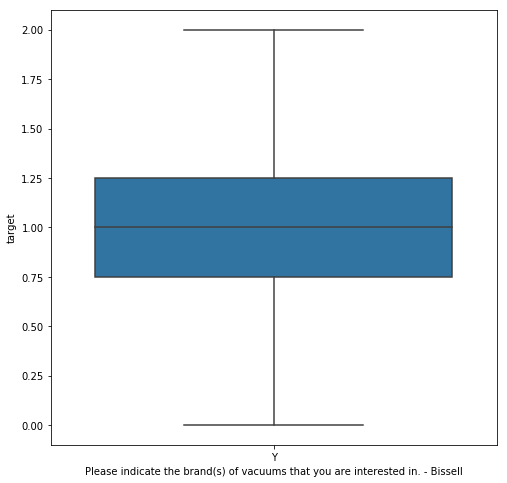

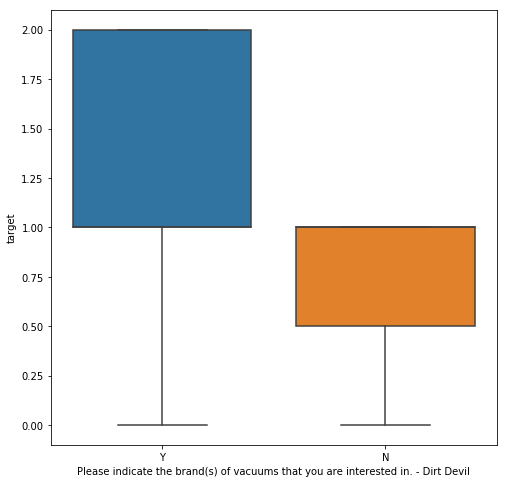

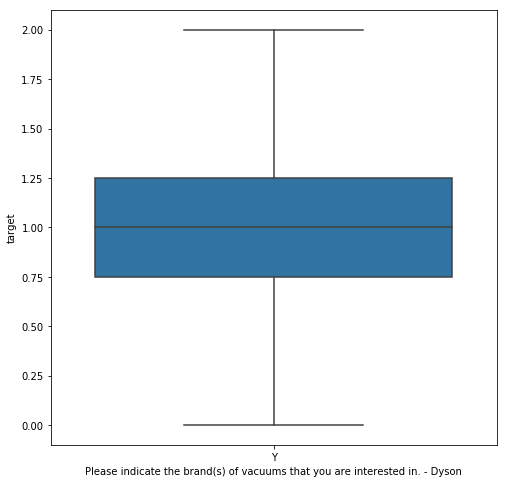

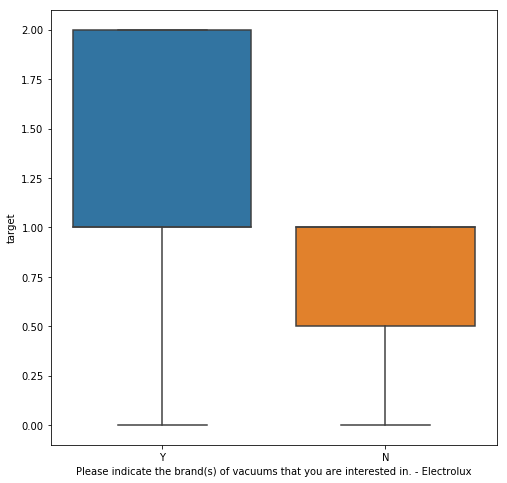

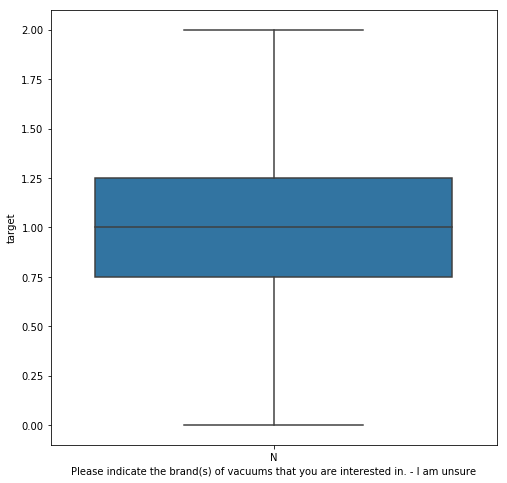

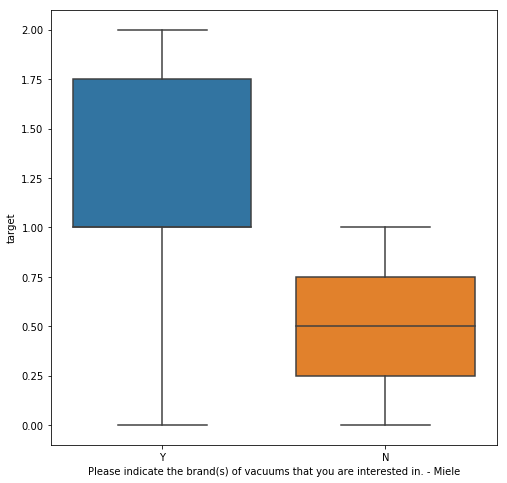

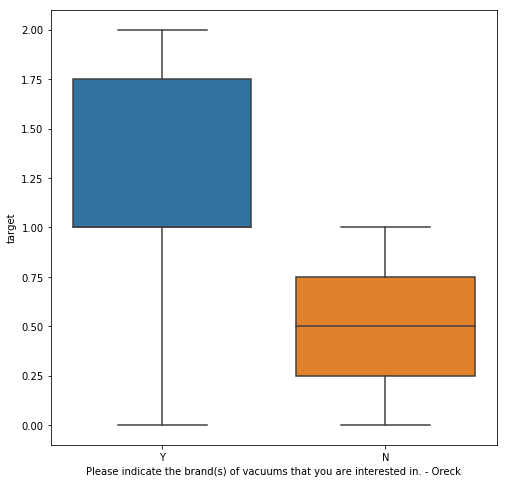

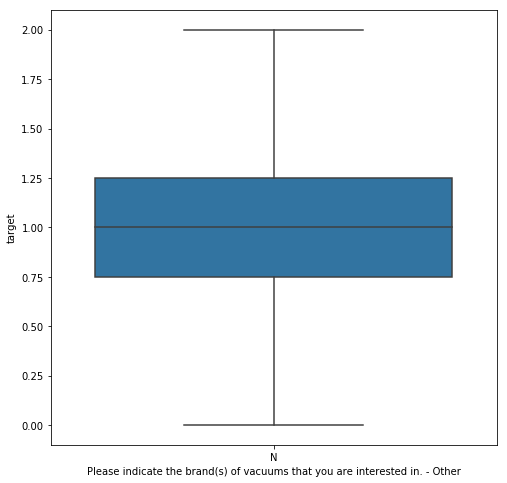

<Figure size 576x576 with 0 Axes>

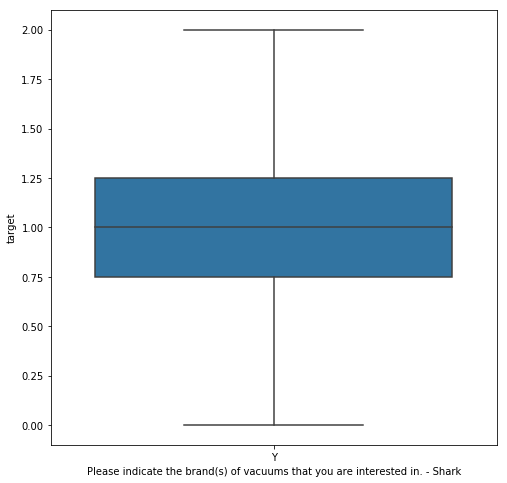

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

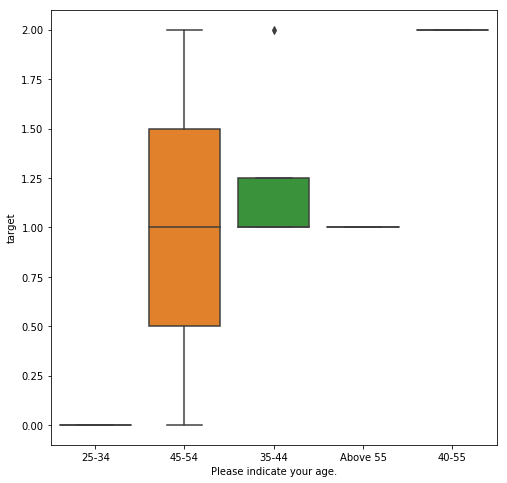

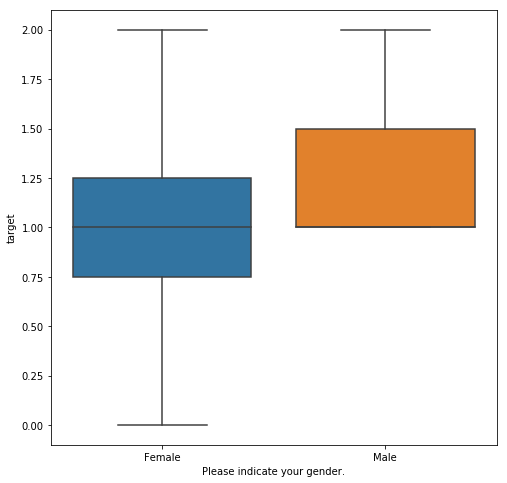

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

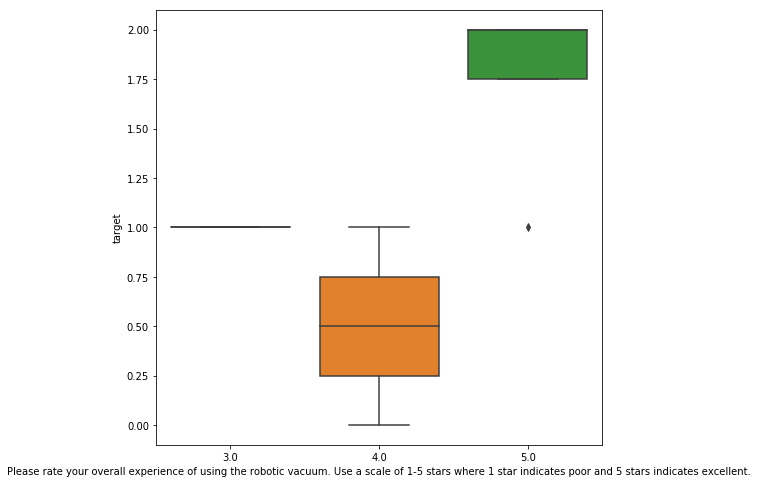

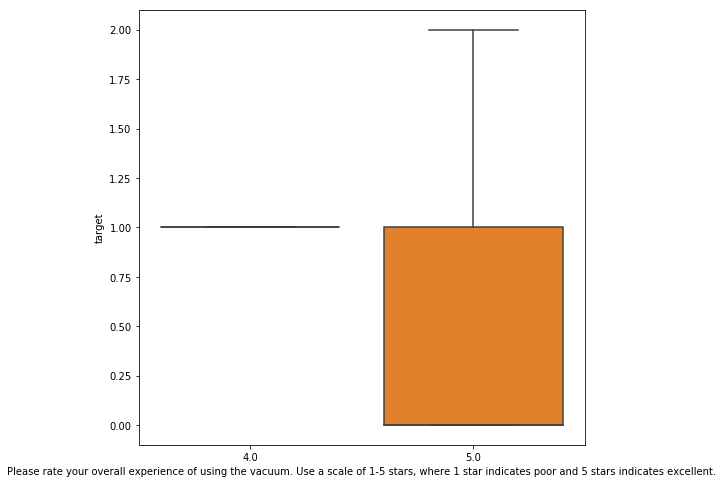

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

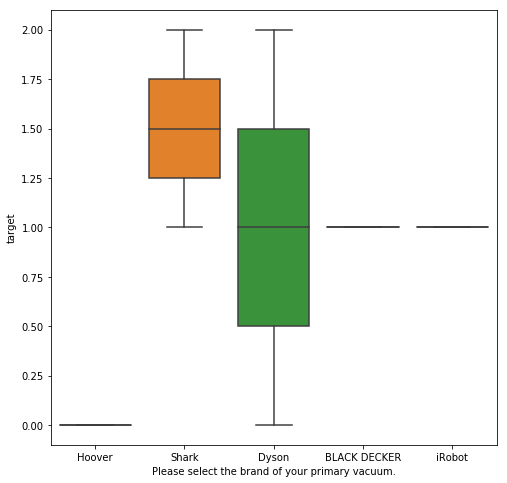

<Figure size 576x576 with 0 Axes>

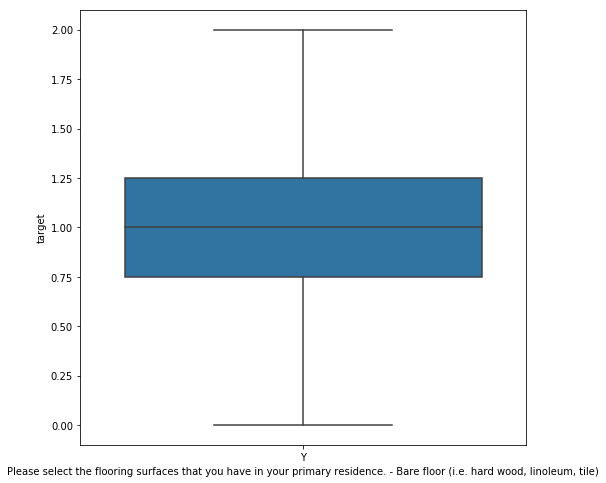

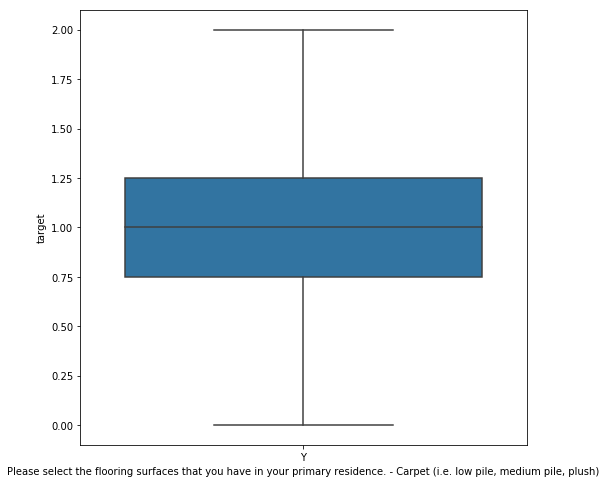

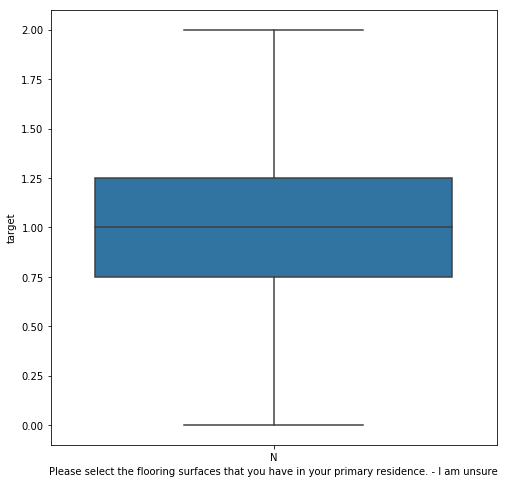

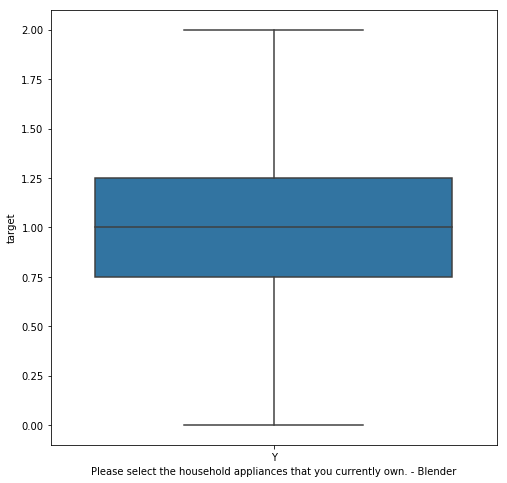

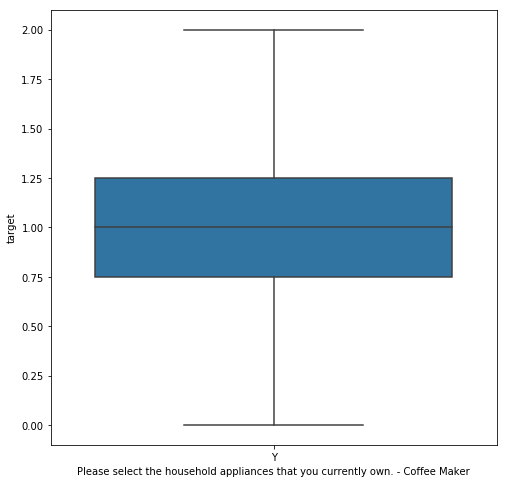

...

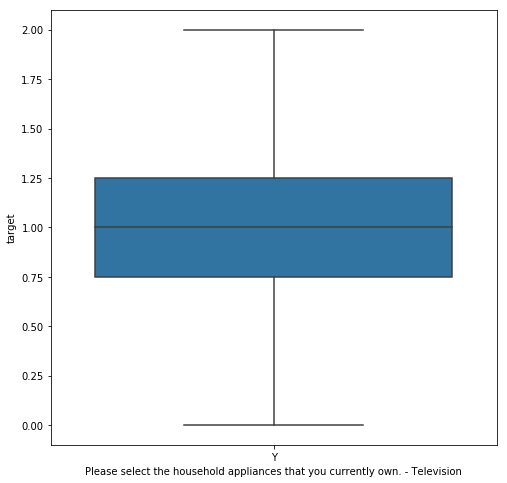

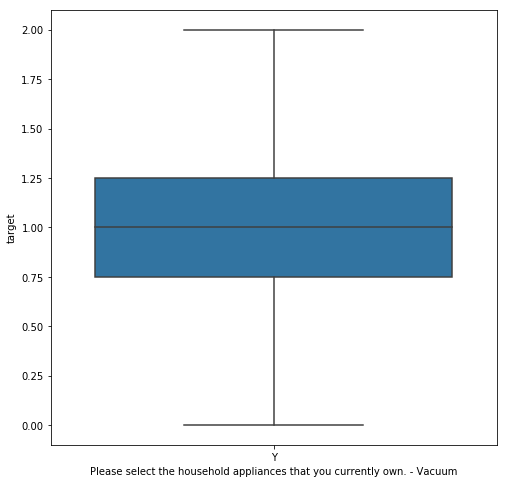

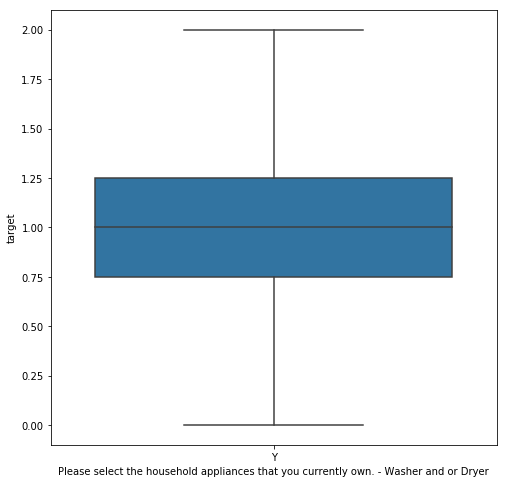

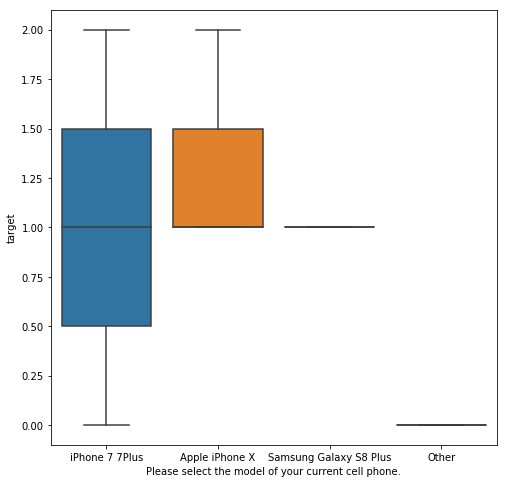

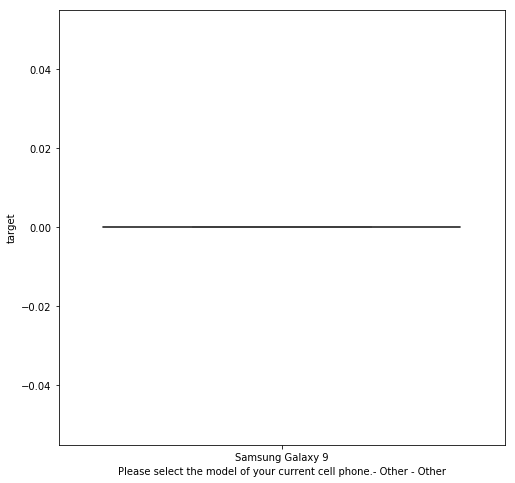

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

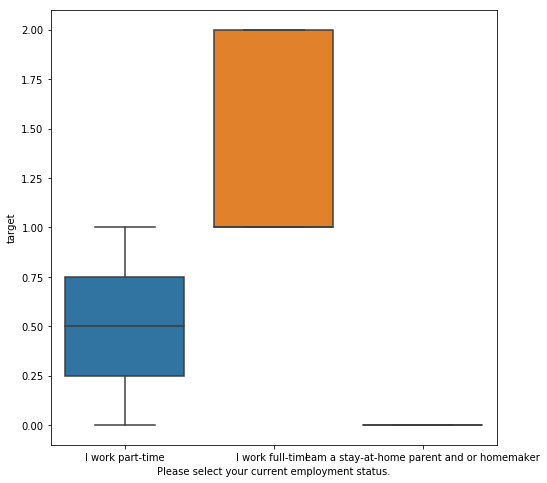

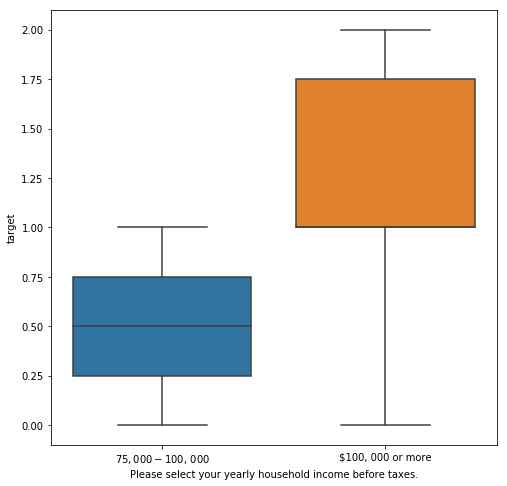

<Figure size 576x576 with 0 Axes>

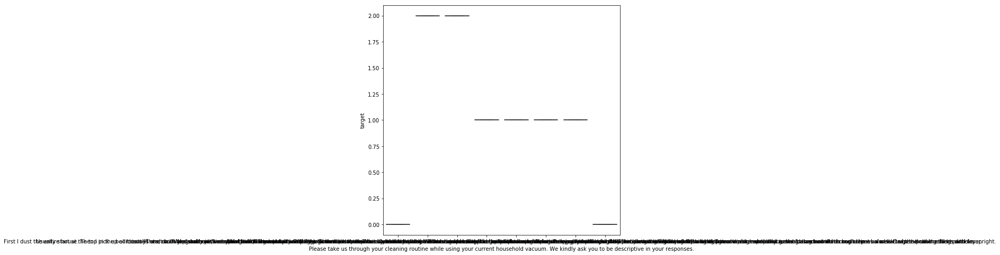

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

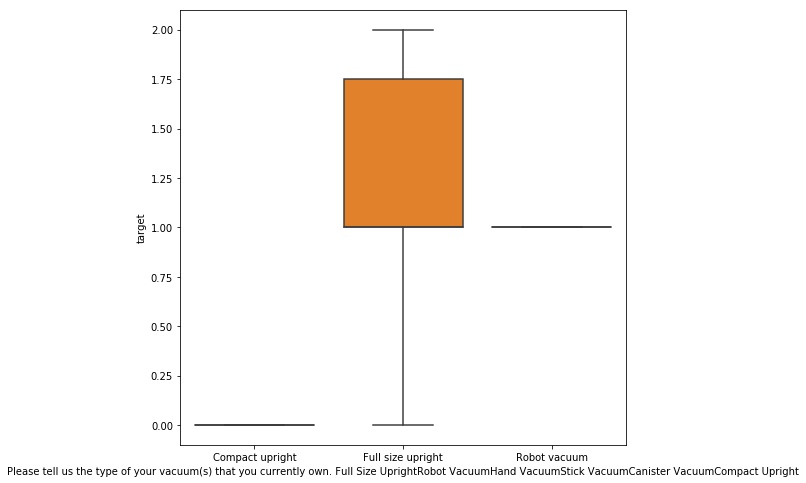

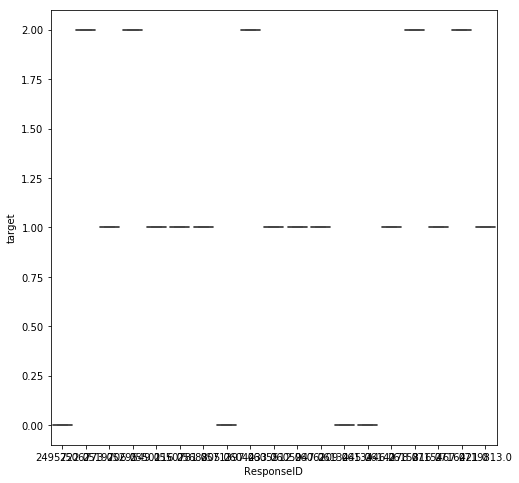

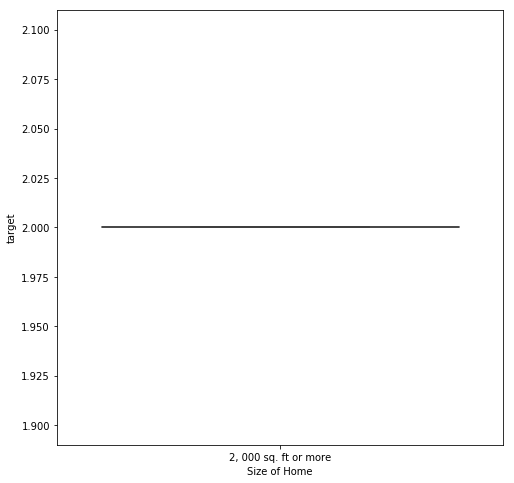

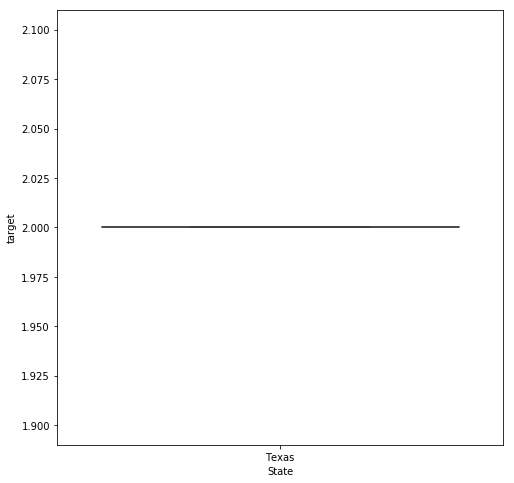

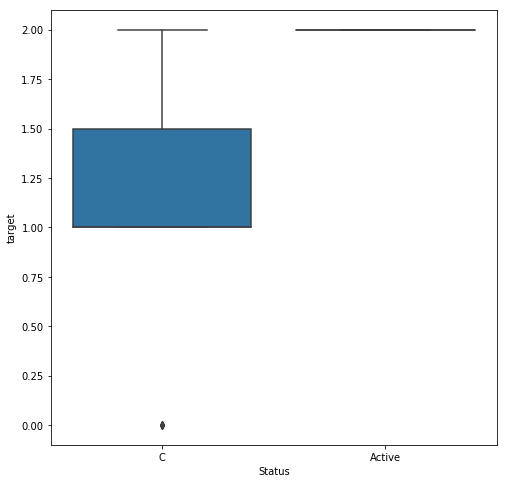

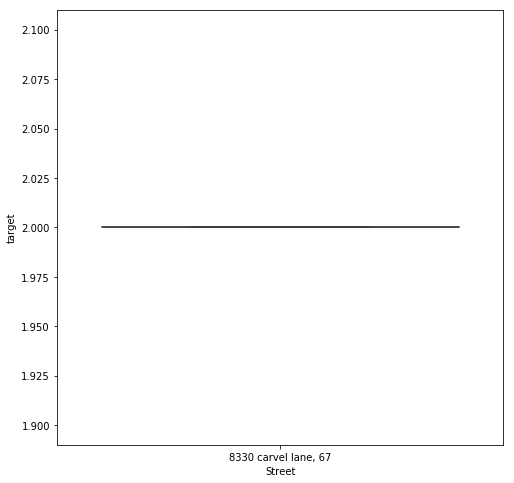

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

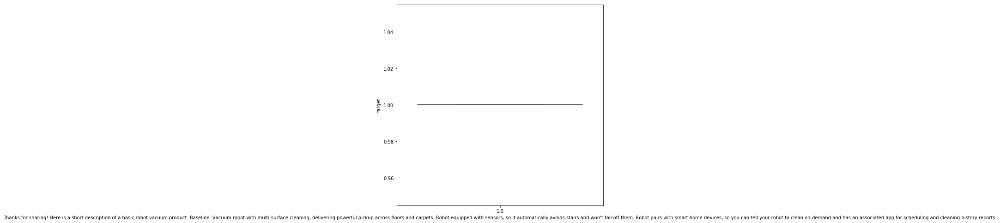

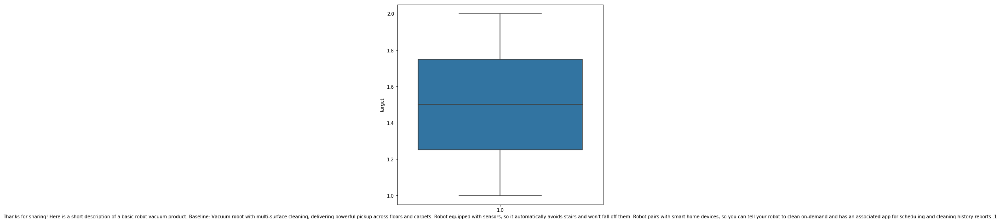

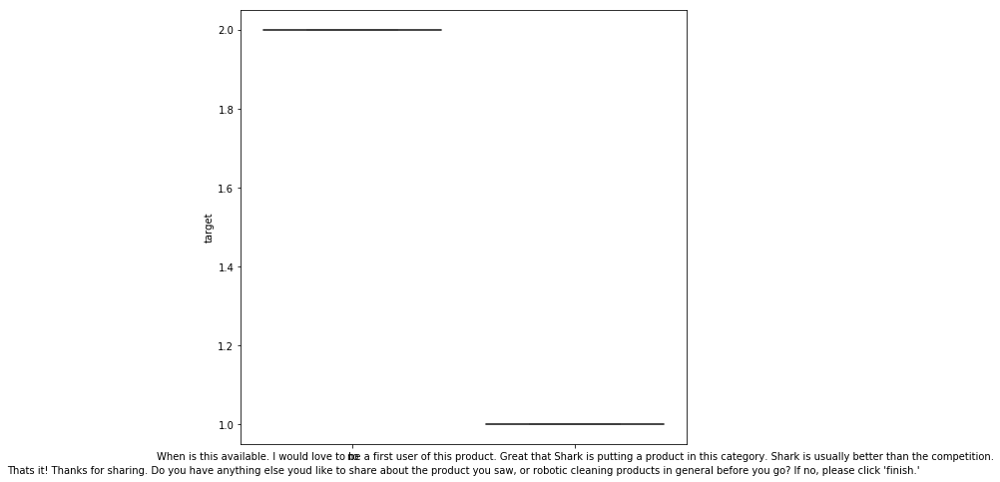

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

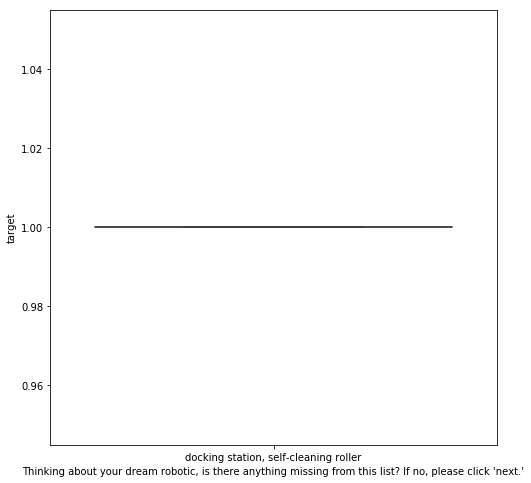

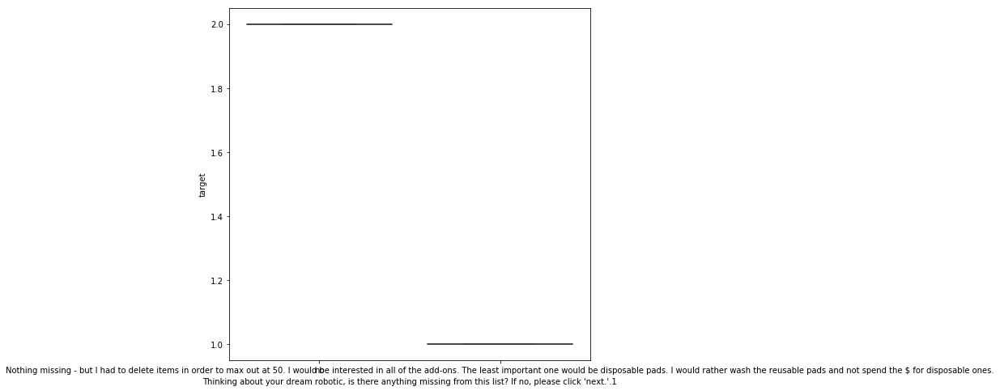

<Figure size 576x576 with 0 Axes>

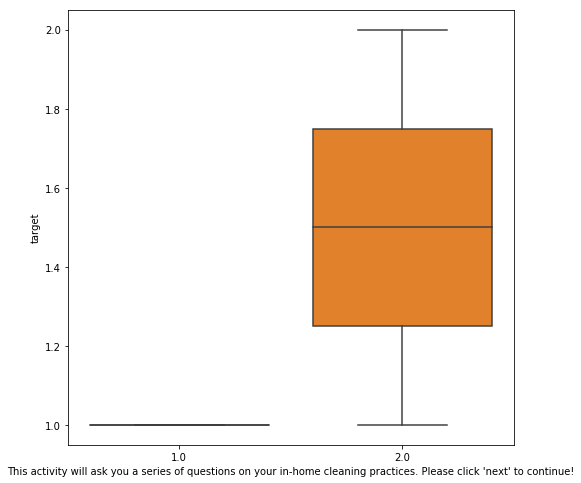

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

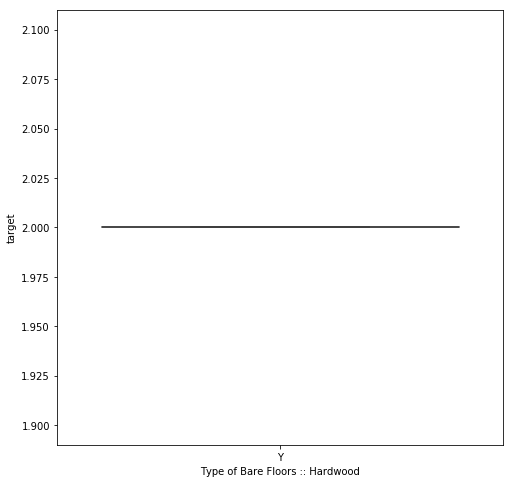

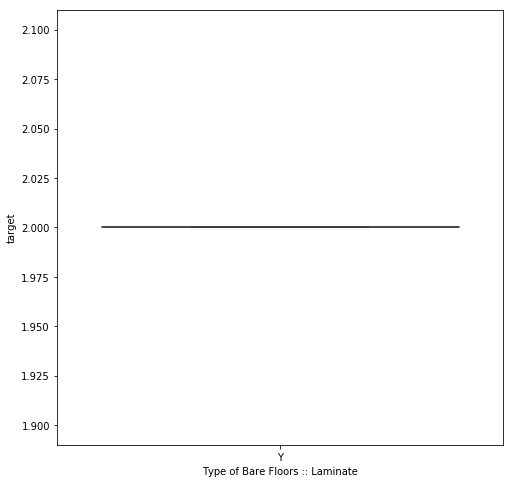

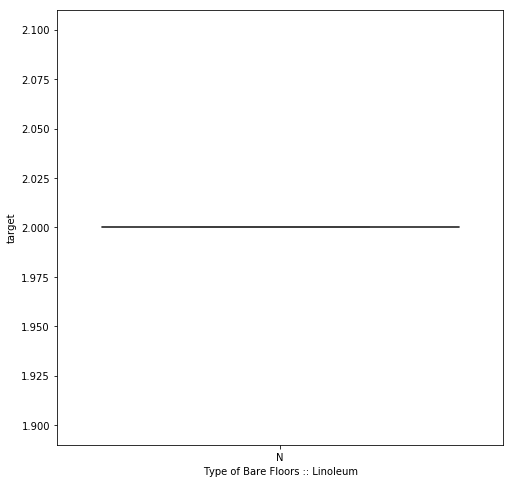

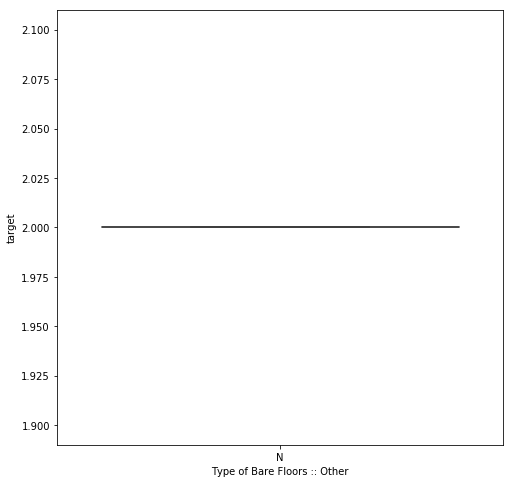

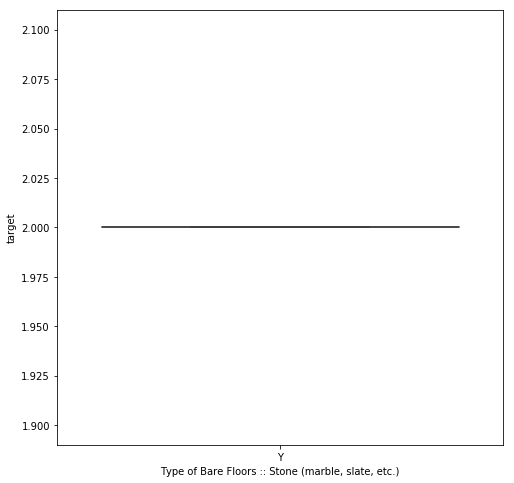

...

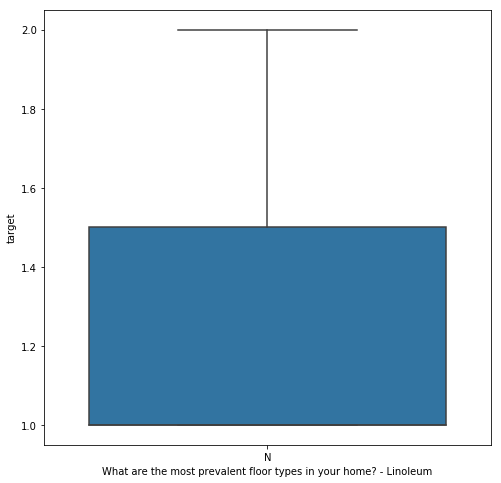

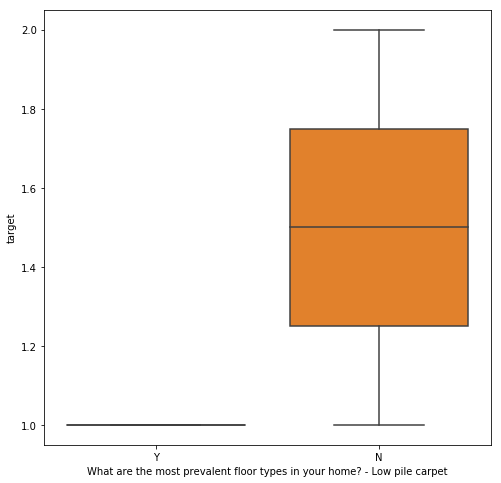

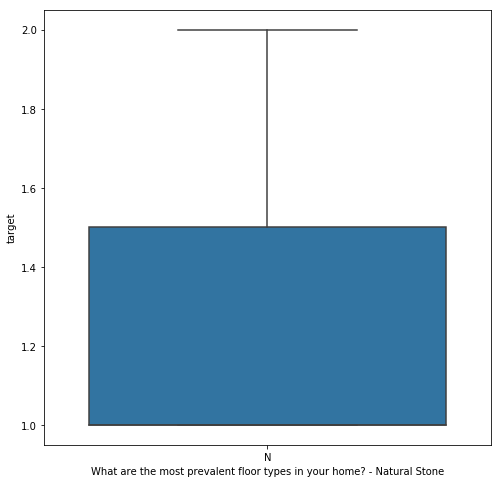

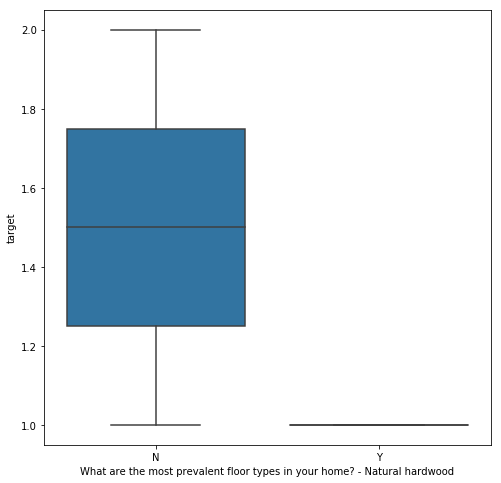

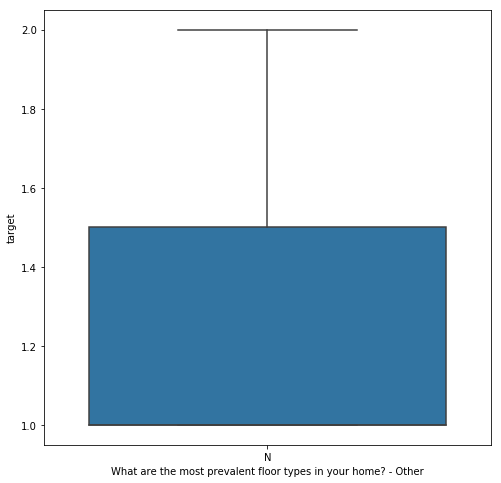

<Figure size 576x576 with 0 Axes>

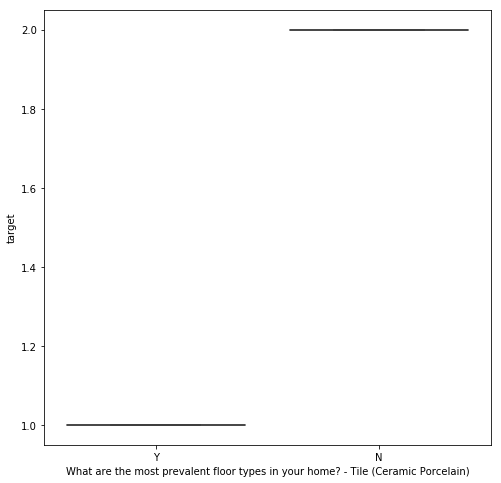

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

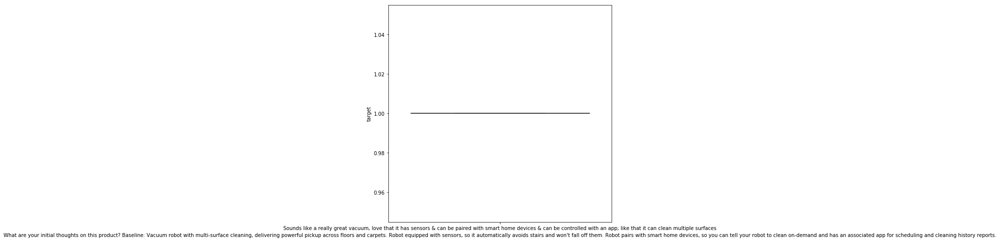

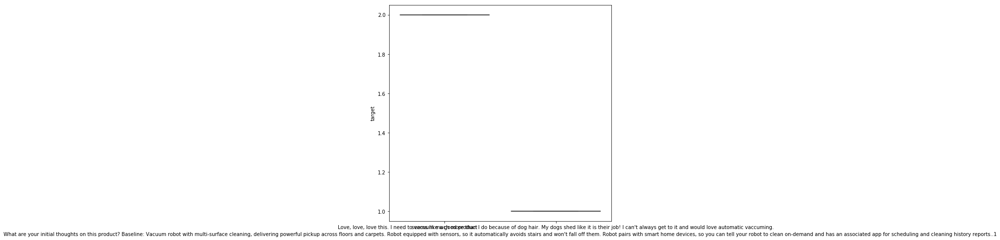

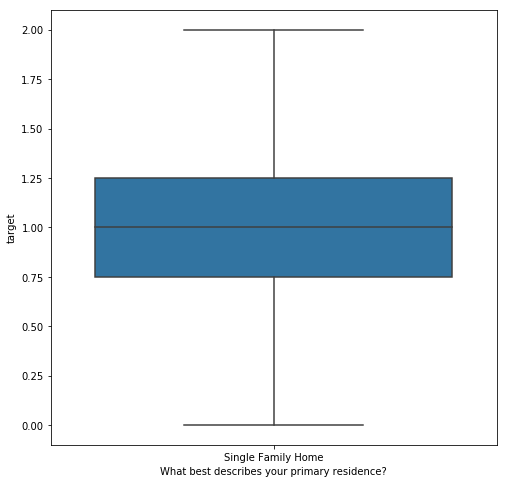

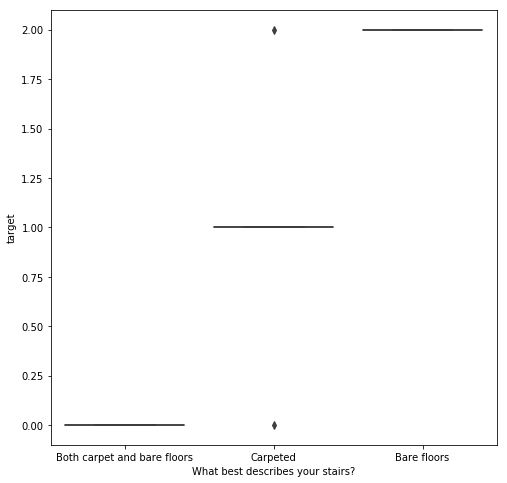

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

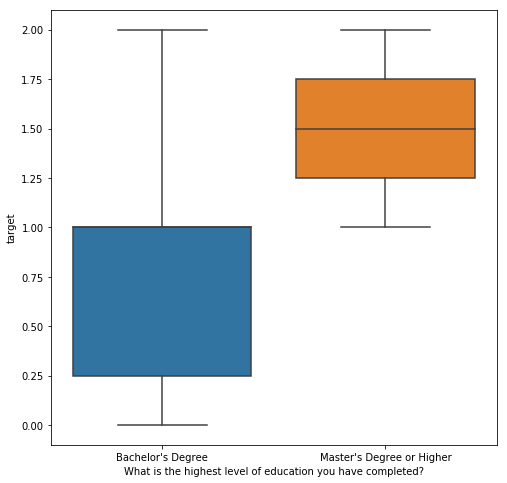

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

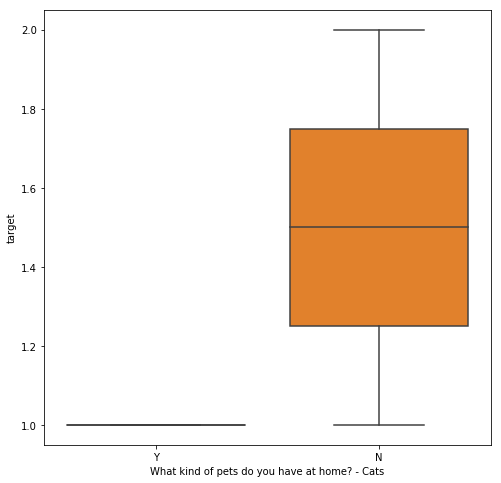

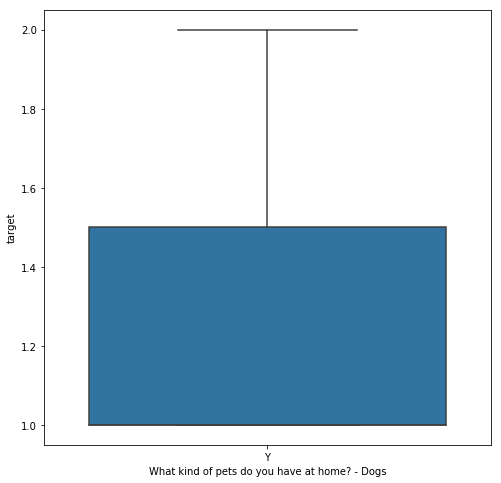

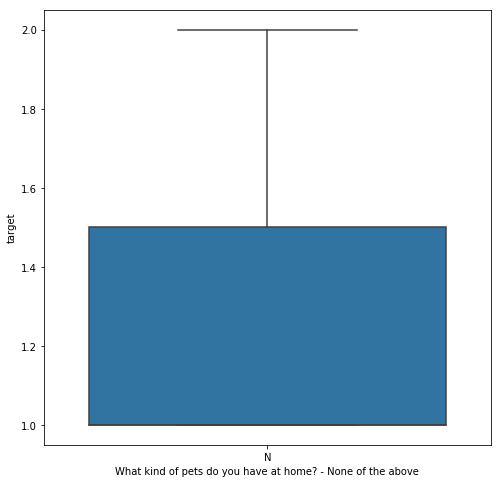

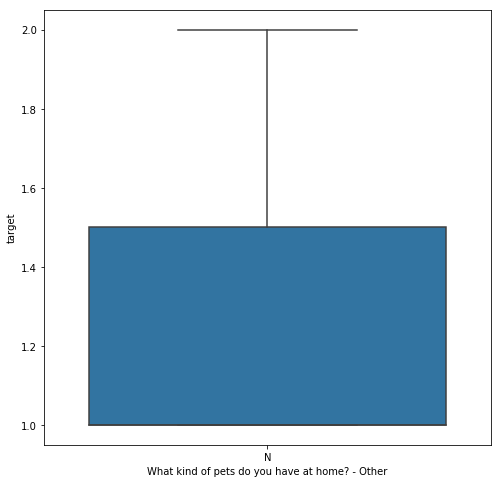

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

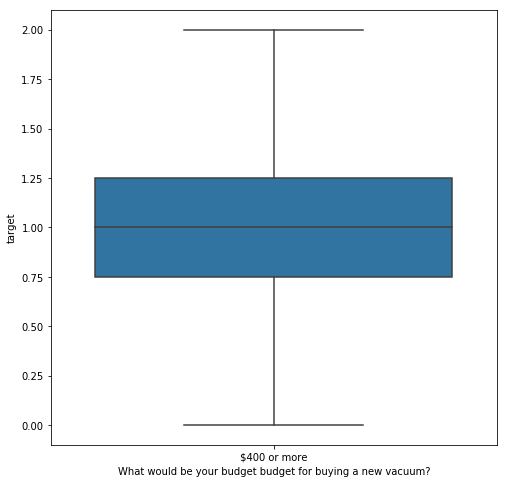

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

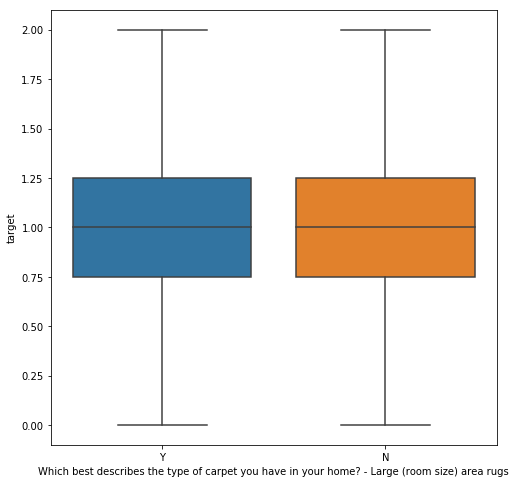

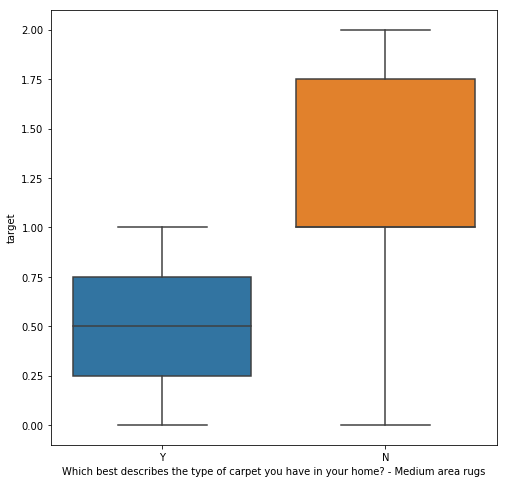

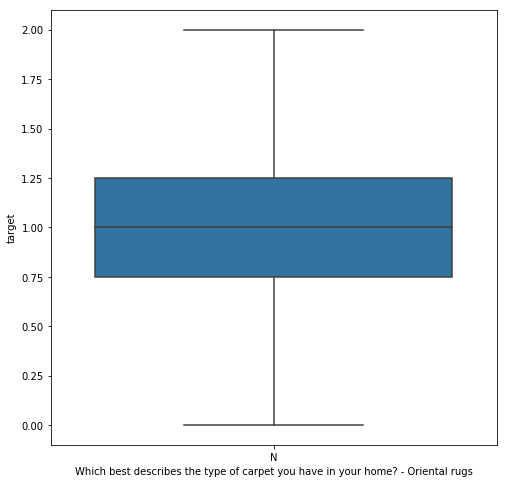

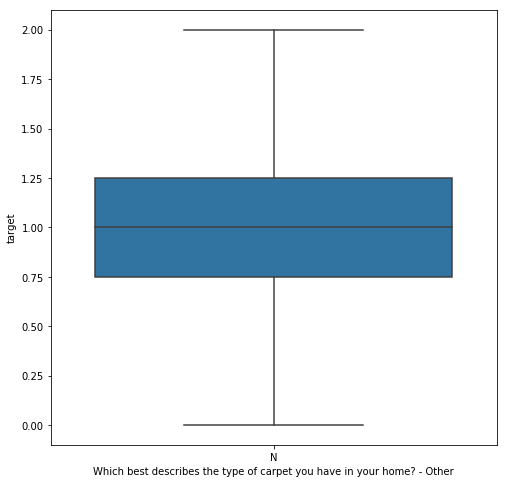

<Figure size 576x576 with 0 Axes>

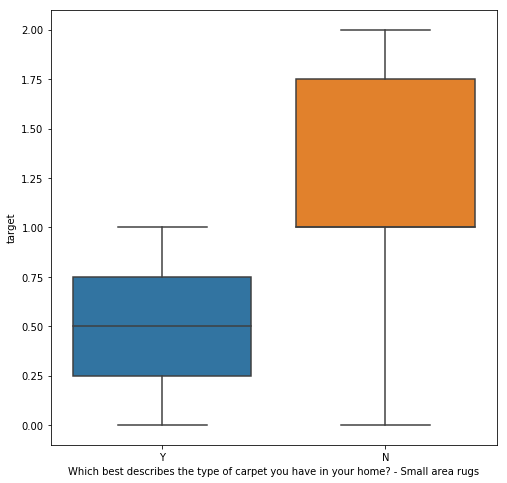

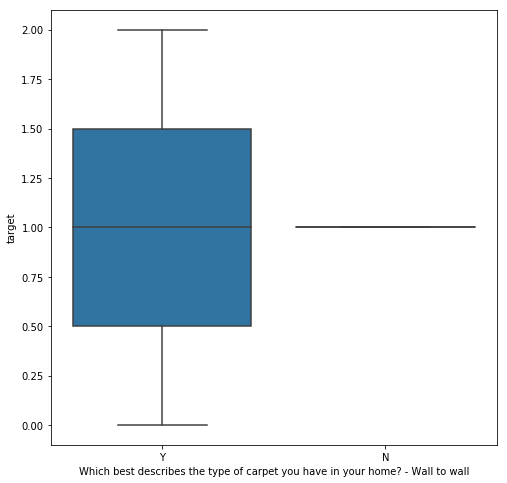

<Figure size 576x576 with 0 Axes>

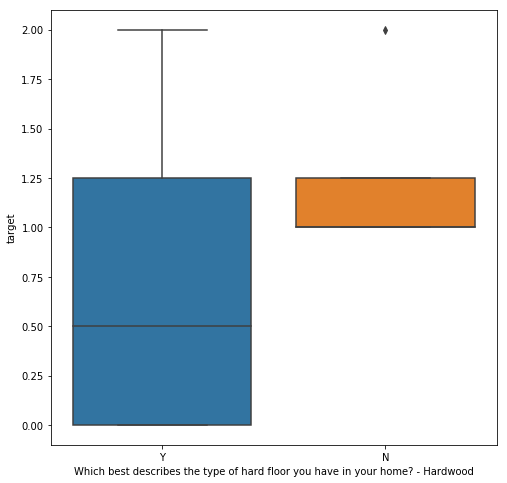

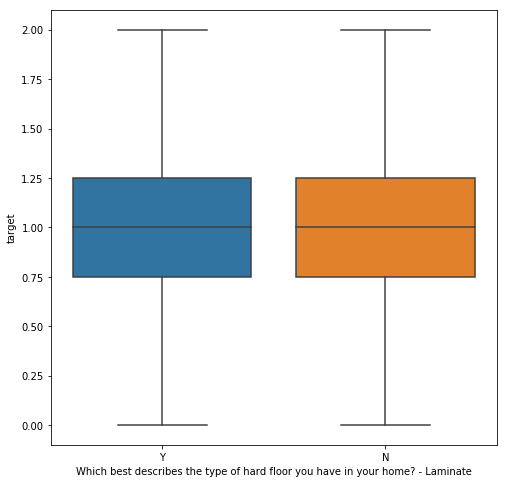

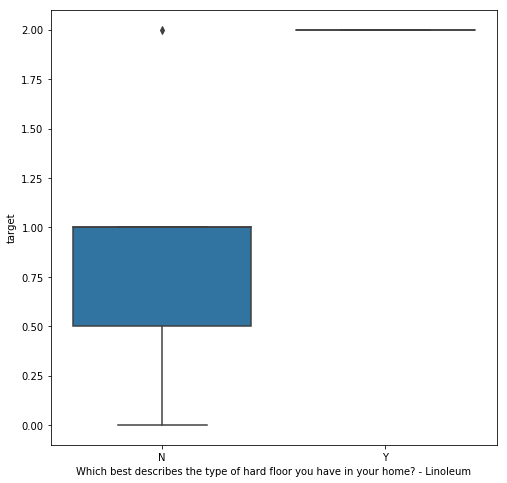

<Figure size 576x576 with 0 Axes>

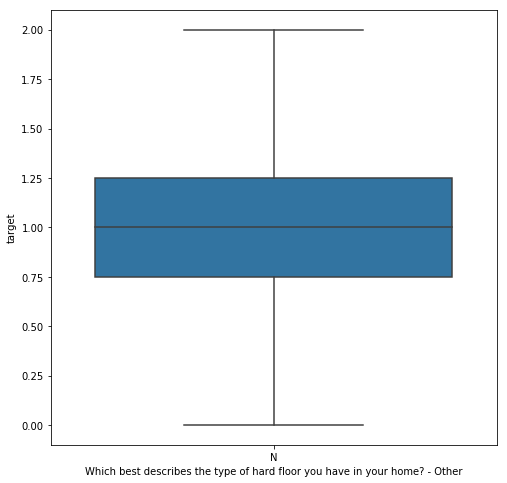

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

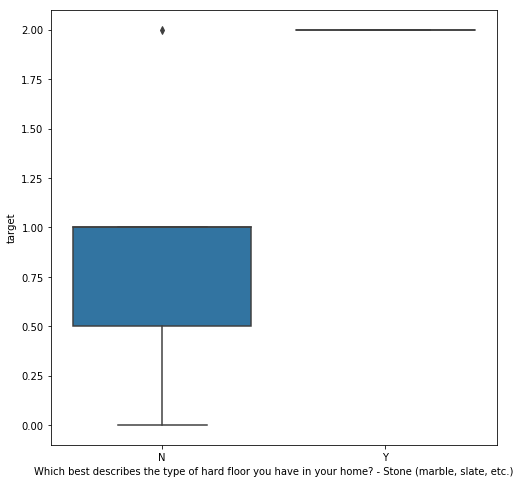

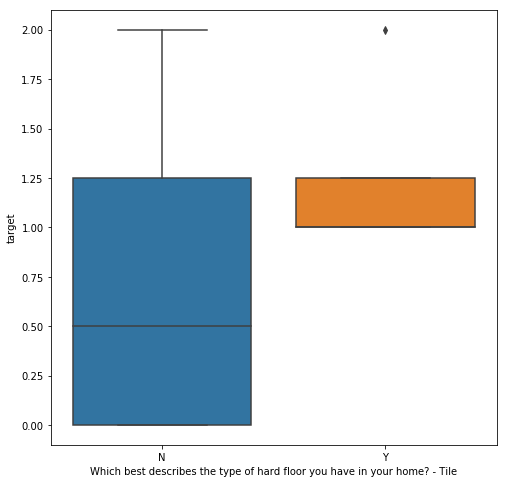

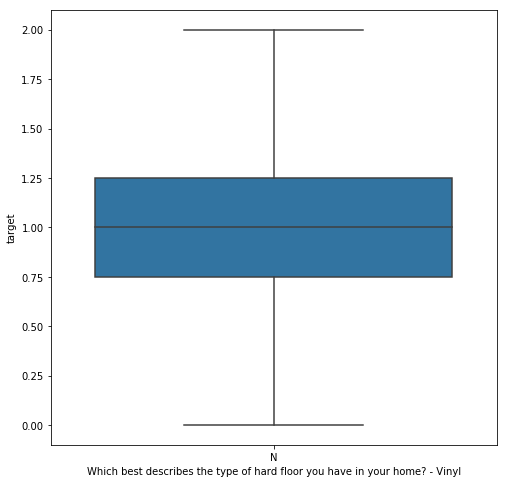

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

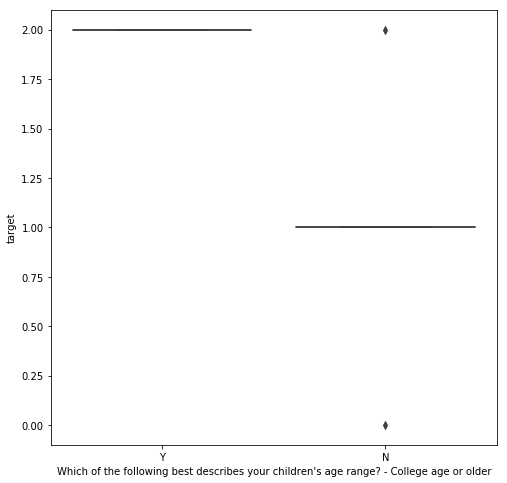

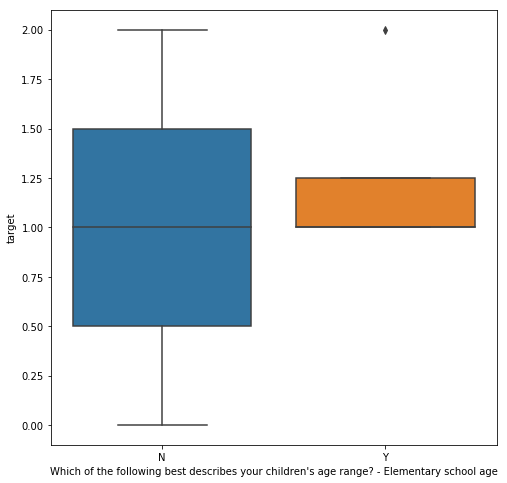

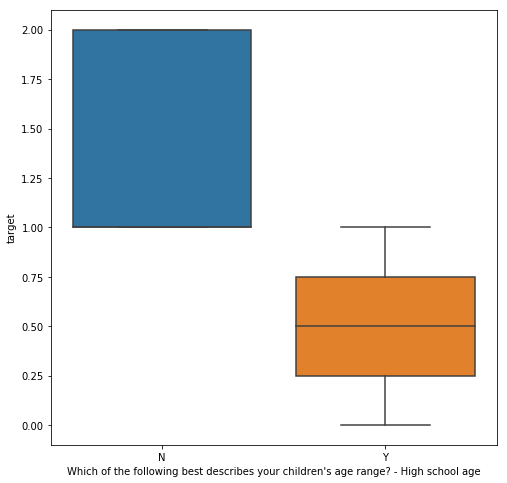

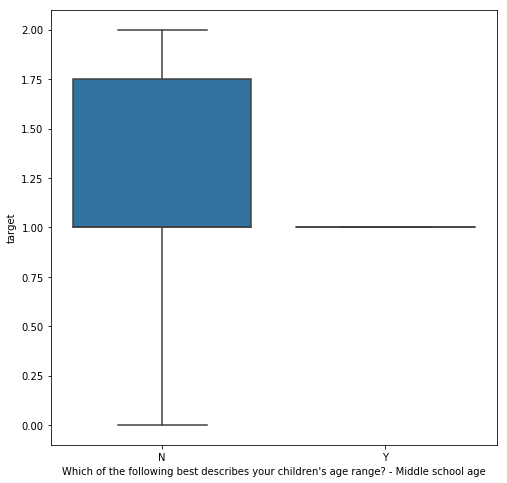

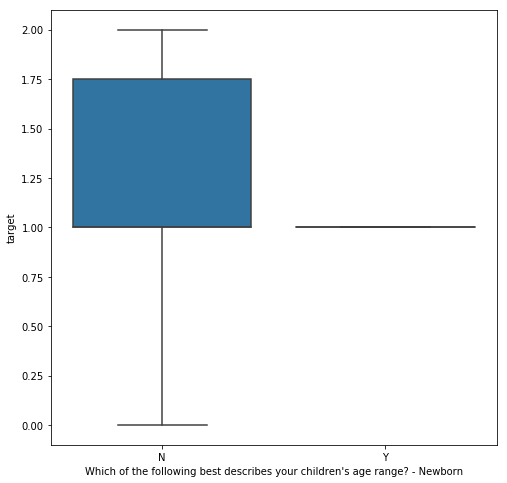

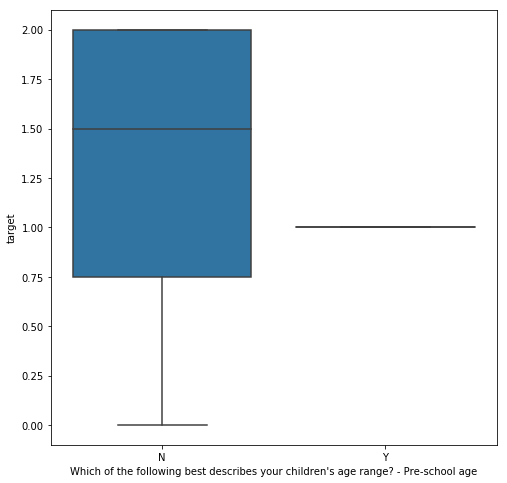

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

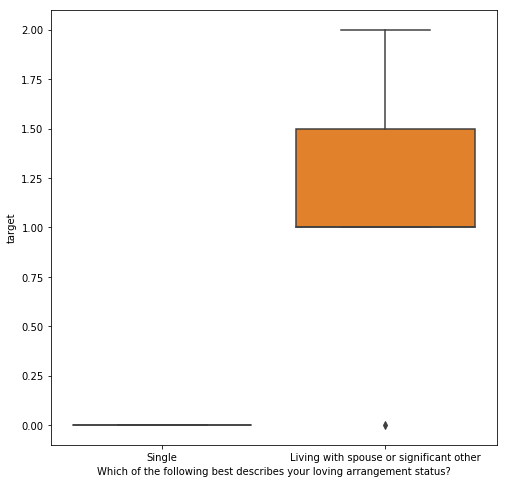

<Figure size 576x576 with 0 Axes>

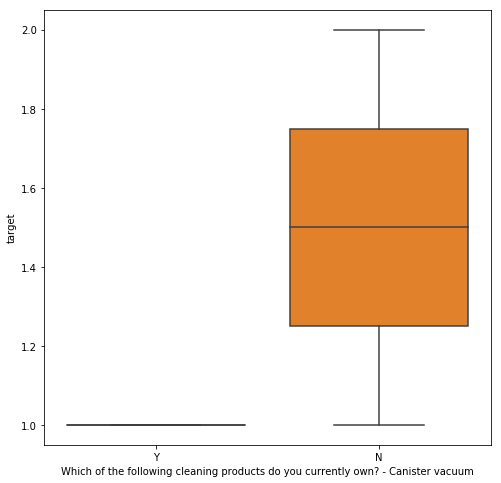

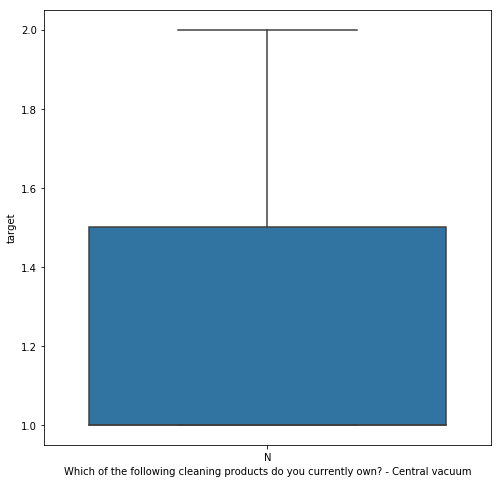

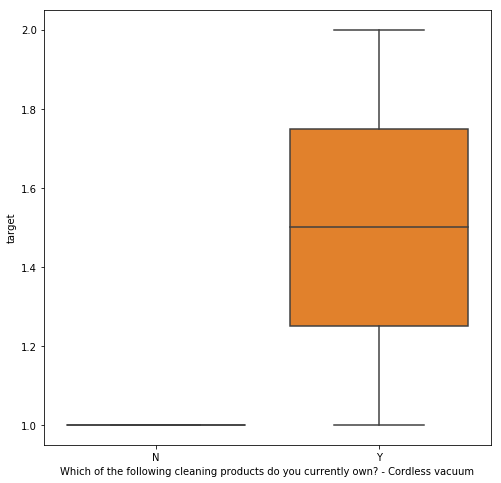

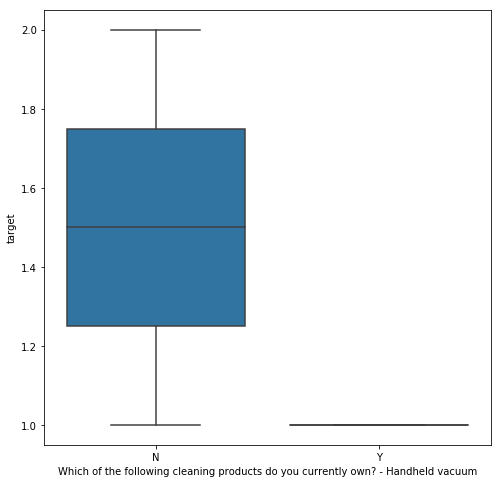

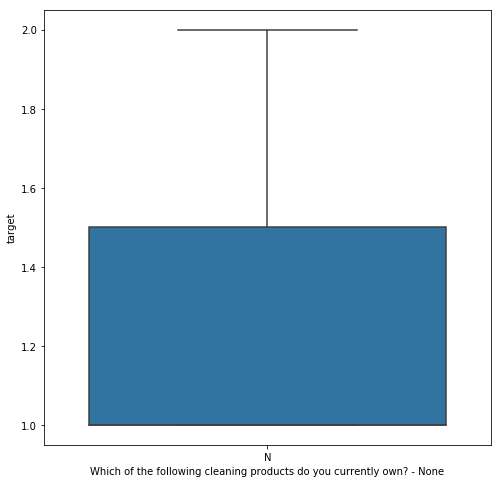

...

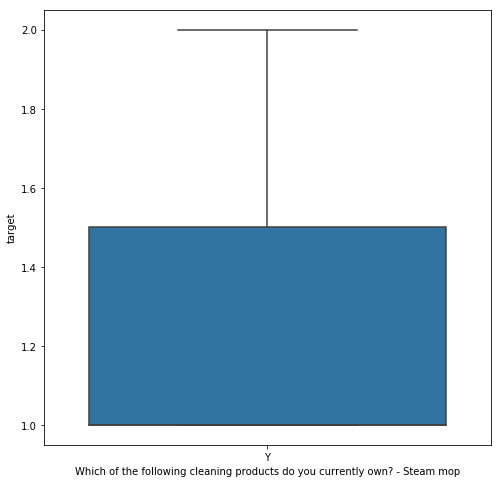

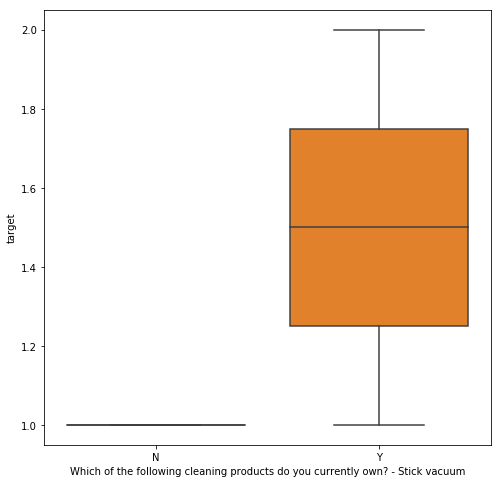

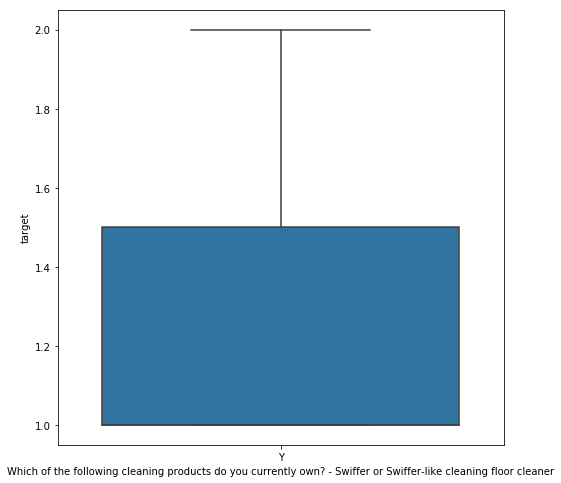

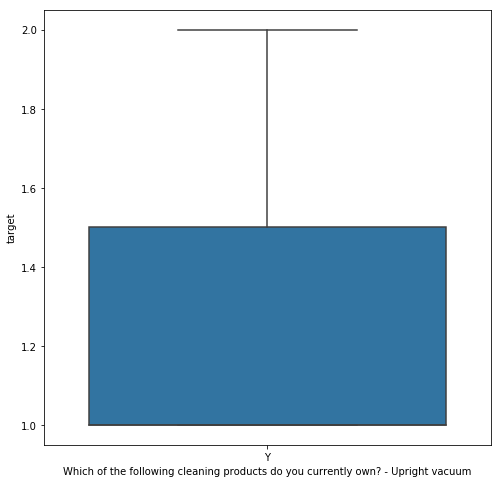

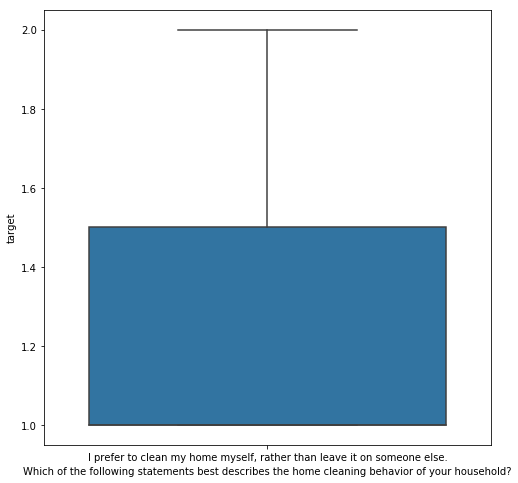

<Figure size 576x576 with 0 Axes>

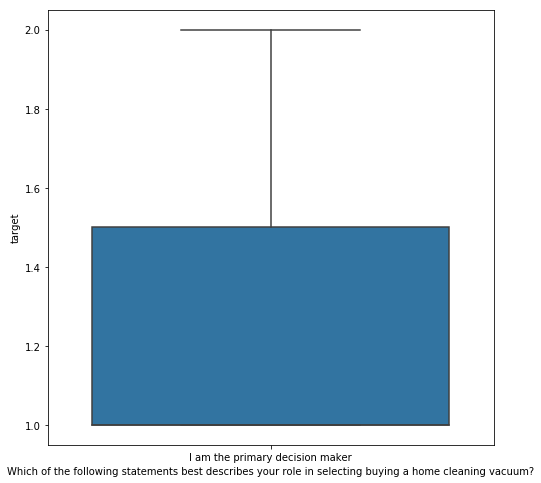

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

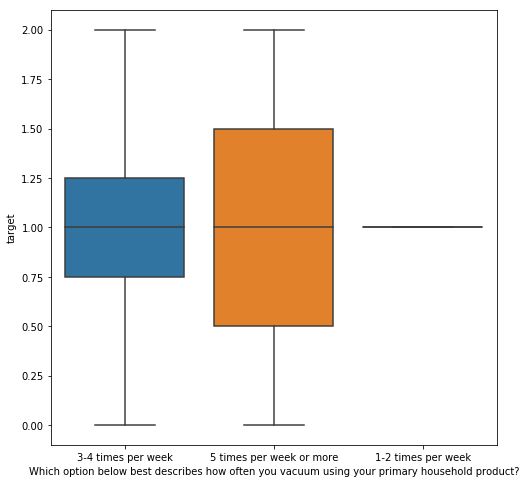

<Figure size 576x576 with 0 Axes>

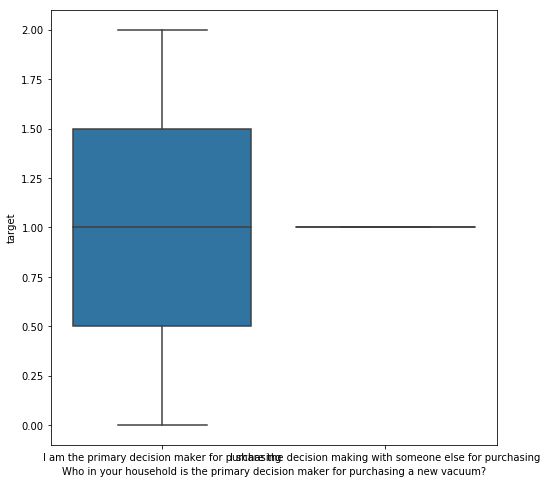

<Figure size 576x576 with 0 Axes>

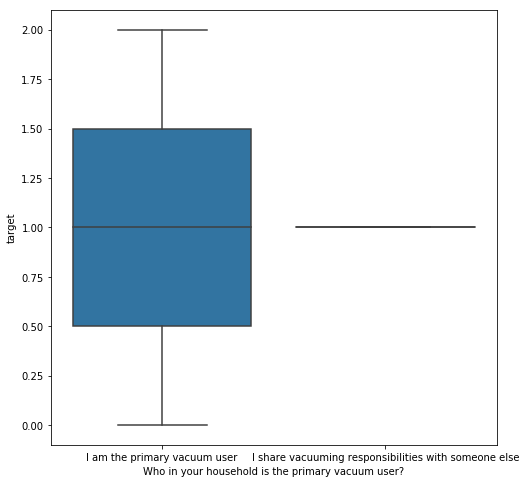

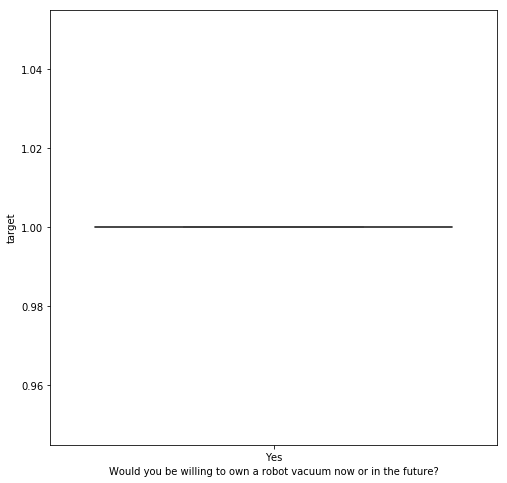

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

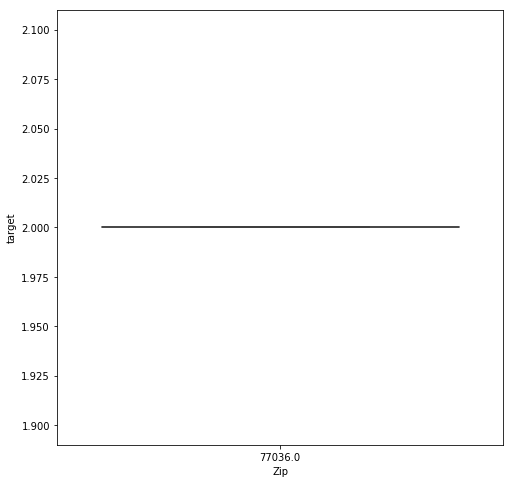

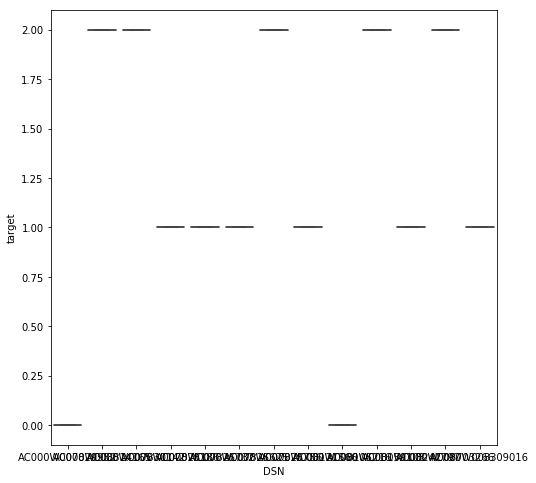

<Figure size 576x576 with 0 Axes>

In [37]:
for i in a.columns:
    try:
        #print(i)
        plt.figure(figsize=(8,8))
        sns.boxplot(x=i, y="target", data=pd.merge(a,b,on='DSN'))
        plt.show()
    except: continue

In [35]:
3+5

8

In [14]:
wb2 = openpyxl.load_workbook('./Downloads/Robot Data Pull 3.12_Part 2.xlsx')

In [15]:
c=pd.DataFrame()
for i in wb2.sheetnames:
    c=c.append(pd.read_excel('./Downloads/Robot Data Pull 3.12_Part 2.xlsx',sheet_name=i))

In [38]:
c=pd.merge(c,emails,left_on='Email',right_on='Email')

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

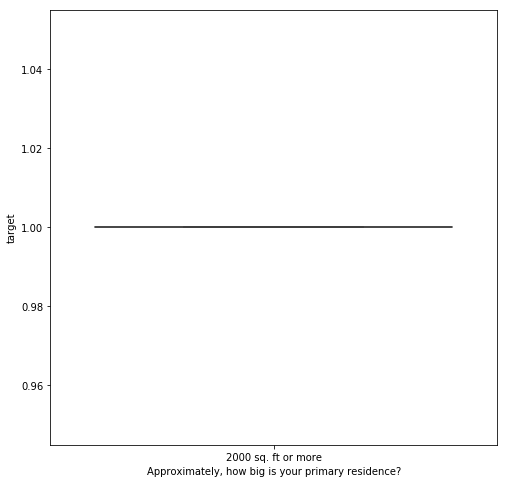

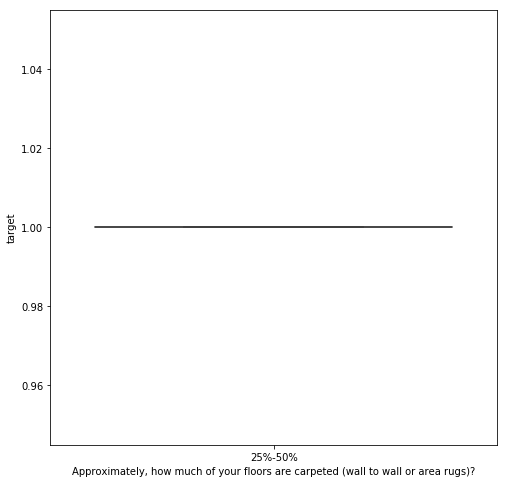

/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

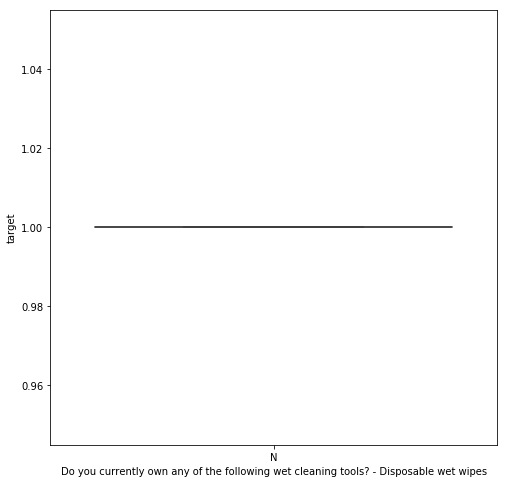

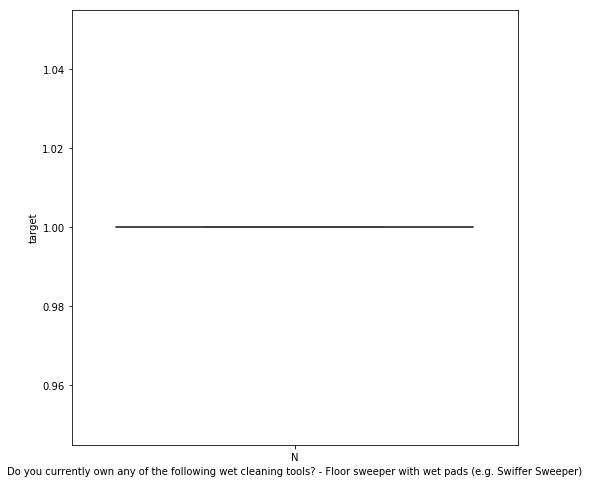

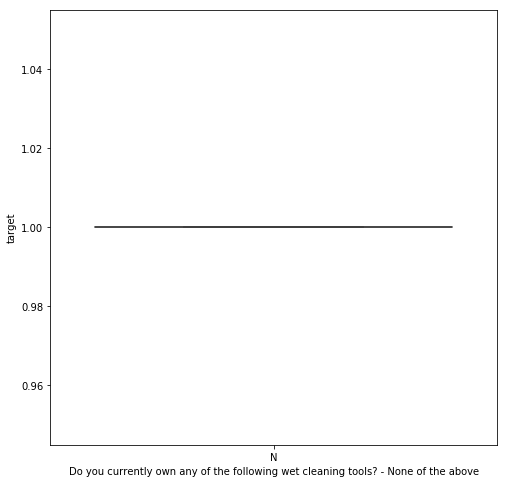

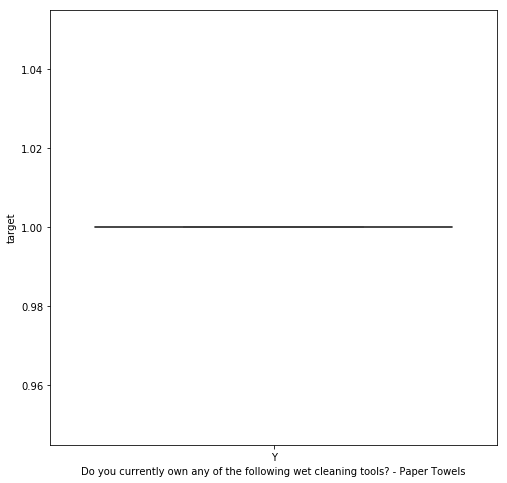

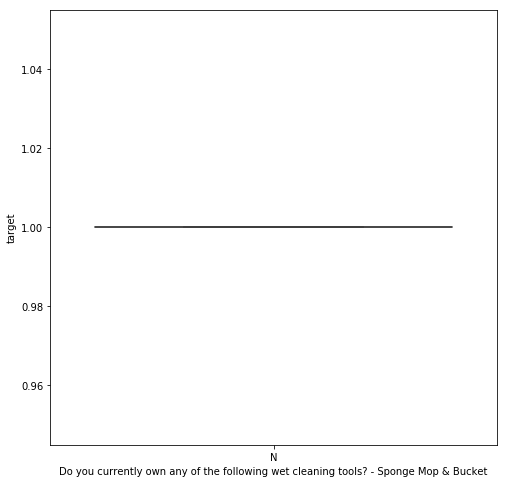

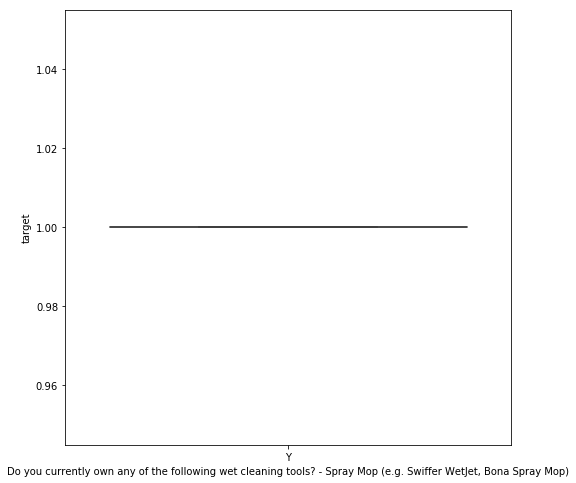

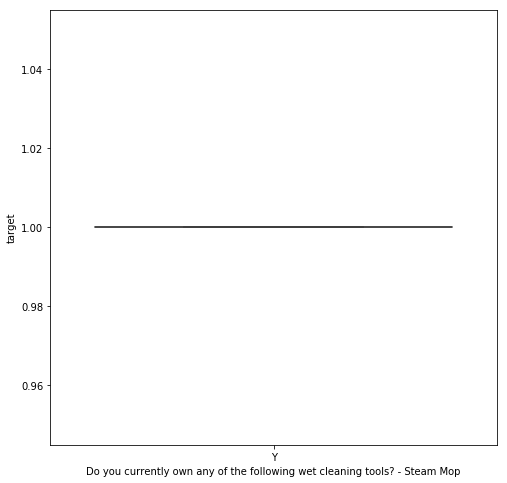

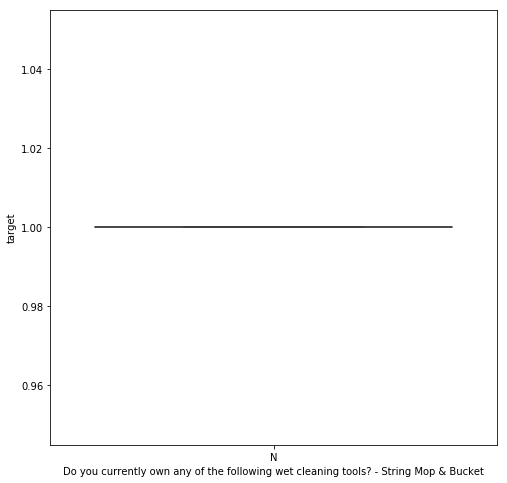

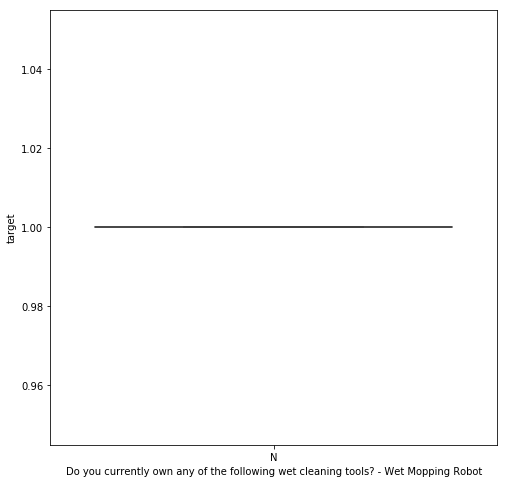

<Figure size 576x576 with 0 Axes>

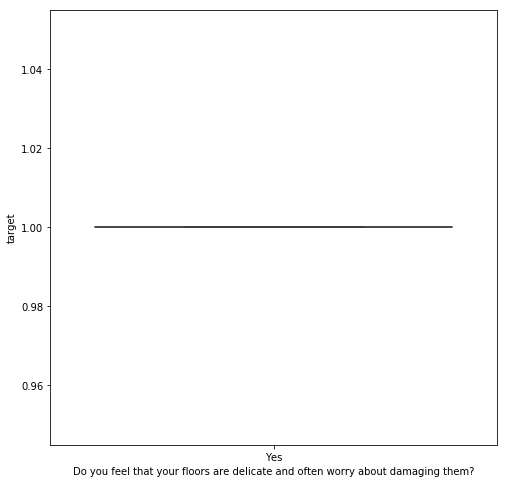

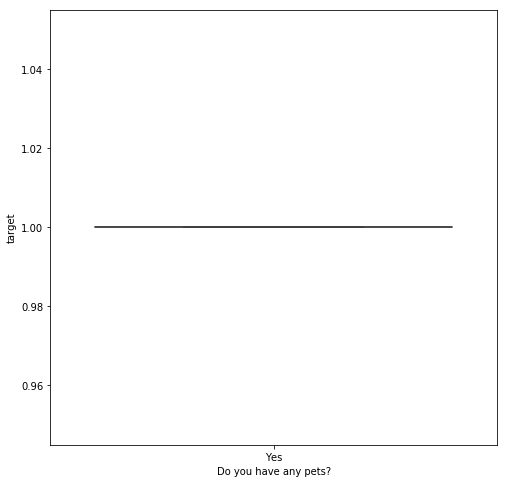

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

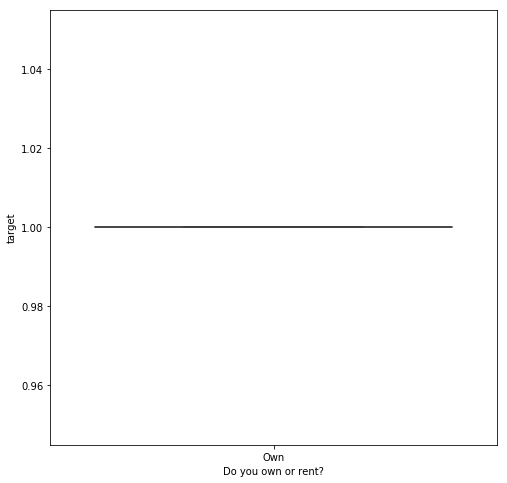

<Figure size 576x576 with 0 Axes>

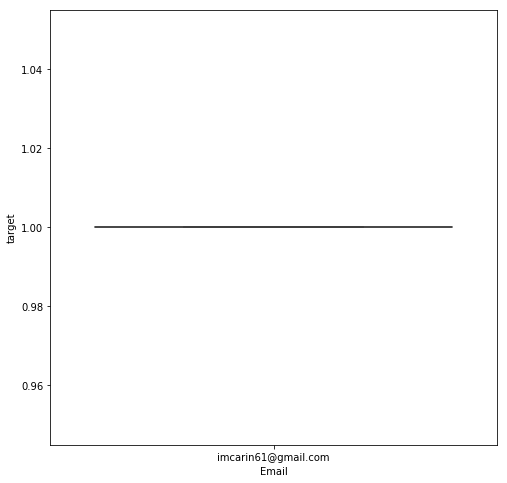

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

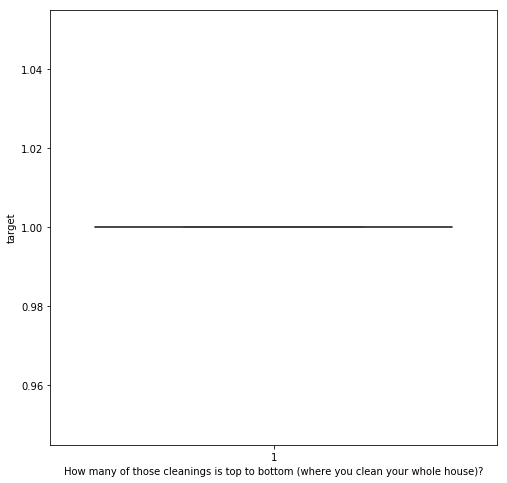

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

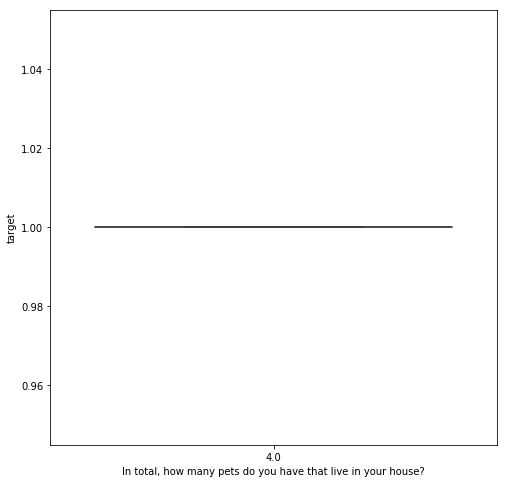

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

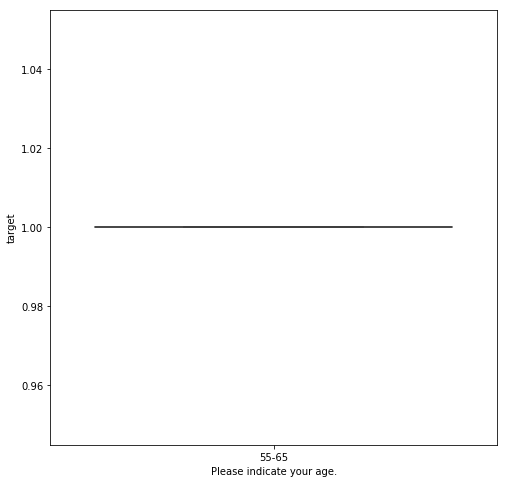

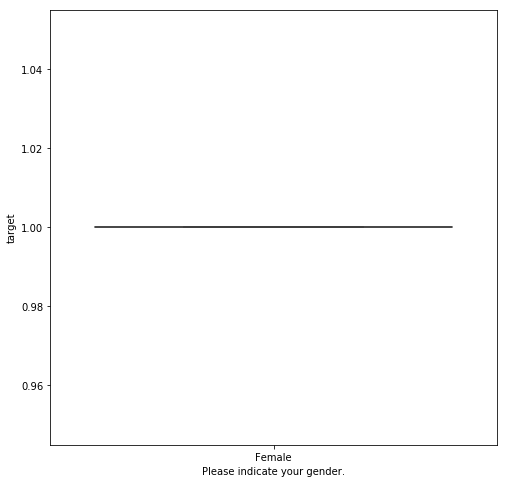

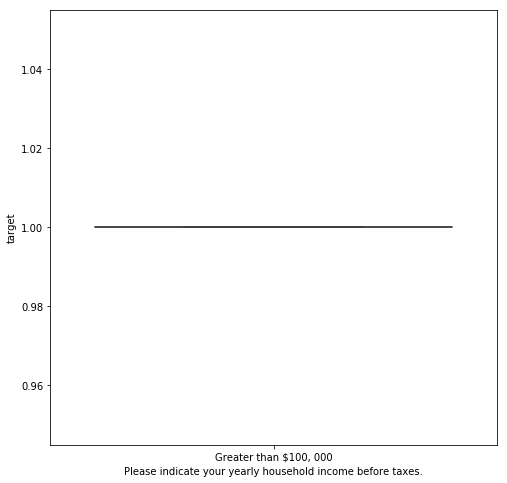

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

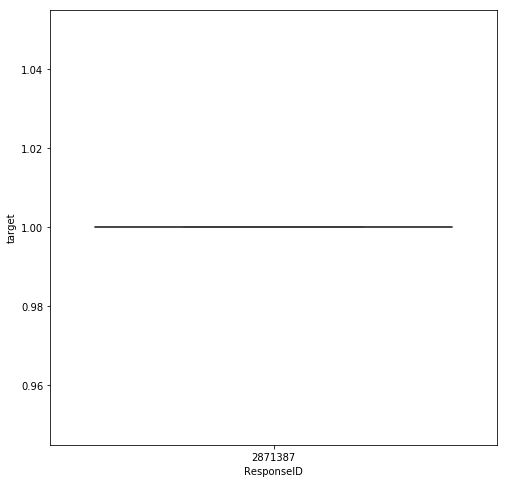

<Figure size 576x576 with 0 Axes>

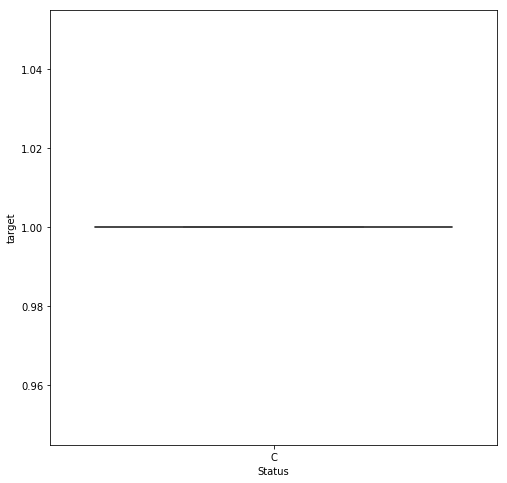

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

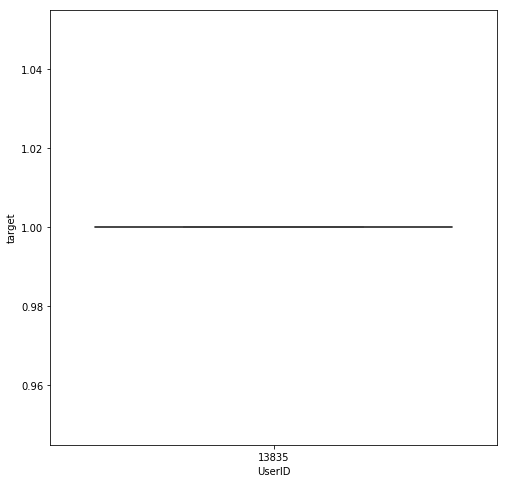

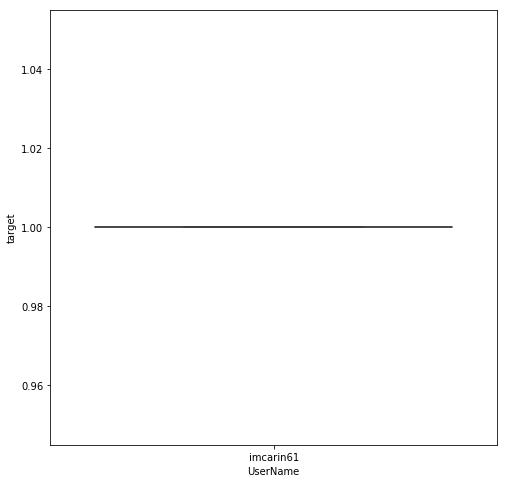

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

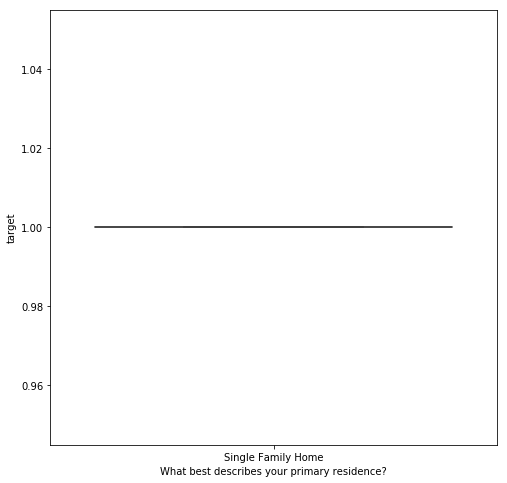

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

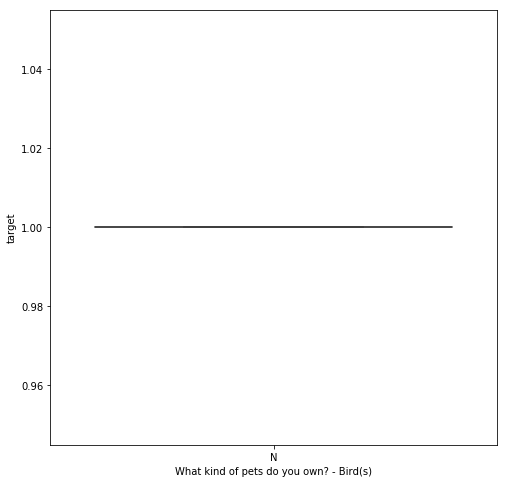

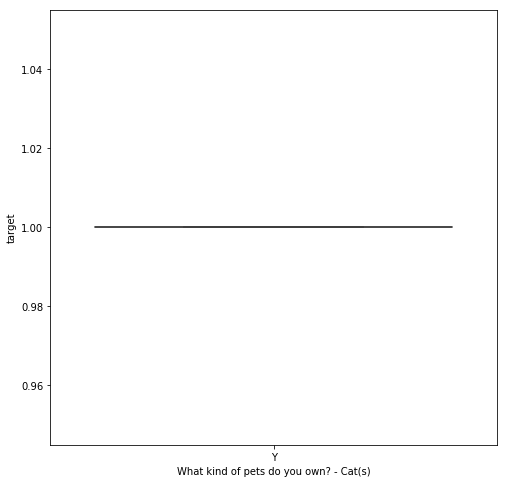

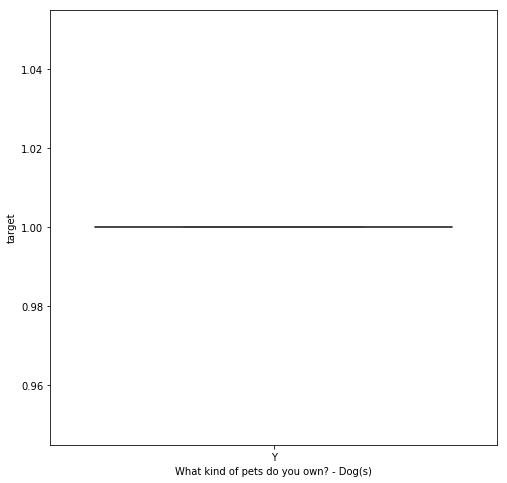

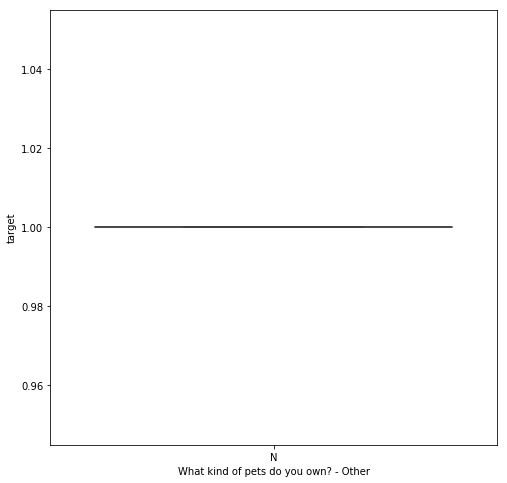

<Figure size 576x576 with 0 Axes>

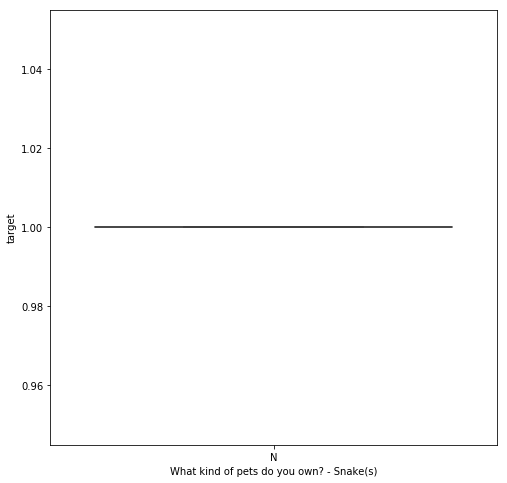

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

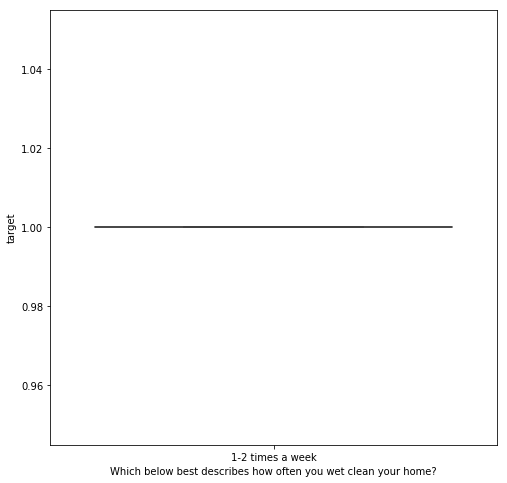

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

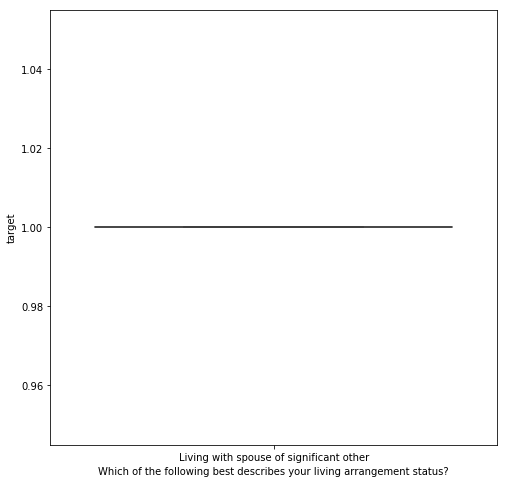

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

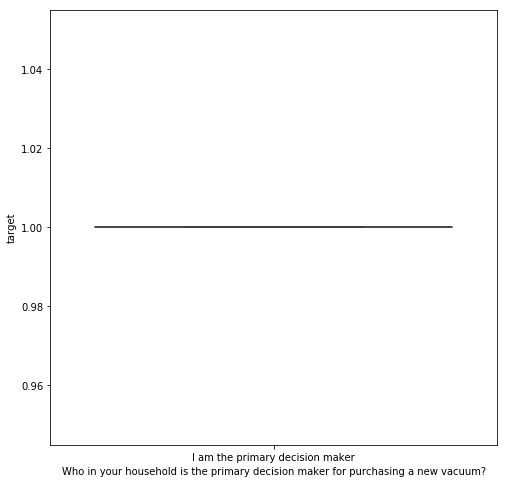

<Figure size 576x576 with 0 Axes>

<Figure size 576x576 with 0 Axes>

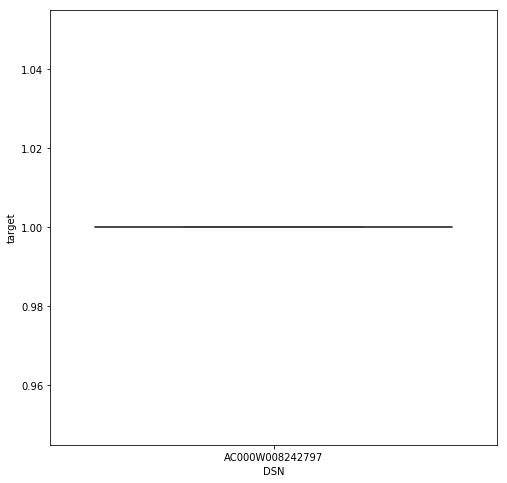

<Figure size 576x576 with 0 Axes>

In [39]:
for i in c.columns:
    try:
        #print(i)
        plt.figure(figsize=(8,8))
        sns.boxplot(x=i, y="target", data=pd.merge(c,b,on='DSN'))
        plt.show()
    except: continue

In [112]:
emails=pd.concat([a['Email'],c['Email']])

In [113]:
emails.to_csv('internal_emails.csv',index=False)

/Users/ycui/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.


In [373]:
a['Approximately how much of your floors are carpeting (wall to wall or area rugs)?']

0               51%-75%
1      Greater than 75%
2               51%-75%
3               25%-50%
4                   NaN
             ...       
200                 NaN
201                 NaN
202                 NaN
203                 NaN
204                 NaN
Name: Approximately how much of your floors are carpeting (wall to wall or area rugs)?, Length: 205, dtype: object

In [374]:
a.shape

(205, 470)

In [604]:
a=np.array([[1,2,3],[3,4,5]])

In [605]:
a

array([[1, 2, 3],
       [3, 4, 5]])

In [606]:
a=pd.DataFrame(a)

In [607]:
a

,0,1,2
0,1,2,3
1,3,4,5


In [610]:
a=pd.read_excel('./Downloads/reviews.xlsx')

In [625]:
cols=str(a.columns).split(' ')

In [639]:
a=pd.read_excel('./Downloads/reviews.xlsx')
df=pd.DataFrame()
for i, row in a.iterrows():
    #print(row)
    row=(str(row.values)[2:-2].split(' '))
    df=df.append(pd.DataFrame(row).T)

In [640]:
df

,0,1,2,3,4,5,6,7,8,9,...,155,156,157,158,159,160,161,162,163,164
0,com.sharkninja.shark,1027,2.2.1,en,flame,2020-02-01T00:08:30Z,1580515710677,2020-02-01T00:08:30Z,1580515710677,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,com.sharkninja.shark,1027,2.2.1,en,star2qltesq,2020-02-01T00:23:14Z,1580516594993,2020-02-01T00:23:14Z,1580516594993,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,com.sharkninja.shark,1027,2.2.1,en,heroqlteatt,2020-02-01T04:05:17Z,1580529917248,2020-02-01T04:05:17Z,1580529917248,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,com.sharkninja.shark,1027,2.2.1,en,d2q,2020-02-01T14:53:11Z,1580568791064,2020-02-01T14:53:11Z,1580568791064,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,com.sharkninja.shark,1027,2.2.1,en,d2q,2020-02-01T16:55:41Z,1580576141721,2020-02-01T16:55:41Z,1580576141721,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,com.sharkninja.shark,1036,2.2.5,zh-Hans,a70q,2020-02-29T19:40:52Z,1583005252290,2020-02-29T19:40:52Z,1583005252290,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,com.sharkninja.shark,1036,2.2.5,en,d2xq,2019-12-14T03:07:37Z,1576292857304,2020-02-29T20:22:43Z,1583007763927,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,com.sharkninja.shark,1036,2.2.5,en,greatqlte,2020-02-29T20:48:28Z,1583009308795,2020-02-29T20:48:28Z,1583009308795,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,com.sharkninja.shark,1036,2.2.5,es,lavender,2020-02-29T21:06:12Z,1583010372241,2020-02-29T21:06:12Z,1583010372241,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [617]:
a

,Package Name App Version Code App Version Name Reviewer Language Device Review Submit Date and Time Review Submit Millis Since Epoch Review Last Update Date and Time Review Last Update Millis Since Epoch Star Rating Review Title Review Text Developer Reply Date and Time Developer Reply Millis Since Epoch Developer Reply Text Review Link
0,com.sharkninja.shark 1027 2.2.1 en flame 2020-...
1,com.sharkninja.shark 1027 2.2.1 en star2qltesq...
2,com.sharkninja.shark 1027 2.2.1 en heroqlteatt...
3,com.sharkninja.shark 1027 2.2.1 en d2q 2020-02...
4,com.sharkninja.shark 1027 2.2.1 en d2q 2020-02...
...,...
276,com.sharkninja.shark 1036 2.2.5 zh-Hans a70q 2...
277,com.sharkninja.shark 1036 2.2.5 en d2xq 2019-1...
278,com.sharkninja.shark 1036 2.2.5 en greatqlte 2...
279,com.sharkninja.shark 1036 2.2.5 es lavender 20...
